# Import Statements

In [1]:
!pip3 install -U matplotlib

     |████████████████████████████████| 10.3MB 7.5MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


In [162]:
import numpy as np
import matplotlib.pyplot as plt
import math
from tqdm.notebook import tqdm
import matplotlib
# plt.rcParams.update({'text.usetex': True})
import seaborn as sns
from pprint import pprint
from copy import copy
import scipy
plt.rcParams.update({'font.size': 17})
print('matplotlib: {}'. format(matplotlib. __version__))
import pickle

matplotlib: 3.4.1


In [2]:
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

In [3]:
! sudo apt-get install texlive-latex-recommended 
! sudo apt install texlive-latex-extra
! sudo apt install dvipng
! sudo apt install cm-super

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-lmodern fonts-noto-mono libcupsfilters1
  libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0 libkpathsea6
  libpotrace0 libptexenc1 libsynctex1 libtexlua52 libtexluajit2 libzzip-0-13
  lmodern poppler-data t1utils tex-common texlive-base texlive-binaries
  texlive-latex-base
Suggested packages:
  fonts-noto poppler-utils ghostscript fonts-japanese-mincho
  | fonts-ipafont-mincho fonts-japanese-gothic | fonts-ipafont-gothic
  fonts-arphic-ukai fonts-arphic-uming fonts-nanum debhelper gv
  | postscript-viewer perl-tk xpdf-reader | pdf-viewer texlive-latex-base-doc
  texlive-latex-recommended-doc texlive-pstricks
The following NEW packages will be installed:
  fonts-d

#Simple Guidelines


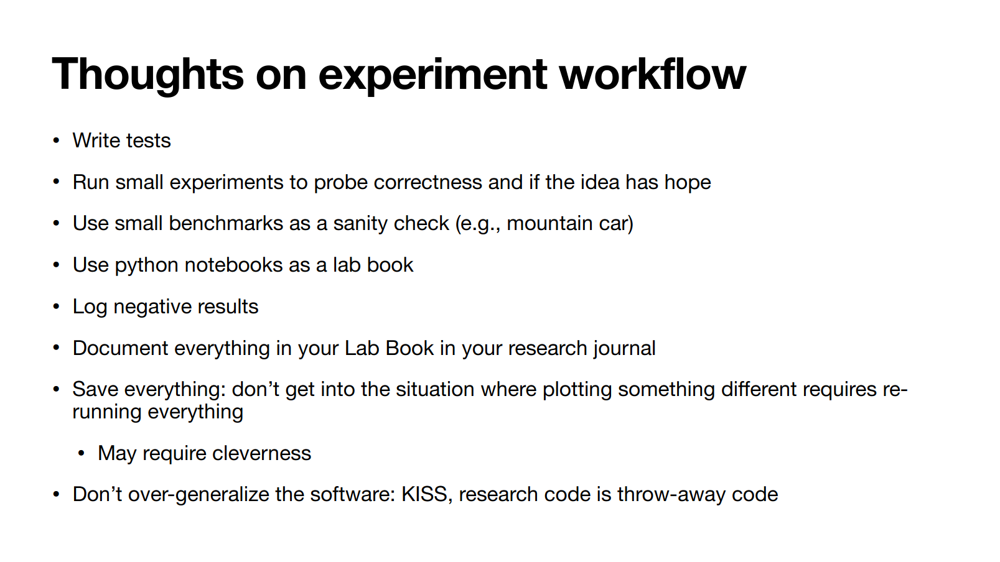

# Agent Code - Tabular

We need code for Q, Double Q, Sarsa, Expected Sarsa, and n-step Sarsa. Potentially need Double Sarsa, Double Expected Sarsa, and Double n-step Sarsa. Tabular agents but need to be able to handle decaying learning rates.

## Q-learning agent

In [4]:
class QLAgent():
    """Class for a Q-learning agent"""
    algorithm = "Q-Learning"
    def __init__(self):
        """Leave agent initialization for agent_init method"""

        self.last_action = None
        self.last_state = None
        self.epsilon = None
        self.gamma = None
        self.alpha = None
        self.num_actions = None
        self.num_states = None
        self.terminate = False
        self.learning_type = None
        self.exploration_type = None
        self.n_s = None
        self.n_sa = None
        self.q = None
        self.rand_generator = None
        self.exponent = None

  
    def agent_init(self, agent_info):
        """Set up the agent at the beginning of the experiment.
        
        Args:
        agent_info (dict), the parameters used to initialize the agent. The dictionary contains:
        {
            num_states (int): the number of states
            num_actions (int): the number of actions
            epsilon (float): the epsilon parameter for exploration
            gamma (float): the gamma discount parameter
            alpha (float): the alpha step size parameter
            seed (int): the seed for the random number generator
            learning_type (int): the alpha learning rate type ie. 0 = fixed alpha, 1 = linear decay, 2 = polynomial decay
            exploration_type (int): the epsilon exploration rate type ie. 0 = fixed epsilon, 1 = decaying epsilon
        }
        """

        self.epsilon = agent_info.get("epsilon", 0.1)
        self.gamma = agent_info.get("gamma", 1.0)
        self.alpha = agent_info.get("alpha", 0.1)
        self.num_states = agent_info.get("num_states", 2)
        self.num_actions = agent_info.get("num_actions", 2)
        self.learning_type = agent_info.get("learning_type", 0)
        self.exploration_type = agent_info.get("exploration_type", 0)
        self.rand_generator = np.random.RandomState(agent_info.get("seed", 0))
        self.n_s = np.zeros((self.num_states))
        self.n_sa = np.zeros((self.num_states, self.num_actions))
        self.q = np.zeros((self.num_states, self.num_actions))
        self.state_action_mapping = agent_info.get("state_action_mapping", None)
        self.exponent = agent_info.get("exponent", 0.8)


    def argmax(self, q_values):
        """argmax with random tie-breaking
        Args:
            q_values (Numpy array): the array of action-values
        Returns:
            action (int): an action with the highest value
        """

        top = float("-inf")
        ties = []
        for i in range(len(q_values)):
            if q_values[i] > top:
                top = q_values[i]
                ties = []

            if q_values[i] == top:
                ties.append(i)

        return self.rand_generator.choice(ties)

    def agent_start(self, state):
        """The first method called when the experiment starts, called after
        the environment starts.
        Args:
            state (int): the state observation from the
                environment's evn_start function.
        Returns:
            The first action the agent takes.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        self.prev_state = state
        self.prev_action = action

        # update n(s,a)
        self.n_sa[state, action] += 1

        return action

    def agent_step(self, reward, state):
        """A step taken by the agent.
        Args:
            reward (float): the reward received for taking the last action taken
            state (int): the state observation from the
                environment's step based on where the agent ended up after the
                last step.
        Returns:
            action (int): the action the agent is taking.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        
        # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent

        # Perform an update
        s_t = self.prev_state
        a_t = self.prev_action
        a = self.argmax(current_q)
        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward + self.gamma*(self.q[state, a]) - self.q[s_t, a_t])

        # update n(s,a)
        self.n_sa[state, action] += 1

        self.prev_state = state
        self.prev_action = action
        return action

    def agent_end(self, reward):
        """Run when the agent terminates.
        Args:
            reward (float): the reward the agent received for entering the
                terminal state.
        """

        # if exploration is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if exploration is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent
        
        # Perform the last update in the episode
        s_t = self.prev_state
        a_t = self.prev_action
        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward - self.q[s_t, a_t])


## Sarsa Agent

In [5]:
class SarsaAgent():
    """Class for a Sarsa agent"""
    algorithm = "Sarsa"
    def __init__(self):
        """Leave agent initialization for agent_init method"""

        self.last_action = None
        self.last_state = None
        self.epsilon = None
        self.gamma = None
        self.alpha = None
        self.num_actions = None
        self.num_states = None
        self.terminate = False
        self.learning_type = None
        self.exploration_type = None
        self.n_s = None
        self.n_sa = None
        self.q = None
        self.rand_generator = None
        self.exponent = None


    def agent_init(self, agent_info):
        """Set up the agent at the beginning of the experiment.
        
        Args:
        agent_info (dict), the parameters used to initialize the agent. The dict\thispagestyle{empty}ionary contains:
        {
            num_states (int): the number of states
            num_actions (int): the number of actions
            epsilon (float): the epsilon parameter for exploration
            gamma (float): the gamma discount parameter
            alpha (float): the alpha step size parameter
            seed (int): the seed for the random number generator
            learning_type (int): the alpha learning rate type ie. 0 = fixed alpha, 1 = linear decay, 2 = polynomial decay
            exploration_type (int): the epsilon exploration rate type ie. 0 = fixed epsilon, 1 = decaying epsilon
        }
        """

        self.epsilon = agent_info.get("epsilon", 0.1)
        self.gamma = agent_info.get("gamma", 1.0)
        self.alpha = agent_info.get("alpha", 0.1)
        self.num_states = agent_info.get("num_states", 2)
        self.num_actions = agent_info.get("num_actions", 2)
        self.learning_type = agent_info.get("learning_type", 0)
        self.exploration_type = agent_info.get("exploration_type", 0)
        self.rand_generator = np.random.RandomState(agent_info.get("seed", 0))
        self.n_s = np.zeros((self.num_states))
        self.n_sa = np.zeros((self.num_states, self.num_actions))
        self.q = np.zeros((self.num_states, self.num_actions))
        self.state_action_mapping = agent_info.get("state_action_mapping", None)
        self.exponent = agent_info.get("exponent", 0.8)

    def argmax(self, q_values):
        """argmax with random tie-breaking
        Args:
            q_values (Numpy array): the array of action-values
        Returns:
            action (int): an action with the highest value
        """

        top = float("-inf")
        ties = []
        for i in range(len(q_values)):
            if q_values[i] > top:
                top = q_values[i]
                ties = []

            if q_values[i] == top:
                ties.append(i)

        return self.rand_generator.choice(ties)

    def agent_start(self, state):
        """The first method called when the experiment starts, called after
        the environment starts.
        Args:
            state (int): the state observation from the
                environment's evn_start function.
        Returns:
            The first action the agent takes.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        self.prev_state = state
        self.prev_action = action

        # update n(s,a)
        self.n_sa[state, action] += 1

        return action

    def agent_step(self, reward, state):
        """A step taken by the agent.
        Args:
            reward (float): the reward received for taking the last action taken
            state (int): the state observation from the
                environment's step based on where the agent ended up after the
                last step.
        Returns:
            action (int): the action the agent is taking.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        # Condition specifically for 1x2 MDP
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        
        # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent

        # Perform an update
        s_t = self.prev_state
        a_t = self.prev_action
        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward + self.gamma*(self.q[state, action]) - self.q[s_t, a_t])

        # update n(s,a)
        self.n_sa[state, action] += 1

        self.prev_state = state
        self.prev_action = action
        return action

    def agent_end(self, reward):
        """Run when the agent terminates.
        Args:
            reward (float): the reward the agent received for entering the
                terminal state.
        """

        # if exploration is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if exploration is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent
        
        # Perform the last update in the episode
        s_t = self.prev_state
        a_t = self.prev_action
        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward - self.q[s_t, a_t])


## n-step Sarsa

In [6]:
class NstepSarsaAgent():
    """Class for a n-step Sarsa agent"""
    algorithm = "n-step Sarsa"
    def __init__(self):
        """Leave agent initialization for agent_init method"""

        self.last_action = None
        self.last_state = None
        self.epsilon = None
        self.gamma = None
        self.alpha = None
        self.num_actions = None
        self.num_states = None
        self.terminate = False
        self.learning_type = None
        self.exploration_type = None
        self.n_s = None
        self.n_sa = None
        self.q = None
        self.rand_generator = None
        self.t = None
        self.T = None
        self.states = None
        self.actions = None
        self.rewards = None
        self.n = None
        self.exponent = None


    def agent_init(self, agent_info):
        """Set up the agent at the beginning of the experiment.
        
        Args:
        agent_info (dict), the parameters used to initialize the agent. The dictionary contains:
        {
            num_states (int): the number of states
            num_actions (int): the number of actions
            epsilon (float): the epsilon parameter for exploration
            gamma (float): the gamma discount parameter
            alpha (float): the alpha step size parameter
            seed (int): the seed for the random number generator
            learning_type (int): the alpha learning rate type ie. 0 = fixed alpha, 1 = linear decay, 2 = polynomial decay
            exploration_type (int): the epsilon exploration rate type ie. 0 = fixed epsilon, 1 = decaying epsilon
            n_steps (int): the number of steps for updates
        }
        """

        self.epsilon = agent_info.get("epsilon", 0.1)
        self.gamma = agent_info.get("gamma", 1.0)
        self.alpha = agent_info.get("alpha", 0.1)
        self.num_states = agent_info.get("num_states", 2)
        self.num_actions = agent_info.get("num_actions", 2)
        self.learning_type = agent_info.get("learning_type", 0)
        self.exploration_type = agent_info.get("exploration_type", 0)
        self.rand_generator = np.random.RandomState(agent_info.get("seed", 0))
        self.n_s = np.zeros((self.num_states))
        self.n_sa = np.zeros((self.num_states, self.num_actions))
        self.q = np.zeros((self.num_states, self.num_actions))
        self.n = agent_info.get("n_steps", 2)
        self.state_action_mapping = agent_info.get("state_action_mapping", None)
        self.exponent = agent_info.get("exponent", 0.8)


    def argmax(self, q_values):
        """argmax with random tie-breaking
        Args:
            q_values (Numpy array): the array of action-values
        Returns:
            action (int): an action with the highest value
        """

        top = float("-inf")
        ties = []
        for i in range(len(q_values)):
            if q_values[i] > top:
                top = q_values[i]
                ties = []

            if q_values[i] == top:
                ties.append(i)

        return self.rand_generator.choice(ties)

    def agent_start(self, state):
        """The first method called when the experiment starts, called after
        the environment starts.
        Args:
            state (int): the state observation from the
                environment's evn_start function.
        Returns:
            The first action the agent takes.
        """
        # re-set t, T, states, actions, rewards for new episode
        self.t = 0
        self.T = np.inf
        self.states = []
        self.actions = []
        self.rewards = []

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        self.prev_state = state
        self.prev_action = action

        # update n(s,a)
        self.n_sa[state, action] += 1

        # update history
        self.states.append(state)
        self.actions.append(action)
        self.rewards.append(0)

        return action

    def agent_step(self, reward, state):
        """A step taken by the agent.
        Args:
            reward (float): the reward received for taking the last action taken
            state (int): the state observation from the
                environment's step based on where the agent ended up after the
                last step.
        Returns:
            action (int): the action the agent is taking.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)


        # update history
        self.states.append(state)
        self.actions.append(action)
        self.rewards.append(reward)

        # calculate tau, the time period we are updating
        tau = self.t - self.n + 1

        # check tau >= 0 ie. we are past first n steps and can update
        if tau >= 0:
            # if learning is type 1, update alpha to be 1/n(s,a) using state/action being updated
            if self.learning_type == 1:
                self.alpha = 1/self.n_sa[self.states[tau], self.actions[tau]]
            # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using state/action being updated
            elif self.learning_type == 2:
                self.alpha = 1/self.n_sa[self.states[tau], self.actions[tau]]**self.exponent

            # calculate n step return
            G = 0
            for i in range(tau + 1, tau + self.n + 1):
                G += np.power(self.gamma, i - tau - 1) * self.rewards[i]
            G += np.power(self.gamma, self.n) * self.q[state, action]

            # Perform an update
            self.q[self.states[tau], self.actions[tau]] = self.q[self.states[tau], self.actions[tau]] + self.alpha * (G - self.q[self.states[tau], self.actions[tau]])

        # update n(s,a)
        self.n_sa[state, action] += 1

        self.prev_state = state
        self.prev_action = action
        self.t += 1
        return action

    def agent_end(self, reward):
        """Run when the agent terminates.
        Args:
            reward (float): the reward the agent received for entering the
                terminal state.
        """
        # record terminal step
        self.T = self.t + 1

        #update history
        self.rewards.append(reward)

        # loop through last n updates
        while True:
            # calculate tau, the state we are updating 
            tau = self.t - self.n + 1
            # if tau is the terminal state we stop updating
            if tau == self.T:
                break
            # check tau >= 0 ie. we are past first n steps and can update
            if tau >= 0:
                # if learning is type 1, update alpha to be 1/n(s,a) using state/action being updated
                if self.learning_type == 1:
                    self.alpha = 1/self.n_sa[self.states[tau], self.actions[tau]]
                # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using state/action being updated
                elif self.learning_type == 2:
                    self.alpha = 1/self.n_sa[self.states[tau], self.actions[tau]]**self.exponent

                # calculate n step return
                G = 0
                for i in range(tau + 1, self.T + 1):
                    G += np.power(self.gamma, i - tau - 1) * self.rewards[i]
                
                # perform update 
                self.q[self.states[tau], self.actions[tau]] = self.q[self.states[tau], self.actions[tau]] + self.alpha * (G - self.q[self.states[tau], self.actions[tau]])
            # increment t
            self.t += 1


## Expected Sarsa Agent

In [7]:
class ExpectedSarsaAgent():
    """Class for an Expected Sarsa agent"""
    algorithm = "Expected Sarsa"
    def __init__(self):
        """Leave agent initialization for agent_init method"""

        self.last_action = None
        self.last_state = None
        self.epsilon = None
        self.gamma = None
        self.alpha = None
        self.num_actions = None
        self.num_states = None
        self.terminate = False
        self.learning_type = None
        self.exploration_type = None
        self.n_s = None
        self.n_sa = None
        self.q = None
        self.rand_generator = None
        self.algorithm = 'Expected Sarsa'
        self.exponent = None


    def agent_init(self, agent_info):
        """Set up the agent at the beginning of the experiment.
        
        Args:
        agent_info (dict), the parameters used to initialize the agent. The dictionary contains:
        {
            num_states (int): the number of states
            num_actions (int): the number of actions
            epsilon (float): the epsilon parameter for exploration
            gamma (float): the gamma discount parameter
            alpha (float): the alpha step size parameter
            seed (int): the seed for the random number generator
            learning_type (int): the alpha learning rate type ie. 0 = fixed alpha, 1 = linear decay, 2 = polynomial decay
            exploration_type (int): the epsilon exploration rate type ie. 0 = fixed epsilon, 1 = decaying epsilon
        }
        """

        self.epsilon = agent_info.get("epsilon", 0.1)
        self.gamma = agent_info.get("gamma", 1.0)
        self.alpha = agent_info.get("alpha", 0.1)
        self.num_states = agent_info.get("num_states", 2)
        self.num_actions = agent_info.get("num_actions", 2)
        self.learning_type = agent_info.get("learning_type", 0)
        self.exploration_type = agent_info.get("exploration_type", 0)
        self.rand_generator = np.random.RandomState(agent_info.get("seed", 0))
        self.n_s = np.zeros((self.num_states))
        self.n_sa = np.zeros((self.num_states, self.num_actions))
        self.q = np.zeros((self.num_states, self.num_actions))
        self.state_action_mapping = agent_info.get("state_action_mapping", None)
        self.exponent = agent_info.get("exponent", 0.8)

    def argmax(self, q_values):
        """argmax with random tie-breaking
        Args:
            q_values (Numpy array): the array of action-values
        Returns:
            action (int): an action with the highest value
        """

        top = float("-inf")
        ties = []
        for i in range(len(q_values)):
            if q_values[i] > top:
                top = q_values[i]
                ties = []

            if q_values[i] == top:
                ties.append(i)

        return self.rand_generator.choice(ties)

    def agent_start(self, state):
        """The first method called when the experiment starts, called after
        the environment starts.
        Args:
            state (int): the state observation from the
                environment's evn_start function.
        Returns:
            The first action the agent takes.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        self.prev_state = state
        self.prev_action = action

        # update n(s,a)
        self.n_sa[state, action] += 1

        return action

    def agent_step(self, reward, state):
        """A step taken by the agent.
        Args:
            reward (float): the reward received for taking the last action taken
            state (int): the state observation from the
                environment's step based on where the agent ended up after the
                last step.
        Returns:
            action (int): the action the agent is taking.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        if self.state_action_mapping:
            current_q = self.q[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            current_q = self.q[state,:]
            num_actions = self.num_actions
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        
        # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent

        # Perform an update
        s_t = self.prev_state
        a_t = self.prev_action
        #get greedy action
        a = self.argmax(current_q)
        #we have a 1 - epsilon chance of selecting greedy action
        exp_q = 0
        exp_q += (1.0 - self.epsilon)*current_q[a]
        #every action has epsilon/num_actions chance of being randomly selected
        for i in range(len(current_q)):
            exp_q += (self.epsilon/num_actions)*current_q[i]

        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward + self.gamma*exp_q - self.q[s_t, a_t])

        # update n(s,a)
        self.n_sa[state, action] += 1

        self.prev_state = state
        self.prev_action = action
        return action

    def agent_end(self, reward):
        """Run when the agent terminates.
        Args:
            reward (float): the reward the agent received for entering the
                terminal state.
        """

        # if exploration is type 1, update alpha to be 1/n(s,a) using previous state/action
        if self.learning_type == 1:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]
        # else if exploration is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
        elif self.learning_type == 2:
            self.alpha = 1/self.n_sa[self.prev_state, self.prev_action]**self.exponent
        
        # Perform the last update in the episode
        s_t = self.prev_state
        a_t = self.prev_action
        self.q[s_t, a_t] = self.q[s_t, a_t] + self.alpha * (reward - self.q[s_t, a_t])


## Double Q-learning Agent

In [8]:
class DoubleQLAgent():
    """Class for a Double Q-learning agent"""
    algorithm = "Double Q-Learning"
    def __init__(self):
        """Leave agent initialization for agent_init method"""

        self.last_action = None
        self.last_state = None
        self.epsilon = None
        self.gamma = None
        self.alpha = None
        self.num_actions = None
        self.num_states = None
        self.terminate = False
        self.learning_type = None
        self.exploration_type = None
        self.n_s = None
        self.n_sa_A = None
        self.n_sa_B = None
        self.q_A = None
        self.q_B = None
        self.rand_generator = None
        self.algorithm = 'Double Q-Learning'


    def agent_init(self, agent_info):
        """Set up the agent at the beginning of the experiment.
        
        Args:
        agent_info (dict), the parameters used to initialize the agent. The dictionary contains:
        {
            num_states (int): the number of states
            num_actions (int): the number of actions
            epsilon (float): the epsilon parameter for exploration
            gamma (float): the gamma discount parameter
            alpha (float): the alpha step size parameter
            seed (int): the seed for the random number generator
            learning_type (int): the alpha learning rate type ie. 0 = fixed alpha, 1 = linear decay, 2 = polynomial decay
            exploration_type (int): the epsilon exploration rate type ie. 0 = fixed epsilon, 1 = decaying epsilon
        }
        """

        self.epsilon = agent_info.get("epsilon", 0.1)
        self.gamma = agent_info.get("gamma", 1.0)
        self.alpha = agent_info.get("alpha", 0.1)
        self.num_states = agent_info.get("num_states", 2)
        self.num_actions = agent_info.get("num_actions", 2)
        self.learning_type = agent_info.get("learning_type", 0)
        self.exploration_type = agent_info.get("exploration_type", 0)
        self.rand_generator = np.random.RandomState(agent_info.get("seed", 0))
        self.n_s = np.zeros((self.num_states))
        self.n_sa_A = np.zeros((self.num_states, self.num_actions))
        self.n_sa_B = np.zeros((self.num_states, self.num_actions))
        self.q_A = np.zeros((self.num_states, self.num_actions))
        self.q_B = np.zeros((self.num_states, self.num_actions))
        self.state_action_mapping = agent_info.get("state_action_mapping", None)

    def argmax(self, q_values):
        """argmax with random tie-breaking
        Args:
            q_values (Numpy array): the array of action-values
        Returns:
            action (int): an action with the highest value
        """

        top = float("-inf")
        ties = []
        for i in range(len(q_values)):
            if q_values[i] > top:
                top = q_values[i]
                ties = []

            if q_values[i] == top:
                ties.append(i)

        return self.rand_generator.choice(ties)

    def agent_start(self, state):
        """The first method called when the experiment starts, called after
        the environment starts.
        Args:
            state (int): the state observation from the
                environment's evn_start function.
        Returns:
            The first action the agent takes.
        """

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy
        # first use combined Q_A and Q_B values for action selection

        if self.state_action_mapping:
            q_values_A = self.q_A[state, self.state_action_mapping[state]]
            q_values_B = self.q_B[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            q_values_A = self.q_A[state, :]
            q_values_B = self.q_B[state, :]
            num_actions = self.num_actions
        current_q = q_values_A + q_values_B
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        
        #update previous state and action
        self.prev_state = state
        self.prev_action = action

        return action

    def agent_step(self, reward, state):
        """A step taken by the agent.
        Args:
            reward (float): the reward received for taking the last action taken
            state (int): the state observation from the
                environment's step based on where the agent ended up after the
                last step.
        Returns:
            action (int): the action the agent is taking.
        """

        

        #randomly choose updating Q_A or Q_B
        if self.rand_generator.rand() < 0.5:
            #updating Q_A
            #first update n(s,a) count for Q_A
            self.n_sa_A[self.prev_state, self.prev_action] += 1
            # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
            if self.learning_type == 1:
                self.alpha = 1/self.n_sa_A[self.prev_state, self.prev_action]
            # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
            elif self.learning_type == 2:
                self.alpha = 1/self.n_sa_A[self.prev_state, self.prev_action]**0.8
            #perform an update
            s_t = self.prev_state
            a_t = self.prev_action
            a = self.argmax(self.q_A[state,:])
            if self.state_action_mapping:
                a = self.argmax(self.q_A[state, self.state_action_mapping[state]])
            self.q_A[s_t, a_t] = self.q_A[s_t, a_t] + self.alpha * (reward + self.gamma*(self.q_B[state, a]) - self.q_A[s_t, a_t])
        else:
            #updating Q_B
            #first update n(s,a) count for Q_B
            self.n_sa_B[self.prev_state, self.prev_action] += 1
            # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
            if self.learning_type == 1:
                self.alpha = 1/self.n_sa_B[self.prev_state, self.prev_action]
            # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
            elif self.learning_type == 2:
                self.alpha = 1/self.n_sa_B[self.prev_state, self.prev_action]**0.8
            #perform an update
            s_t = self.prev_state
            a_t = self.prev_action
            b = self.argmax(self.q_B[state,:])
            if self.state_action_mapping:
                b = self.argmax(self.q_B[state, self.state_action_mapping[state]])
            self.q_B[s_t, a_t] = self.q_B[s_t, a_t] + self.alpha * (reward + self.gamma*(self.q_A[state, b]) - self.q_B[s_t, a_t])

        # update n(s)
        self.n_s[state] += 1
        # if exploration is type 1, update epsilon to be 1/n(s)^(1/2)
        if self.exploration_type == 1:
            self.epsilon = 1/math.sqrt(self.n_s[state])
        
        # Choose action using epsilon greedy

        if self.state_action_mapping:
            q_values_A = self.q_A[state, self.state_action_mapping[state]]
            q_values_B = self.q_B[state, self.state_action_mapping[state]]
            num_actions = len(self.state_action_mapping[state])
        else:
            q_values_A = self.q_A[state, :]
            q_values_B = self.q_B[state, :]
            num_actions = self.num_actions

        current_q = q_values_A + q_values_B
        if self.rand_generator.rand() < self.epsilon:
            action = self.rand_generator.randint(num_actions)
        else:
            action = self.argmax(current_q)
        
        self.prev_state = state
        self.prev_action = action

        return action

    def agent_end(self, reward):
        """Run when the agent terminates.
        Args:
            reward (float): the reward the agent received for entering the
                terminal state.
        """

        #perform last update
        #randomly choose updating Q_A or Q_B
        if self.rand_generator.rand() < 0.5:
            #updating Q_A
            #first update n(s,a) count for Q_A
            self.n_sa_A[self.prev_state, self.prev_action] += 1
            # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
            if self.learning_type == 1:
                self.alpha = 1/self.n_sa_A[self.prev_state, self.prev_action]
            # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
            elif self.learning_type == 2:
                self.alpha = 1/self.n_sa_A[self.prev_state, self.prev_action]**0.8
            #perform an update
            s_t = self.prev_state
            a_t = self.prev_action
            self.q_A[s_t, a_t] = self.q_A[s_t, a_t] + self.alpha * (reward - self.q_A[s_t, a_t])
        else:
            #updating Q_B
            #first update n(s,a) count for Q_B
            self.n_sa_B[self.prev_state, self.prev_action] += 1
            # if learning is type 1, update alpha to be 1/n(s,a) using previous state/action
            if self.learning_type == 1:
                self.alpha = 1/self.n_sa_B[self.prev_state, self.prev_action]
            # else if learning is type 2, update alpha to be 1/n(s,a)^0.8 using previous state/action
            elif self.learning_type == 2:
                self.alpha = 1/self.n_sa_B[self.prev_state, self.prev_action]**0.8
            #perform an update
            s_t = self.prev_state
            a_t = self.prev_action
            self.q_B[s_t, a_t] = self.q_B[s_t, a_t] + self.alpha * (reward - self.q_B[s_t, a_t])


# Environments

Will start with the simple 3x3 grid world from original double q paper and the simple mdp from the text, later can add roulette and other more complex environments if possible/necessary

## 3x3 Grid World

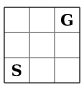

In [9]:
class SmallGridWorldEnvironment():
    def env_init(self, env_info):
        """Setup for the environment called when the experiment first starts.
                Note:
                    Initialize a tuple with the reward, first state, boolean
                    indicating if it's terminal.
                """

        # Set the default height to 3 and width to 13 
        self.grid_h = 3
        self.grid_w = 3

        # Starting location of agent is the bottom-left corner, (max x, min y).
        self.start_loc = (2, 0)
        # Goal location is the top-right corner. (min x, max y).
        self.goal_loc = (0, self.grid_w - 1)
        # Random generator - https://numpy.org/doc/stable/reference/random/generator.html
        self.rng = np.random.default_rng(seed = env_info.get("seed", None))
        self.reward_info = env_info.get("reward_info", {"type":0, "offset": 0})

    def get_reward(self):
        if self.reward_info["type"] == 0: # Offset 10 and -12 by a constant factor 
            if self.rng.random() < 0.5:
                reward = -12 - self.reward_info["offset"]
            else:
                reward = 10 + self.reward_info["offset"]
        elif self.reward_info["type"] == 1: #Sample rewards from a Normal Distribution with mu=1, variance=variable
            reward = self.rng.normal(loc = -1, scale=self.reward_info["std_dev"])
        return reward              

    def env_start(self):
        """The first method called when the episode starts, called before the
            agent starts.

            Returns:
                The first state from the environment.
            """
        reward = 0
        # agent_loc will hold the current location of the agent
        self.agent_loc = self.start_loc
        # state is the one dimensional state representation of the agent location.
        state = self.state(self.agent_loc)
        termination = False
        self.reward_state_term = (reward, state, termination)

        return self.reward_state_term[1]

    def env_step(self, action):
        """A step taken by the environment.

            Args:
                action: The action taken by the agent

            Returns:
                (float, state, Boolean): a tuple of the reward, state,
                    and boolean indicating if it's terminal.
            """
        x, y = self.agent_loc

        # UP
        if action == 0:
            x = x - 1

        # LEFT
        elif action == 1:
            y = y - 1

        # DOWN
        elif action == 2:
            x = x + 1

        # RIGHT
        elif action == 3:
            y = y + 1

        # Invalid Action
        else:
            raise Exception(str(action) + " not in recognized actions [0: Up, 1: Left, 2: Down, 3: Right]!")

        # if the action takes the agent out-of-bounds
        # then the agent stays in the same state
        if not self.isInBounds(x, y, self.grid_w, self.grid_h):
            x, y = self.agent_loc
          
        # assign the reward and terminal variables 

        # If an action is taken in the goal state, the agent
        # stays in the same state and gets +5 reward. This is the termination condition.
        if self.agent_loc == self.goal_loc:
            x, y = self.agent_loc
            terminal = True
            reward = 5
        
        else:
            reward = self.get_reward()
            terminal = False
        
        # assign the new location to the environment object
        self.agent_loc = (x, y)

        self.reward_state_term = (reward, self.state(self.agent_loc), terminal)
        return self.reward_state_term

    def env_end(self, reward):

        raise NotImplementedError

    def env_cleanup(self):
        """Cleanup done after the environment ends"""
        self.agent_loc = self.start_loc

    # helper method
    def state(self, loc):
        # your code here
        index = self.grid_w * loc[0] + loc[1]
        return index

    def isInBounds(self, x, y, width, height):
        # your code here
        if x < 0 or x >= height or y < 0 or y >= width:
            return False
        return True

### Tests

In [ ]:
def small_gridworld_tests():
    env_info = {"seed": 0}
    up, left, down, right = 0, 1, 2, 3

    env = SmallGridWorldEnvironment()
    env.env_init(env_info)

    expected_start_state = 6 # State corresponding to loc [2, 0]
    start_state = env.env_start()
    assert start_state == expected_start_state, f"Expected start state {expected_start_state}, received {start_state}" 

    # Basic tests on start state
    reward, current_state, terminal = env.env_step(left)
    assert current_state == start_state, f"Action left from start state should transition to same state, not {next_state}"
    assert reward == 10, f"Incorrect reward"
    assert terminal == False, f"Non-Terminal State incorrectly marked as Terminal"

    # Test path to terminal state
    expected_terminal_state = 2
    env.env_cleanup()
    for action in [right, up, right, up]:
        reward, current_state, terminal = env.env_step(action)
    assert reward == 10
    assert current_state == expected_terminal_state
    assert terminal == False

    # Test action taken in terminal state
    # Taking any action should lead to the same state
    reward, next_state, terminal = env.env_step(np.random.choice([up, left, down, right]))
    assert reward == 5, "Incorrect reward at terminal state"
    assert next_state == 2, "Should transition back to goal state"
    assert terminal == True

    # Random path test
    env.env_cleanup()
    for action in [up, down, right, right, up, left, up, left]:
        reward, current_state, terminal = env.env_step(action)
    assert reward == 10
    assert current_state == 0
    assert terminal == False

    env_info = {"seed": 0, "reward_info": {"type": 0, "offset": 20}}
    env.env_init(env_info)
    env.env_start()
    reward, current_state, terminal = env.env_step(left)
    assert reward == 30
    assert current_state == 6

    env_info = {"seed": 0, "reward_info": {"type": 1, "std_dev": 20}}
    env.env_init(env_info)
    env.env_start()
    reward, current_state, terminal = env.env_step(left)
    assert math.isclose(reward, 1.51, rel_tol = 1e-02)

small_gridworld_tests()

In [ ]:
def average_imm_reward_test():
    # Small check to see if average immediate reward is -1 for non-goal states 
    env_info = {"seed": None, "reward_info": {"type": 0, "offset": 0}}
    env = SmallGridWorldEnvironment()
    env.env_init(env_info)
    up, left, down, right = 0, 1, 2, 3

    all_reward = 0
    total_runs = 5000
    for i in range(0, total_runs):
        env.env_cleanup()
        env.env_step(up)
        env.env_step(up)
        reward, current_state, terminal = env.env_step(np.random.choice([left, right, up, down]))
        all_reward += reward
    return  all_reward / total_runs
average_imm_reward_test()

-1.0616

### Plotting utils

In [10]:
def small_gw_report_params(exp_info):
  pass

In [11]:
def small_gridworld_plotting(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
    plt.rcParams.update({'font.size': 12})
    max_steps = exp_info["run_info"]["max_steps"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    ax[0,0].plot(np.mean(plt_data["lin"]["average_reward"], axis=0))
    ax[0,0].plot(range(max_steps), [0.2]*max_steps, "--")
    ax[0,0].set_title("$\\alpha = 1 / n(s,a)$")
    ax[0, 0].set_ylabel("$r$ per step")

    ax[0,1].plot(np.mean(plt_data["poly"]["average_reward"], axis=0))
    ax[0,1].set_title("$\\alpha = 1 / n(s,a)^{0.8}$")
    ax[0,1].plot(range(max_steps), [0.2]*max_steps, "--")

    ax[1,0].plot(np.mean(plt_data["lin"]["max_act_start_state"], axis=0))
    ax[1,0].plot(range(max_steps), [0.36]*max_steps, "--")
    ax[1, 0].set_ylabel("$max_{a}(Q(S_0, a))$")
    ax[1, 0].set_xlabel("Number of Steps")

    ax[1,1].plot(np.mean(plt_data["poly"]["max_act_start_state"], axis=0))
    ax[1,1].plot(range(max_steps), [0.36]*max_steps, "--")
    ax[1, 1].set_xlabel("Number of Steps")
    plt.show()

    printmd("##**Value Function HeatMap**")
    printmd("###**Linear Polynomial Rate**")
    grid = np.reshape(plt_data["lin"]["state_values"], (3, 3))
    printmd("**Raw Values**")
    pprint(grid, indent=4)
    printmd("**HeatMap**")
    plt.title(exp_info["agent_cls"].algorithm)
    sns.heatmap(grid, vmin=-10, vmax=10)
    plt.show()

    printmd("###**Polynomial Polynomial Rate**")
    grid = np.reshape(plt_data["poly"]["state_values"], (3, 3))
    printmd("**Raw Values**")
    pprint(grid, indent=4)
    printmd("**HeatMap**")
    plt.title(exp_info["agent_cls"].algorithm)
    sns.heatmap(grid, vmin=-10, vmax=10)
    plt.show()


In [12]:
def plot_ci_curve(axis, metric, num_runs, label):
      all_sterrs = np.std(metric, axis=0) / np.sqrt(num_runs)
      all_means = np.mean(metric, axis=0)
      color = next(axis._get_lines.prop_cycler)['color']
      axis.fill_between(range(10000), all_means - 2* all_sterrs, all_means + 2*all_sterrs, alpha=0.2, color=color)
      axis.plot(all_means, color=color, label=label)

def small_gridworld_sweep_plotting(plt_data, exp_info, alpha_lin=1, alpha_const=1):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    # fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(19, 18))
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    max_steps = exp_info["run_info"]["max_steps"]
    num_runs = exp_info["run_info"]["num_runs"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    alphas = [0.1, 0.05, 0.01]
    exponents = [0.2, 0.5, 0.8]
    # ax[0,0].plot(np.mean(plt_data['lin_poly']["lin"]["average_reward"], axis=0), label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    
    # for i, result in enumerate(plt_data['lin_poly']['poly']):
    #     plot_ci_curve(ax[0,0], result["average_reward"], num_runs, '$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    
    # for i, result in enumerate(plt_data['fixed']):
    #     plot_ci_curve(ax[0,0], result["average_reward"], num_runs, f"$ \\alpha={alphas[i]}$")

    # ax[0,0].plot(range(max_steps), [0.2]*max_steps, "--")
    # ax[0,0].set_title("Average Reward")
    # # ax[0,0].set_ylabel("$r$ per step")
    # ax[0,0].set_ylabel("Average\nReward", labelpad=30, rotation=0, fontsize=19)
    # ax[0,0].set_xlabel("Number of Steps")
    # ax[0,0].set_ylim(-1.5, 1)
    # ax[0,0].legend(labelcolor='linecolor')

    # ax.plot(np.mean(plt_data['lin_poly']["lin"]["max_act_start_state"], axis=0), label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    plot_ci_curve(ax, plt_data['lin_poly']["lin"]["max_act_start_state"], num_runs, '$ \\alpha=1/n(s,a)$')
    for i, result in enumerate(plt_data['lin_poly']['poly']):
        plot_ci_curve(ax, result["max_act_start_state"], num_runs, '$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')

    for i, result in enumerate(plt_data['fixed']):
        plot_ci_curve(ax, result["max_act_start_state"], num_runs, f"$ \\alpha={alphas[i]}$")

    ax.plot(range(max_steps), [0.36]*max_steps, "--")
    ax.set_title("Max Action Value of Start State")
    # ax[0,1].set_ylabel("$max_{a} Q(S_0, a)$")
    ax.set_ylabel("$max_{a} Q(S_0, a)$", labelpad=65, rotation=0, fontsize=19)
    ax.set_xlabel("Number of Steps")
    ax.set_ylim(-3, 33)
    ax.legend(labelcolor='linecolor')

    # ax[1,0].plot(np.mean(plt_data['lin_poly']["lin"]["average_reward"], axis=0)) #label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    # exponents = [0.2, 0.5, 0.8]
    # for i, result in enumerate(plt_data['lin_poly']['poly']):
    #     plot_ci_curve(ax[1,0], result["average_reward"], num_runs, "")

    # alphas = [0.1, 0.05, 0.01]
    # for i, result in enumerate(plt_data['fixed']):
    #     plot_ci_curve(ax[1,0], result["average_reward"], num_runs, "")


    # ax[1,0].plot(range(max_steps), [0.2]*max_steps, "--")
    # ax[1,0].set_title("Average Reward")
    # # ax[1,0].set_ylabel("$r$ per step")
    # ax[1,0].set_ylabel("Average\nReward", labelpad=30, rotation=0, fontsize=19)
    # ax[1,0].set_xlabel("Number of Steps")
    # ax[1,0].set_ylim(-1.5, 1)
    # ax[1,0].legend(labelcolor='linecolor')

    # ax[1,1].plot(np.mean(plt_data['lin_poly']["lin"]["max_act_start_state"], axis=0))# label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    # for i, result in enumerate(plt_data['lin_poly']['poly']):
    #     plot_ci_curve(ax[1,1], result["max_act_start_state"], num_runs, "")

    # for i, result in enumerate(plt_data['fixed']):
    #     plot_ci_curve(ax[1,1], result["max_act_start_state"], num_runs, "")

    # ax[1,1].plot(range(max_steps), [0.36]*max_steps, "--")
    # ax[1,1].set_title("Max Action Value of Start State")
    # # ax[1,1].set_ylabel("$max_{a} Q(S_0, a)$")
    # ax[1,1].set_ylabel("$max_{a} Q(S_0, a)$", labelpad=65, rotation=0, fontsize=19)
    # ax[1,1].set_xlabel("Number of Steps")
    # ax[1,1].set_ylim(-3, 33)
    # ax[1,1].legend(labelcolor='linecolor')
    fig.subplots_adjust(wspace=0.4)
    plt.savefig(f'{exp_info["agent_cls"].algorithm}_alpha_sweep_decaying_epsilon.pdf', format='pdf')
    plt.savefig(f'{exp_info["agent_cls"].algorithm}_alpha_sweep_decaying_epsilon.svg', format='svg')

    plt.show()

In [13]:
def small_gridworld_sweep_plotting_fixed_alpha_only(plt_data, exp_info, alphas=None, alpha_transp = dict()):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
    max_steps = exp_info["run_info"]["max_steps"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    # ax[0].plot(np.mean(plt_data['lin_poly']["lin"]["average_reward"], axis=0), label='Alpha=1/$n(s,a)$')
    # ax[0].plot(np.mean(plt_data['lin_poly']["poly"]["average_reward"], axis=0), label='Alpha=1/$n(s,a)^{0.8}$')
    alphas = [0.1, 0.05, 0.01] if alphas is None else alphas
    for i, result in enumerate(plt_data['fixed']):
        ax[0].plot(np.mean(result["average_reward"], axis=0), label=f"$ \\alpha={alphas[i]}$", alpha=alpha_transp.get(alphas[i], 1))
    ax[0].plot(range(max_steps), [0.2]*max_steps, "--")
    ax[0].set_title("Average Reward")
    ax[0].set_ylabel("$r$ per step")
    ax[0].set_xlabel("Number of Steps")
    ax[0].set_ylim([-1.5, 1])
    ax[0].legend()
    
    # ax[1].plot(np.mean(plt_data['lin_poly']["lin"]["max_act_start_state"], axis=0), label='Alpha=1/$n(s,a)$')
    # ax[1].plot(np.mean(plt_data['lin_poly']["poly"]["max_act_start_state"], axis=0), label='Alpha=1/$n(s,a)^{0.8}$')
    for i, result in enumerate(plt_data['fixed']):
        ax[1].plot(np.mean(result["max_act_start_state"], axis=0), label=f"$ \\alpha={alphas[i]}$", alpha=alpha_transp.get(alphas[i], 1))
    ax[1].plot(range(max_steps), [0.36]*max_steps, "--")
    ax[1].set_title("Max Action Value of Start State")
    ax[1].set_ylabel("$max_{a} Q(S_0, a)$")
    ax[1].set_xlabel("Number of Steps")
    ax[1].legend()
    plt.show()

In [14]:
def small_gridworld_sweep_plotting_decay_alpha_only(plt_data, exp_info, alpha_lin=1, alpha_const=1):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    colors = ["green", "red", "violet"] # Need alternative for hardcoding
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
    plt.rcParams.update({'font.size': 17})
    max_steps = exp_info["run_info"]["max_steps"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    ax[0].plot(np.mean(plt_data['lin_poly']["lin"]["average_reward"], axis=0), label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    exponents = [0.2, 0.5, 0.8]
    for i, result in enumerate(plt_data['lin_poly']['poly']):
        ax[0].plot(np.mean(result["average_reward"], axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$', alpha=alpha_lin)
    # alphas = [0.1, 0.05, 0.01]
    # for i, result in enumerate(plt_data['fixed']):
        # ax[0].plot(np.mean(result["average_reward"], axis=0), label=f"Alpha={alphas[i]}", alpha=alpha_const)
    ax[0].plot(range(max_steps), [0.2]*max_steps, "--")
    ax[0].set_title("Average Reward")
    ax[0].set_ylabel("$r$ per step")
    ax[0].set_xlabel("Number of Steps")
    ax[0].set_ylim(-1.5, 1)
    ax[0].legend()

    ax[1].plot(np.mean(plt_data['lin_poly']["lin"]["max_act_start_state"], axis=0), label='$ \\alpha=1/n(s,a)$', alpha=alpha_lin)
    for i, result in enumerate(plt_data['lin_poly']['poly']):
        ax[1].plot(np.mean(result["max_act_start_state"], axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$', alpha=alpha_const)
    # for i, result in enumerate(plt_data['fixed']):
        # ax[1].plot(np.mean(result["max_act_start_state"], axis=0), label=f"Alpha={alphas[i]}", alpha=alpha_const)
    ax[1].plot(range(max_steps), [0.36]*max_steps, "--")
    ax[1].set_title("Max Action Value of Start State")
    ax[1].set_ylabel("$max_{a} Q(S_0, a)$")
    ax[1].set_xlabel("Number of Steps")
    ax[1].legend()

    plt.show()

In [37]:
def plot_ci_curve(axis, metric, num_runs, label):
      all_sterrs = np.std(metric, axis=0) / np.sqrt(num_runs)
      all_means = np.mean(metric, axis=0)
      color = next(axis._get_lines.prop_cycler)['color']
      axis.fill_between(range(10000), all_means - 2* all_sterrs, all_means + 2*all_sterrs, alpha=0.2, color=color)
      axis.plot(all_means, color=color, label=label)

def small_gridworld_sweep_plotting_epsilon(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    # fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    plt.rcParams.update({'font.size': 17})
    max_steps = exp_info["run_info"]["max_steps"]
    num_runs = exp_info["run_info"]["num_runs"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    epsilons = [0.5, 0.2, 0.1, 0.05, 0.01]
    # ax[0].plot(np.mean(plt_data['decay']['average_reward'], axis=0), label=f'$ \\varepsilon=1/n(s)$')
    # for i, result in enumerate(plt_data['fixed']):
    #     ax[0].plot(np.mean(result["average_reward"], axis=0), label=f"$ \\varepsilon={epsilons[i]}$")
    # ax[0].plot(range(max_steps), [0.2]*max_steps, "--")
    # ax[0].set_title("Average Reward")
    # ax[0].set_ylabel("$r$ per step")
    # ax[0].set_xlabel("Number of Steps")
    # ax[0].legend()

    epsilons = [0.5, 0.2, 0.1, 0.05, 0.01]
    # ax[1].plot(np.mean(plt_data['decay']['max_act_start_state'], axis=0), label=f'$ \\varepsilon=1/n(s)$')
    plot_ci_curve(ax, plt_data['decay']['max_act_start_state'], num_runs, f'$ \\varepsilon=1/n(s)$')
    for i, result in enumerate(plt_data['fixed']):
        # ax[1].plot(np.mean(result["max_act_start_state"], axis=0), label=f"$ \\varepsilon={epsilons[i]}$")
        plot_ci_curve(ax, result["max_act_start_state"], num_runs, f"$ \\varepsilon={epsilons[i]}$")

    ax.plot(range(max_steps), [0.36]*max_steps, "--")
    # ax.set_title("Max Action Value of Start State")

    ax.set_ylabel("$max_{a} Q(S_0, a)$", labelpad=65, rotation=0, fontsize=19)
    ax.set_xlabel("Number of Steps")
    ax.set_ylim(-2, 25)
    
    ax.legend(labelcolor='linecolor')
    plt.savefig(f'{exp_info["agent_cls"].algorithm}_epsilon_sweep_decaying_alpha.svg', format='svg')
    plt.show()



In [16]:
def small_gridworld_best_decaylr(all_data):
    print(all_data[0]["metrics"].keys())
    colors = ["green", "red", "violet"] # Need alternative for hardcoding
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(19, 9))
    max_steps = all_data[0]["params"]["run_info"]["max_steps"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    for i, result in enumerate(all_data):
        if result["params"]["agent_cls"].algorithm == "n-step Sarsa":
            ax[0].plot(np.mean(result["metrics"]["average_reward"], axis=0), label="3-step Sarsa")
        else:
            ax[0].plot(np.mean(result["metrics"]["average_reward"], axis=0), label=result["params"]["agent_cls"].algorithm)
    ax[0].plot(range(max_steps), [0.2]*max_steps, "--")
    ax[0].set_title("Average Reward")
    # ax[0].set_ylabel("$r$ per step")
    ax[0].set_ylabel("Average\nReward", labelpad=30, rotation=0, fontsize=19)
    ax[0].set_xlabel("Number of Steps")
    ax[0].set_ylim(-1.5, 1)
    ax[0].legend()

    for i, result in enumerate(all_data):
        if result["params"]["agent_cls"].algorithm == "n-step Sarsa":
            ax[1].plot(np.mean(result["metrics"]["max_act_start_state"], axis=0), label="3-step Sarsa")
        else:
            ax[1].plot(np.mean(result["metrics"]["max_act_start_state"], axis=0), label=result["params"]["agent_cls"].algorithm)
    ax[1].plot(range(max_steps), [0.36]*max_steps, "--")
    ax[1].set_title("Max Action Value of Start State")
    ax[1].set_ylabel("$max_{a} Q(S_0, a)$", labelpad=65, rotation=0, fontsize=19)
    ax[1].set_xlabel("Number of Steps")
    ax[1].legend()
    fig.subplots_adjust(wspace=0.4)
    # plt.savefig('best_decay_lr.eps', format='eps')
    plt.savefig("best_decay_lr.pdf", format='pdf')
    plt.show()


In [17]:
def small_gridworld_best_decaylr_distribution(all_data):
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(19, 18))
    max_steps = all_data[0]["params"]["run_info"]["max_steps"]
    for i, result in enumerate(all_data):
        if result["params"]["agent_cls"].algorithm == "n-step Sarsa":
            title = "3-step Sarsa"
        else:
            title = result["params"]["agent_cls"].algorithm
        ax[i/2, i%2].plot(range(max_steps), np.mean(result[i]["metrics"]["average_reward"], axis=0))
        ax[i/2, i%2].set_title(title)
            

In [18]:
def small_gridworld_best_decaylr_with_eb(all_data):
    print(all_data[0]["metrics"].keys())
    colors = ["green", "red", "violet"] # Need alternative for hardcoding
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(19, 9))
    max_steps = all_data[0]["params"]["run_info"]["max_steps"]
    num_runs = all_data[0]["params"]["run_info"]["num_runs"]
    printmd("##**Average Reward and Max Action Value of Start State**")
    for i, result in enumerate(all_data):
        if result["params"]["agent_cls"].algorithm == "n-step Sarsa":
            label = "n-step Sarsa"
        else:
            label = result["params"]["agent_cls"].algorithm
        # ax[0].plot(np.mean(result["metrics"]["average_reward"], axis=0), label=result["params"]["agent_cls"].algorithm)
        all_stderrs = np.std(result["metrics"]["average_reward"], axis=0) / np.sqrt(num_runs)
        all_means = np.mean(result["metrics"]["average_reward"], axis=0)
        color = next(ax[0]._get_lines.prop_cycler)['color']
        ax[0].fill_between(range(max_steps), all_means - 2* all_stderrs, all_means + 2*all_stderrs, alpha=0.2, color=color)
        ax[0].plot(all_means, label=label, color=color)
    ax[0].plot(range(max_steps), [0.2]*max_steps, "--")
    # ax[0].set_title("Average Reward")
    # ax[0].set_ylabel("$r$ per step")
    ax[0].set_ylabel("Average\nReward", labelpad=30, rotation=0, fontsize=19)
    ax[0].set_xlabel("Number of Steps")
    ax[0].set_ylim(-1.5, 1)
    ax[0].legend(labelcolor='linecolor')

    for i, result in enumerate(all_data):
        if result["params"]["agent_cls"].algorithm == "n-step Sarsa":
            label = "3-step Sarsa"
        else:
            label = result["params"]["agent_cls"].algorithm
        # ax[1].plot(np.mean(result["metrics"]["max_act_start_state"], axis=0), label=label)
        all_sterrs = np.std(result["metrics"]["max_act_start_state"], axis=0) / np.sqrt(num_runs)

        all_means = np.mean(result["metrics"]["max_act_start_state"], axis=0)
        color = next(ax[1]._get_lines.prop_cycler)['color']
        ax[1].fill_between(range(max_steps), all_means - 2* all_sterrs, all_means + 2*all_sterrs, alpha=0.2, color=color)
        ax[1].plot(all_means, label=label, color=color)
        
    ax[1].plot(range(max_steps), [0.36]*max_steps, "--")
    # ax[1].set_title("Max Action Value of Start State")
    ax[1].set_ylabel("$max_{a} Q(S_0, a)$", labelpad=60, rotation=0, fontsize=19)
    ax[1].set_xlabel("Number of Steps")
    ax[1].legend(labelcolor='linecolor')
    fig.subplots_adjust(wspace=0.4)
    # plt.savefig('best_decay_lr.eps', format='eps')
    plt.savefig("best_decay_lr_ci.pdf", format='pdf', dpi=300)
    plt.savefig("best_decay_lr_ci.svg", format='svg', dpi=300)
    plt.show()

In [167]:
def small_gridworld_lr_sensitivity(decay_lr_outputs, exp_info, alphas, exponents):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    printmd(f"#**Learning Rate Sensitivity plot for {exp_info['agent_cls'].algorithm} on 3x3 Grid World**")
    x = alphas + exponents
    a = range(len(x))
    decay_average_val = list()
    decay_mse = list()
    for i, result in enumerate(decay_lr_outputs['lin_poly']['poly']):
        avg_max_action_indv_runs = np.mean(result["max_act_start_state"], axis=1)
        squared_error_indv_runs = np.sqrt(np.mean(np.square(result["max_act_start_state"] - 0.36), axis=1))
        num_runs = avg_max_action_indv_runs.shape[0]
        # average_max_action = np.mean(result["max_act_start_state"], axis=0)
        decay_average_val.append([exponents[i], np.mean(avg_max_action_indv_runs), 2*np.std(avg_max_action_indv_runs)/np.sqrt(num_runs)])
        print(np.std(squared_error_indv_runs))
        decay_mse.append([exponents[i], np.mean(squared_error_indv_runs),  2*np.std(squared_error_indv_runs)/np.sqrt(num_runs)])

    const_average_val = list()
    const_mse = list()
    for i, result in enumerate(decay_lr_outputs['fixed']):
        # average_max_action = np.mean(result["max_act_start_state"], axis=0)
        avg_max_action_indv_runs = np.mean(result["max_act_start_state"], axis=1)
        squared_error_indv_runs = np.sqrt(np.mean(np.square(result["max_act_start_state"] - 0.36), axis=1))
        print(squared_error_indv_runs.shape)
        num_runs = avg_max_action_indv_runs.shape[0]
        print(np.std(squared_error_indv_runs))
        const_average_val.append([alphas[i], np.mean(avg_max_action_indv_runs), 2*np.std(avg_max_action_indv_runs)/np.sqrt(num_runs)])
        const_mse.append([alphas[i], np.mean(squared_error_indv_runs),  2*np.std(squared_error_indv_runs)/np.sqrt(num_runs)])
    decay_average_val.sort(key=lambda k: k[0])
    const_average_val.sort(key=lambda k: k[0])
    x_valc, y_valc, y_valc_std = list(zip(*const_average_val))
    x_vald, y_vald, y_vald_std = list(zip(*decay_average_val))
    x_values = x_valc + x_vald 
    x_labels = sorted(set(x_values))
    print(x_labels)
    x_val_mapping = {label: i for i, label in enumerate(x_labels)}
    x_valc_indices = [x_val_mapping[val] for val in x_valc]
    x_vald_indices = [x_val_mapping[val] for val in x_vald]
    ax[0].errorbar(x_valc_indices, y_valc, y_valc_std, label="Fixed $ \\alpha$")
    # ax[0,0].plot(x_valc_indices, y_valc, label="Fixed $ \\alpha$")
    ax[0].errorbar(x_vald_indices, y_vald, y_vald_std, label="Decaying $ \\alpha$")
    # ax[0].plot(x_vald_indices, y_vald, label="Decaying $ \\alpha$")
    ax[0].set_xticks(range(len(x_labels)))
    ax[0].set_xticklabels([str(label) for label in x_labels], fontsize=16)
    ax[0].set_ylabel("Average\n$max_a Q(S_0, a)$", rotation=0, labelpad=60)
    ax[0].set_xlabel("Fixed $\\alpha$, Decaying $\\alpha $ exponent")
    # ax[0].legend(labelcolor='linecolor')
    ax[0].legend()
    decay_mse.sort(key=lambda k: k[0])
    const_mse.sort(key=lambda k: k[0])
    x_valcmse, y_valcmse, y_valcmse_std = list(zip(*const_mse))
    x_valdmse, y_valdmse, y_valdmse_std = list(zip(*decay_mse)) 
    ax[1].errorbar(x_valc_indices, y_valcmse, y_valcmse_std, label="Fixed $ \\alpha$")
    # ax[1].plot(x_vald_indices, y_valdmse, label="Decaying $ \\alpha$")
    ax[1].errorbar(x_vald_indices, y_valdmse, y_valdmse_std, label="Decaying $ \\alpha$")
    ax[1].set_xticks(range(len(x_labels)))
    ax[1].set_xticklabels([str(label) for label in x_labels], fontsize=16)
    ax[1].set_ylabel("RMSE", rotation=0, labelpad=30)
    ax[1].set_xlabel("Fixed $\\alpha$, Decaying $\\alpha $ exponent")
    ax[1].legend()

    # ax[1,0].plot(np.array(x_valc).astype('str'), y_valc)#, label="Fixed $ \\alpha$")
    # ax[1,0].plot(np.array(x_vald).astype('str'), y_vald)#, label="Decaying $ \\alpha$")
    # ax[1,0].set_ylabel("Average\n$max_a Q(S_0, a)$", rotation=0, labelpad=60)
    # ax[1,0].legend()

    # # decay_mse.sort(key=lambda k: k[0])
    # # const_mse.sort(key=lambda k: k[0])
    # # x_valcmse, y_valcmse = list(zip(*const_mse))
    # # x_valdmse, y_valdmse= list(zip(*decay_mse)) 
    # ax[1,1].plot(np.array(x_valcmse).astype('str'), y_valcmse)#, label="Fixed $ \\alpha$")
    # ax[1,1].plot(np.array(x_valdmse).astype('str'), y_valdmse)#, label="Decaying $ \\alpha$")
    # ax[1,1].set_ylabel("MSE", rotation=0, labelpad=30)
    # ax[1,1].legend()
    fig.subplots_adjust(wspace=0.25)
    plt.savefig("Sarsa_LR_sensitivity.svg", format='svg', dpi=300)
    plt.show()


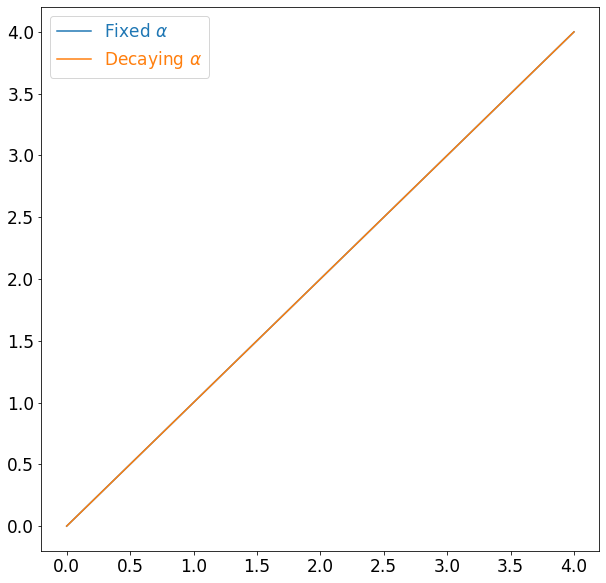

In [168]:
 fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
 ax.plot(range(0, 5), range(0, 5), label="Fixed $ \\alpha$")
 ax.plot(range(0, 5), range(0, 5), label="Decaying $ \\alpha$")
 ax.legend(labelcolor='linecolor')
 plt.savefig("Sarsa_LR_sensitivity_labels.svg", format='svg', dpi=300)
 plt.show()

In [205]:
def small_gridworld_reward_variance_plotting(agent_outputs, alphas):
    col_mapping = dict()
    # col_mapping[SarsaAgent.algorithm] = ["lime", "limegreen", "darkgreen"]
    col_mapping[SarsaAgent.algorithm] = [ "limegreen", "olivedrab", "darkgreen"] #""
    # col_mapping[QLAgent.algorithm] = ["lightsteelblue", "cornflowerblue", "midnightblue"]
    col_mapping[QLAgent.algorithm] = ["cornflowerblue", "b", "midnightblue"]
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 20))
    x_labels = alphas
    for agent, offset_output in agent_outputs.items():
        for i, (offset, output) in enumerate(offset_output.items()):
            avg_max_action_indv_runs = list()
            avg_max_action_stderr = list()
            av_last_step_ind_runs = list()
            av_last_step_sterr = list()
            for result in output["fixed"]:
                avg_max_action_indv_runs.append(np.mean(np.mean(result["max_act_start_state"], axis=1)))
                avg_max_action_stderr.append(2* np.std(np.mean(result["max_act_start_state"], axis=1))/np.sqrt(200))
                av_last_step_ind_runs.append(np.mean(result["average_reward"][-1]))
                av_last_step_sterr.append(2* np.std(result["average_reward"][-1])/np.sqrt(200))
            # ax[0].plot(alphas, agent_offset_output_maxv, label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])
            # ax[1].plot(alphas, agent_offset_output_av, label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])
            # ax[0].plot(np.array(alphas).astype('str'), agent_offset_output_maxv, label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])
            # ax[1].plot(np.array(alphas).astype('str'), agent_offset_output_av, label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])
            # print(type(avg_max_action_indv_runs[0]))
            # print(type(av_last_step_ind_runs[0]))
            # print(type(avg_max_action_stderr[0]))
            # print(type(av_last_step_sterr[0]))
            # print(len(np.array(alphas).astype('str')))
            # print(type(agent), type(offset))
            # label = str(agent) + " x="  +  str(offset)
            ax[0].errorbar(range(0, len(alphas)), avg_max_action_indv_runs, avg_max_action_stderr, color=col_mapping[agent][i])#, label=label)# label=str(agent) + " $ x="  +  str(offset) + "$")#, ) label=label
            ax[1].errorbar(range(0, len(alphas)), av_last_step_ind_runs, av_last_step_sterr, color=col_mapping[agent][i])#  label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])
            ax[0].set_xticks(range(len(x_labels)))
            ax[1].set_xticks(range(len(x_labels)))
            ax[0].set_xticklabels([str(label) for label in x_labels], fontsize=16)
            ax[1].set_xticklabels([str(label) for label in x_labels], fontsize=16)
            # ax[0].plot(alphas, avg_max_action_indv_runs, label=str(agent) + " $ x="  +  str(offset) + "$", color=col_mapping[agent][i])

    ax[0].set_xlabel("$ \\alpha $", fontsize=21)
    ax[1].set_xlabel("$ \\alpha $", fontsize=21)
    ax[0].set_ylabel("Average\n $max_a Q(S_0, a)$", rotation=0, labelpad=30)
    ax[1].set_ylabel("Average reward\n at last step", rotation=0, labelpad=30)
    ax[0].legend(labelcolor='linecolor')
    ax[1].legend(labelcolor='linecolor')
    plt.savefig("Reward_variance.svg", format='svg')
    plt.show()

## Simple Two Action MDP (1x4 Grid World)

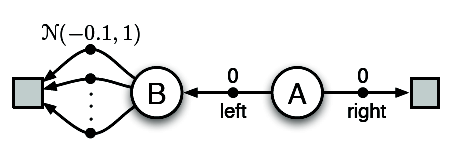

In [49]:
class TwoStateMDPEnvironment():
    def env_init(self, env_info):
        """Setup for the environment called when the experiment first starts.
                Note:
                    Initialize a tuple with the reward, first state, boolean
                    indicating if it's terminal.
                """

        # Set the default height to 3 and width to 13 
        self.grid_h = 1
        self.grid_w = 4
        self.num_actions_b_state = env_info.get("b_state_actions", 100) + 2 # Thus actions will be range(2, n+2)

        # Starting location of agent is the bottom-left corner, (max x, min y).
        self.start_loc = (0, 2)
        # Random generator - https://numpy.org/doc/stable/reference/random/generator.html
        self.rng = np.random.default_rng(seed = env_info.get("seed", None))

    def env_start(self):
        """The first method called when the episode starts, called before the
            agent starts.

            Returns:
                The first state from the environment.
            """
        reward = 0
        # agent_loc will hold the current location of the agent
        self.agent_loc = self.start_loc
        # state is the one dimensional state representation of the agent location.
        state = self.state(self.agent_loc)
        termination = False
        self.reward_state_term = (reward, state, termination)

        return self.reward_state_term[1]

    def env_step(self, action):
        """A step taken by the environment.

            Args:
                action: The action taken by the agent

            Returns:
                (float, state, Boolean): a tuple of the reward, state,
                    and boolean indicating if it's terminal.
            """
        x, y = self.agent_loc
          
        # assign the reward and terminal variables 

        if self.agent_loc == self.start_loc:
            # Take action right from state A
            if action == 0:
                y += 1
                reward = 0
                terminal = True

            # Take action left from state A
            elif action == 1:
                y -= 1
                reward  = 0
                terminal = False

            # Invalid action from State A
            else:
                raise Exception(str(action) + " not in recognized actions [0: left, 1: right] from state A!")
          
        else:
            #Any action from State B
            y -= 1
            reward = self.rng.normal(loc = -0.1)
            terminal = True
        
        # assign the new location to the environment object
        self.agent_loc = (x, y)
        self.reward_state_term = (reward, self.state(self.agent_loc), terminal)
        return self.reward_state_term

    def env_end(self, reward):

        raise NotImplementedError

    def env_cleanup(self):
        """Cleanup done after the environment ends"""
        self.agent_loc = self.start_loc

    # helper method
    def state(self, loc):
        # your code here
        index = self.grid_w * loc[0] + loc[1]
        return index


### Tests

In [48]:
def two_state_mdp_tests():

    env = TwoStateMDPEnvironment()
    env_info = {"seed": 0}
    env.env_init(env_info)

    expected_start_state = 2 # State corresponding to loc [0, 2]
    start_state = env.env_start()
    assert start_state == expected_start_state

    # Test for transition from A to terminal state
    reward, state, terminal = env.env_step(0)
    assert reward == 0
    assert state == 3
    assert terminal == True

    # Test for transition from A to B
    env.env_cleanup()
    reward, state, terminal = env.env_step(1)
    assert reward == 0
    assert state == 1
    assert terminal == False


    # Test for transition from B to terminal state with any action
    reward, state, terminal = env.env_step(1000)
    assert math.isclose(reward, 0.0257, rel_tol = 1e-02)
    assert state == 0
    assert terminal == True

    # Check if average reward from B is -0.1
    env.env_init({})
    avg_reward = 0
    total_runs = 10000
    for i in range(0, total_runs):
        env.env_cleanup()
        env.env_step(1)
        reward, _, _ = env.env_step(i)
        avg_reward += reward / total_runs*1.0
    print(f"Average reward from state B is : {avg_reward}")

two_state_mdp_tests()


Average reward from state B is : -0.09559084179858791


# Experiments - 3x3 Grid World

## Double Q Learning for solving 3x3 Grid World

In [ ]:
# run double q-learning on first environment
# epsilon = 0.7
# average over 100 runs
# each run consists of 10,000 episodes

def double_q_learning_small_gw(agent_cls, agent_info, env_info, run_info):
    num_runs = run_info.get("num_runs", 1000)
    num_episodes = run_info.get("num_episodes", 10)
    max_steps = run_info.get("max_steps", 10000)

    env = SmallGridWorldEnvironment()
    agent = agent_cls()
    output = dict()
    # average_q_value = np.zeros((agent_info["num_states"], agent_info["num_actions"]))
    all_q_values = list()
    max_action_start_state = np.zeros((num_runs, max_steps))
    average_reward = np.zeros((num_runs, max_steps))
    episode_per_step = np.zeros((num_runs, max_steps))
    for run in tqdm(range(num_runs), desc="Runs"):
        #initialize environment and agent
        env_info["seed"] = run
        env.env_init(env_info)
        agent_info["seed"] = run
        agent.agent_init(agent_info)
        num_steps = 0
        steps_limit_reached = False
        episode_id = 0
        # for episode in range(num_episodes):
        while not steps_limit_reached:
            #start the episode with first state, action
            start_state = env.env_start()
            action = agent.agent_start(start_state)
            is_terminal = False

            #while episode has not terminated agent takes steps
            while True:
                episode_per_step[run][num_steps] = episode_id
                reward, state, is_terminal = env.env_step(action)
                # Calculate average reward using incremental update (sample average)
                if num_steps == 0:
                    average_reward[run][num_steps] = reward
                else:
                    average_reward[run][num_steps] = average_reward[run][num_steps-1] + (1/num_steps)*(reward - average_reward[run][num_steps-1])
                # Find the maximal action value of the start state. Use the argmax function of the agent.
                q_values_A = agent.q_A[start_state,:]
                q_values_B = agent.q_B[start_state,:]
                avg_q_values = (q_values_A + q_values_B) / 2
                #print("Q_A: {}".format(q_values_A))
                #print("Q_B: {}".format(q_values_B))
                #print(avg_q_values)
                max_action_start_state[run][num_steps] = avg_q_values[agent.argmax(avg_q_values)]
                num_steps += 1
                if num_steps == max_steps:
                    steps_limit_reached = True
                    break

                #if in terminal state end episode
                if is_terminal:
                    agent.agent_end(reward)
                    env.env_cleanup()
                    episode_id += 1
                    break
                #if epsiode hasn't ended then agent takes action
                action = agent.agent_step(reward, state)
        all_q_values.append((agent.q_A + agent.q_B) /2)
    all_q_values = np.stack(all_q_values)
    average_q_value = np.mean(np.max(all_q_values,  axis=2), axis=0)
    output["state_values"] = average_q_value
    output["max_act_start_state"] = max_action_start_state
    output["average_reward"] = average_reward
    return output

In [ ]:
dqlearning_3x3gw_params = dict()
dqlearning_3x3gw_params["agent_cls"] =  DoubleQLAgent
dqlearning_3x3gw_params["env_info"] = {}
dqlearning_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.1,
    "gamma": 0.95,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 1,
    "exploration_type": 1
}
dqlearning_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}
dqlearning_3x3gw_output = dict()
dqlearning_3x3gw_output["lin"] = double_q_learning_small_gw(**dqlearning_3x3gw_params)
dqlearning_3x3gw_params["agent_info"]["learning_type"] = 2
dqlearning_3x3gw_output["poly"] = double_q_learning_small_gw(**dqlearning_3x3gw_params)

KeyboardInterrupt: ignored

#**Output for Double Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

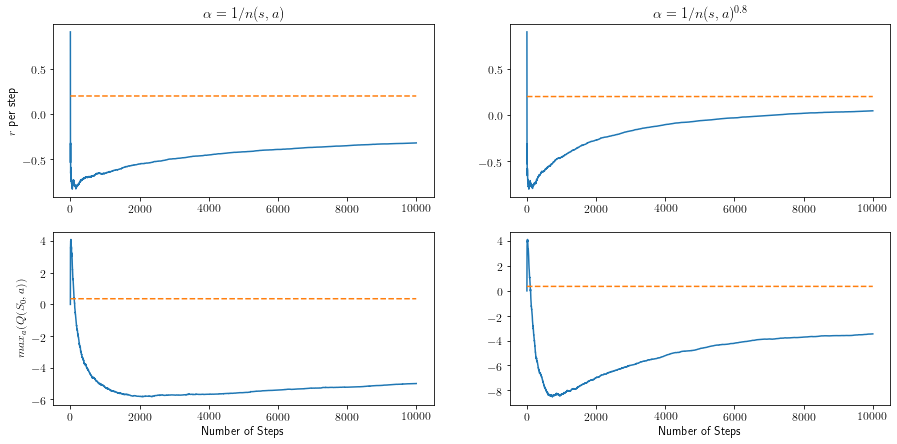

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[-2.51848296,  2.75239156,  4.925     ],
       [-3.82821603, -0.07618719,  2.41060468],
       [-5.01267447, -3.4789189 , -2.45093227]])


**HeatMap**

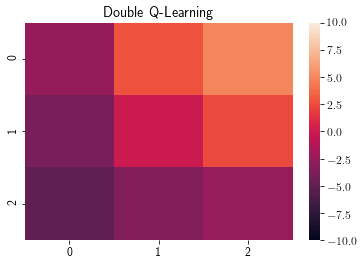

###**Polynomial Polynomial Rate**

**Raw Values**

array([[-2.46829819,  3.24951457,  5.        ],
       [-3.51665924,  0.67933945,  3.27094118],
       [-3.4639725 , -3.4643478 , -2.59660471]])


**HeatMap**

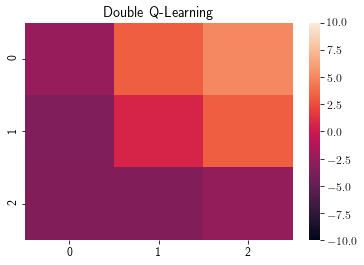

In [ ]:
small_gridworld_plotting(dqlearning_3x3gw_output, dqlearning_3x3gw_params)

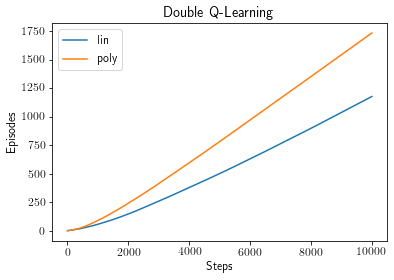

In [ ]:
plt.plot(dq_episode, label="lin")
plt.plot(dq_episode_poly, label="poly")
plt.xlabel('Steps')
plt.ylabel('Episodes')
plt.title('Double Q-Learning')
plt.legend()
plt.show()

## Single Function for rest of the agents

In [21]:
# run q-learning on first environment
# each run consists of 10,000 episodes
def run_agent(agent_cls, agent_info, env_info, run_info):
    num_runs = run_info.get("num_runs", 1000)
    num_episodes = run_info.get("num_episodes", 10)
    max_steps = run_info.get("max_steps", 10000)
    output = dict()
    env = SmallGridWorldEnvironment()

    agent = agent_cls()
    all_q_values = list()
    max_action_start_state = np.zeros((num_runs, max_steps))
    average_reward = np.zeros((num_runs, max_steps))
    episode_per_step = np.zeros((num_runs, max_steps))
    for run in tqdm(range(num_runs), desc="Runs"):
        #initialize environment and agent
        env_info["seed"] = run
        env.env_init(env_info)
        agent_info["seed"] = run
        agent.agent_init(agent_info)
        num_steps = 0
        episode_id = 0
        steps_limit_reached = False
        # for episode in range(num_episodes):
        while not steps_limit_reached:
            #start the episode with first state, action
            start_state = env.env_start()
            action = agent.agent_start(start_state)
            is_terminal = False

            #while episode has not terminated agent takes steps
            while True:
                episode_per_step[run][num_steps] = episode_id
                reward, state, is_terminal = env.env_step(action)
                # Calculate average reward using incremental update (sample average)
                if num_steps == 0:
                    average_reward[run][num_steps] = reward
                else:
                    average_reward[run][num_steps] = average_reward[run][num_steps-1] + (1/num_steps)*(reward - average_reward[run][num_steps-1])
                # Find the maximal action value of the start state. Use the argmax function of the agent. 
                max_action_start_state[run][num_steps] = agent.q[start_state, agent.argmax(agent.q[start_state, :])]
                num_steps += 1
                if num_steps == max_steps:
                    steps_limit_reached = True
                    break

                #if in terminal state end episode
                if is_terminal:
                    agent.agent_end(reward)
                    env.env_cleanup()
                    episode_id += 1
                    break
                #if epsiode hasn't ended then agent takes action
                action = agent.agent_step(reward, state)
                # if action == agent.argmax(agent.q[state, :]):
                #     op_action_count += 1
        all_q_values.append(agent.q)      
    all_q_values = np.stack(all_q_values)
    average_q_value = np.mean(np.max(all_q_values,  axis=2), axis=0)
    output["state_values"] = average_q_value
    output["state_values_all_runs"] = np.max(all_q_values,  axis=2)
    output["state_values_all_runs"] = np.argmax(all_q_values,  axis=2)
    output["max_act_start_state"] = max_action_start_state
    output["average_reward"] = average_reward
    output["episode_per_step"] = episode_per_step
    return output # Considering last run and last episodes q-values

## Q-Learning for solving 3x3 Grid World

In [ ]:
qlearning_3x3gw_params = dict()
qlearning_3x3gw_params["agent_cls"] = QLAgent
qlearning_3x3gw_params["env_info"] = {}
qlearning_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.1,
    "gamma": 0.95,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 1,
    "exploration_type": 1
}
qlearning_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}
qlearning_3x3gw_output = dict()
qlearning_3x3gw_output["lin"] = run_agent(**qlearning_3x3gw_params)
qlearning_3x3gw_params["agent_info"]["learning_type"] = 2
qlearning_3x3gw_output["poly"] =  run_agent(**qlearning_3x3gw_params)


#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

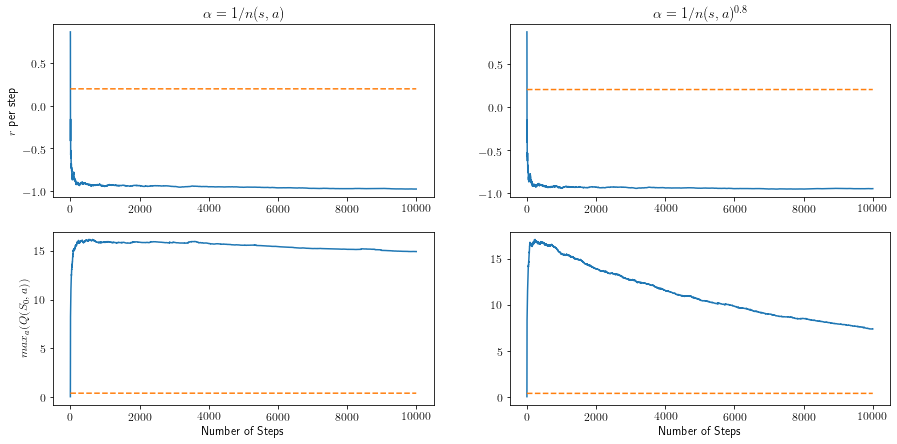

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[14.60060201, 14.94348511,  4.975     ],
       [15.33925797, 15.58902772, 14.74515688],
       [14.95908091, 15.0599219 , 15.06837576]])


**HeatMap**

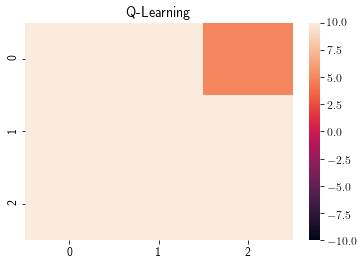

###**Polynomial Polynomial Rate**

**Raw Values**

array([[7.30873294, 7.44355095, 5.        ],
       [7.41286204, 7.28568644, 7.51213519],
       [7.36405605, 7.3378514 , 7.35703707]])


**HeatMap**

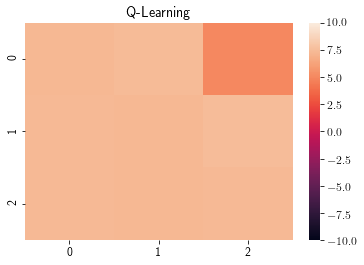

In [ ]:
small_gridworld_plotting(qlearning_3x3gw_output, qlearning_3x3gw_params)

## Sarsa for solving 3x3 Grid World

In [ ]:
sarsa_3x3gw_params = dict()
sarsa_3x3gw_params["agent_cls"] = SarsaAgent
sarsa_3x3gw_params["env_info"] = {}
sarsa_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.2,
    "gamma": 0.95,
    "alpha": 0.5,
    "seed": 0,
    "learning_type": 0,
    "exploration_type": 1
}
sarsa_3x3gw_params["run_info"] = {"num_runs": 100, "num_episodes": 10, "max_steps": 10000}
sarsa_3x3gw_output = dict()
sarsa_3x3gw_output["lin"] = run_agent(**sarsa_3x3gw_params)
sarsa_3x3gw_params["agent_info"]["learning_type"] = 2
sarsa_3x3gw_output["poly"]  = run_agent(**sarsa_3x3gw_params)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

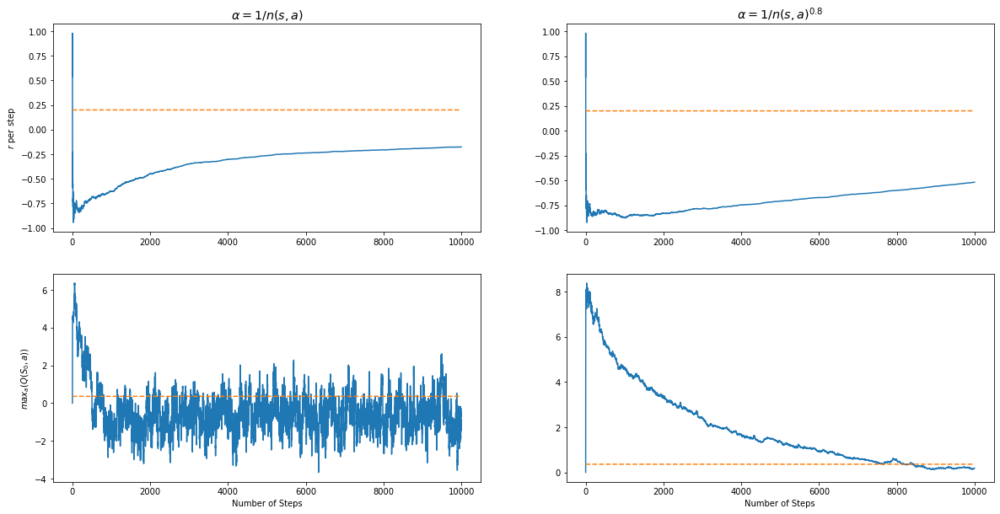

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[-1.9525782 ,  2.71774428,  5.        ],
       [-2.53293728,  0.43110922,  2.31641568],
       [-0.29514205, -1.88720237, -2.2957077 ]])


**HeatMap**

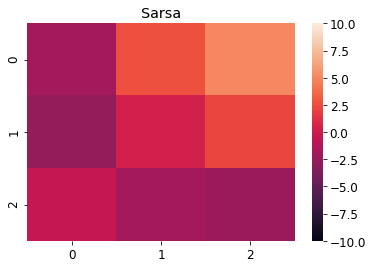

###**Polynomial Polynomial Rate**

**Raw Values**

array([[1.04358283, 2.86028923, 5.        ],
       [0.79050688, 2.14469697, 3.27454661],
       [0.17972678, 0.69560245, 1.37906708]])


**HeatMap**

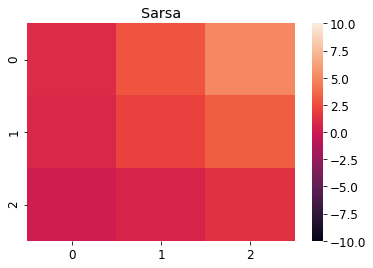

In [ ]:
small_gridworld_plotting(sarsa_3x3gw_output, sarsa_3x3gw_params)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

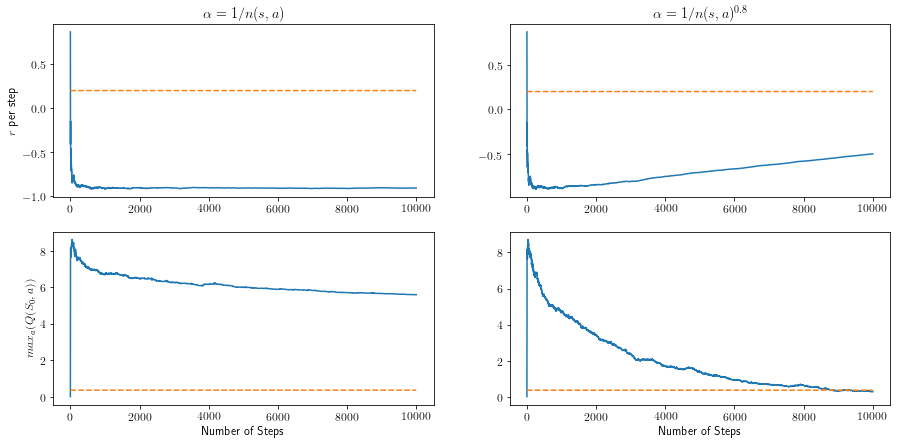

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[6.29946613, 6.56383772, 4.95      ],
       [6.05502236, 6.10675673, 6.44985157],
       [5.58875514, 5.67217942, 5.7647046 ]])


**HeatMap**

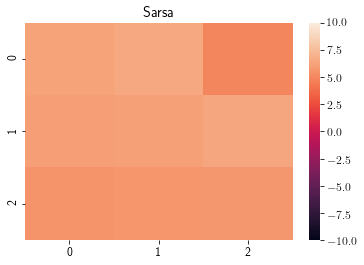

###**Polynomial Polynomial Rate**

**Raw Values**

array([[1.02630561, 2.87584144, 5.        ],
       [0.7224363 , 2.12153899, 3.27620077],
       [0.27716407, 0.97934014, 1.56641371]])


**HeatMap**

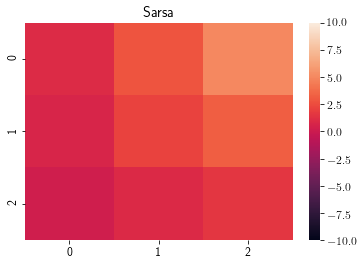

In [ ]:
small_gridworld_plotting(sarsa_3x3gw_output, sarsa_3x3gw_params)

## n-step Sarsa for 3x3 Grid World

In [ ]:
nsarsa_3x3gw_params = dict()
nsarsa_3x3gw_params["agent_cls"] = NstepSarsaAgent
nsarsa_3x3gw_params["env_info"] = dict()
nsarsa_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.1,
    "gamma": 0.95,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 1,
    "exploration_type": 1,
    "n_steps": 2
}
nsarsa_3x3gw_params["run_info"] = {"num_runs": 100, "num_episodes": 10, "max_steps": 10000} 
nsarsa_3x3gw_output = dict()
nsarsa_3x3gw_output["lin"] = run_agent(**nsarsa_3x3gw_params)
nsarsa_3x3gw_params["agent_info"]["learning_type"] = 2
nsarsa_3x3gw_output["poly"] = run_agent(**nsarsa_3x3gw_params)

n=3 Sarsa with 1000 runs

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

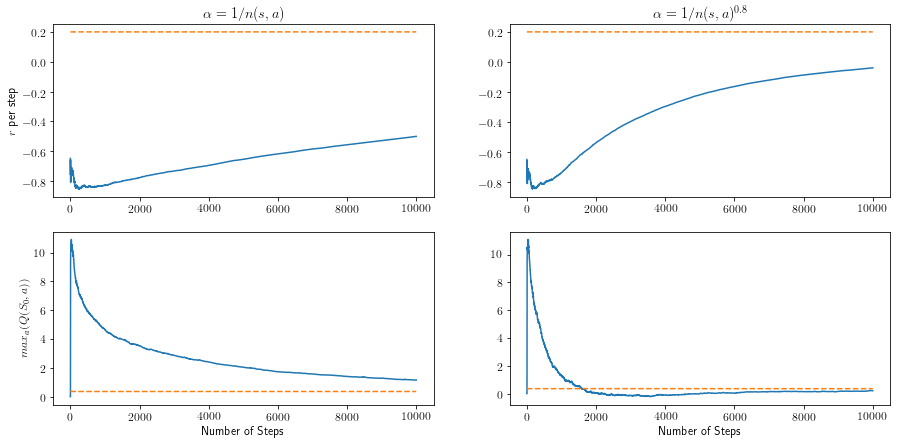

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[2.39352409, 3.88008432, 5.        ],
       [1.60791142, 2.7272059 , 3.80385939],
       [1.15255081, 1.53557833, 2.29376599]])


**HeatMap**

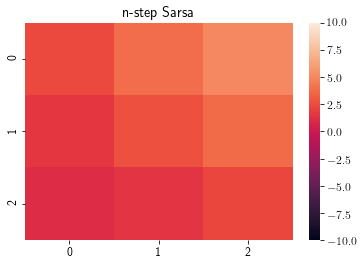

###**Polynomial Polynomial Rate**

**Raw Values**

array([[0.61814552, 3.13584912, 5.        ],
       [0.29273213, 1.77845277, 3.18599772],
       [0.20908624, 0.33549554, 0.59107451]])


**HeatMap**

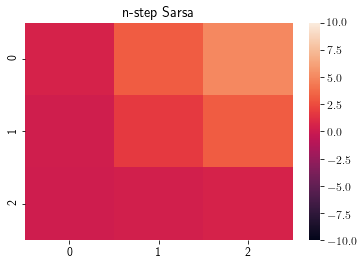

In [ ]:
small_gridworld_plotting(nsarsa_3x3gw_output, nsarsa_3x3gw_params)

n-step sarsa with n=2

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

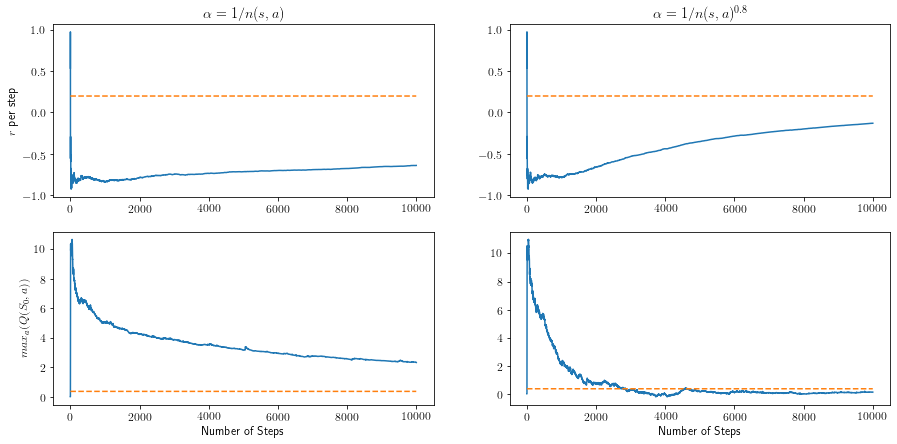

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[4.35588202, 4.99678374, 5.        ],
       [3.29016307, 3.76495341, 4.88807802],
       [2.32350964, 2.75361547, 3.69901761]])


**HeatMap**

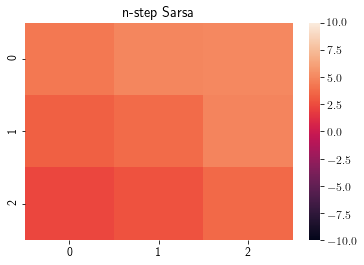

###**Polynomial Polynomial Rate**

**Raw Values**

array([[1.02239494, 3.07108187, 5.        ],
       [0.35715173, 1.37705671, 2.82729485],
       [0.12128584, 0.58978075, 0.57568585]])


**HeatMap**

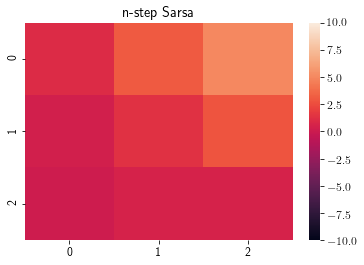

In [ ]:
small_gridworld_plotting(nsarsa_3x3gw_output, nsarsa_3x3gw_params)

n-step Sarsa with n=3

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

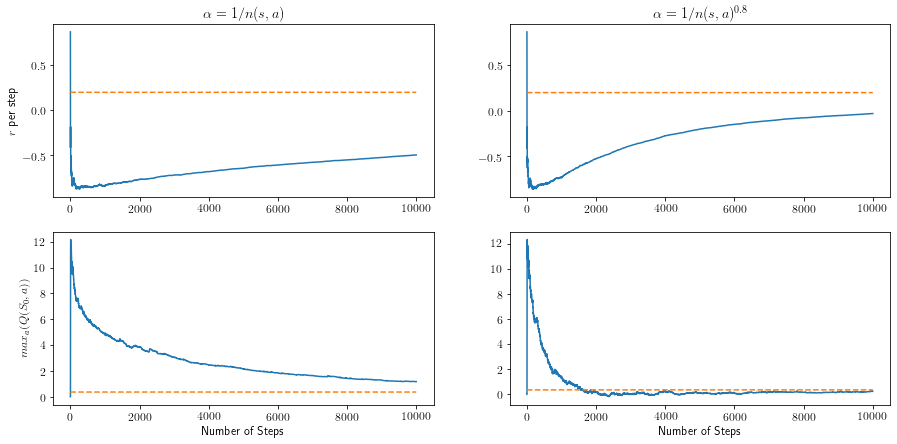

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[2.08406689, 3.66783986, 5.        ],
       [1.46478941, 2.56483184, 3.61664882],
       [1.16559641, 1.49185932, 2.37430102]])


**HeatMap**

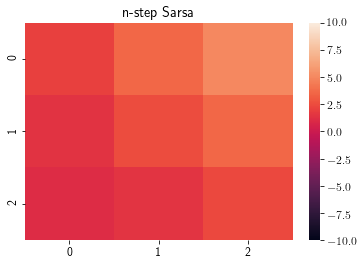

###**Polynomial Polynomial Rate**

**Raw Values**

array([[0.91876734, 3.17154556, 5.        ],
       [0.44142108, 1.9043867 , 3.22158174],
       [0.24023843, 0.51363848, 0.49717076]])


**HeatMap**

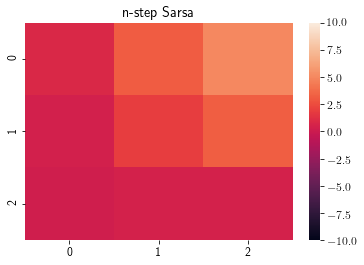

In [ ]:
small_gridworld_plotting(nsarsa_3x3gw_output, nsarsa_3x3gw_params)

n-step Sarsa with n=4

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

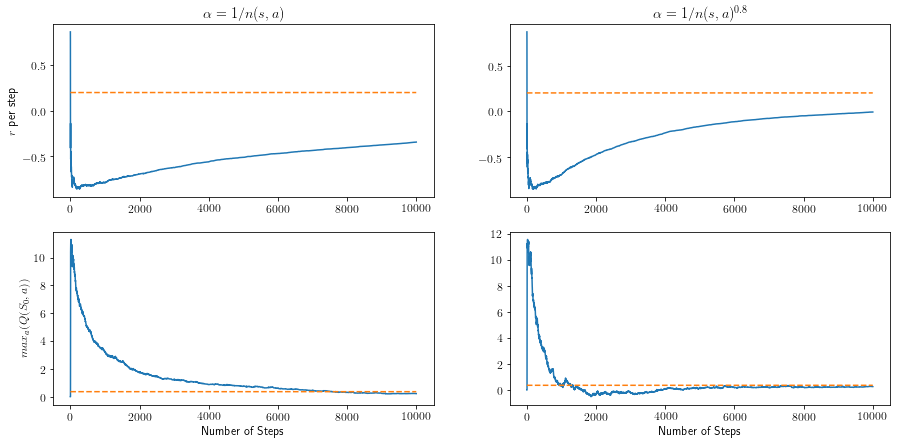

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[1.08197113, 3.41507339, 5.        ],
       [0.64042532, 2.13625967, 3.74228552],
       [0.22250605, 0.97488898, 1.54738551]])


**HeatMap**

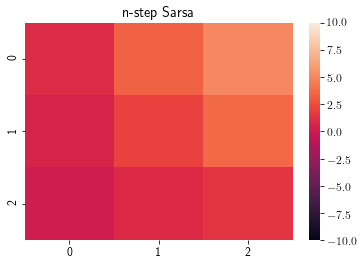

###**Polynomial Polynomial Rate**

**Raw Values**

array([[ 0.05585569,  3.02261705,  5.        ],
       [-0.11211039,  1.51935985,  3.26208652],
       [ 0.26197778, -0.04833426, -0.02893387]])


**HeatMap**

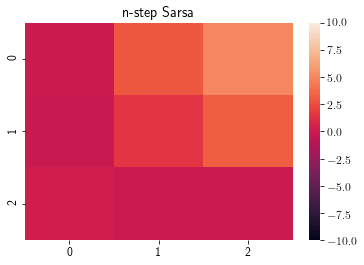

In [ ]:
small_gridworld_plotting(nsarsa_3x3gw_output, nsarsa_3x3gw_params)

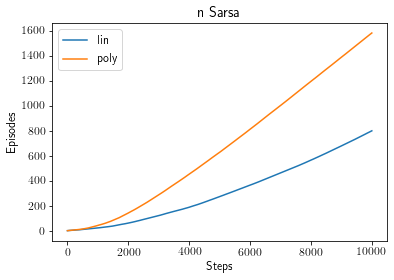

In [ ]:
plt.plot(episode_nsar, label="lin")
plt.plot(episode_nsar_poly, label="poly")
plt.xlabel('Steps')
plt.ylabel('Episodes')
plt.title("n Sarsa")
plt.legend()
plt.show()

## Expected Sarsa for solving 3x3 Grid World

In [ ]:
esarsa_3x3gw_params = dict()
esarsa_3x3gw_params["agent_cls"] = ExpectedSarsaAgent
esarsa_3x3gw_params["env_info"] = {}
esarsa_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.1,
    "gamma": 0.95,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 1,
    "exploration_type": 1
}
esarsa_3x3gw_params["run_info"] = {"num_runs": 50, "num_episodes": 10, "max_steps": 10000}
esarsa_3x3gw_output = dict()
esarsa_3x3gw_output["lin"] = run_agent(**esarsa_3x3gw_params)
esarsa_3x3gw_params["agent_info"]["learning_type"] = 2
esarsa_3x3gw_output["poly"] = run_agent(**esarsa_3x3gw_params)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

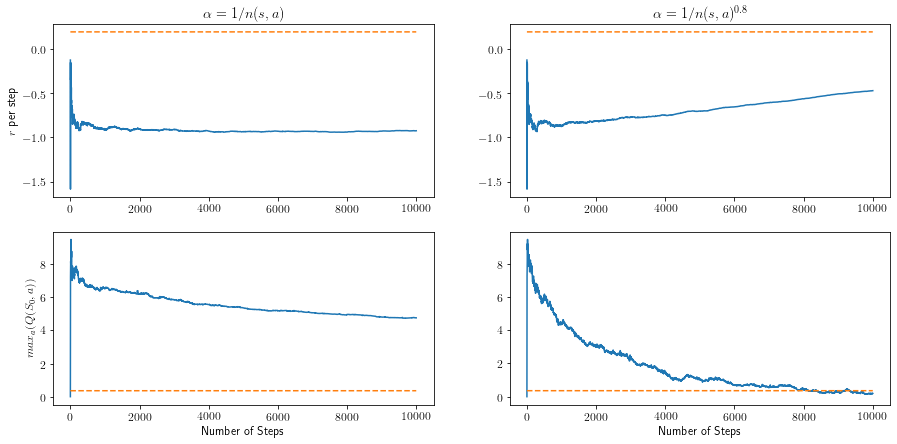

##**Value Function HeatMap**

###**Linear Polynomial Rate**

**Raw Values**

array([[4.90290251, 5.98876689, 5.        ],
       [5.12858663, 5.65643619, 5.73424038],
       [4.76231124, 5.19546563, 5.31836391]])


**HeatMap**

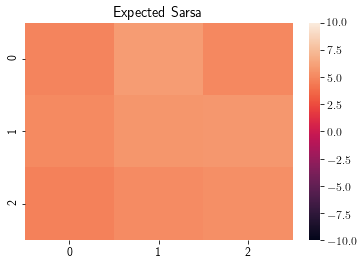

###**Polynomial Polynomial Rate**

**Raw Values**

array([[0.7828148 , 2.80738528, 5.        ],
       [0.52126545, 2.22994976, 3.24427411],
       [0.19787088, 0.76987164, 1.62661181]])


**HeatMap**

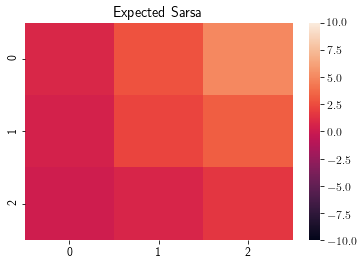

In [ ]:
small_gridworld_plotting(esarsa_3x3gw_output, esarsa_3x3gw_params)

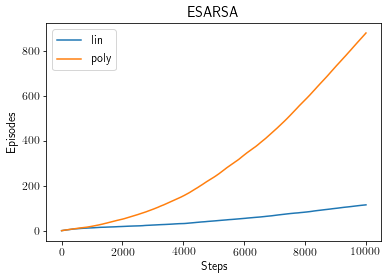

In [ ]:
plt.plot(episodes_es, label="lin")
plt.plot(episodes_es_poly, label="poly")
plt.xlabel('Steps')
plt.ylabel('Episodes')
plt.title('ESARSA')
plt.legend()
plt.show()

## Hyper Parameter Sweeps for 3x3 Gridworld

For the 3x3 grid world we will run hyper parameter sweeps for all of the control algorithms. 

There are 3 hyperparameters to check: alpha (learning rate), epsilon (exploration rate), and number of steps (for n step sarsa).

For alpha, we have a linear decay learning rate, a polynomial decay learning rate, and a fixed learning rate (which can be tested at multiple different values).

For epsilon, we have a square root decay exploration rate and a fixed rate (which can be tested at multiple different values).

For n-step sarsa, we can test different levels of n from 1 (ie sarsa) and up (eventually levelling off as the episodes don't take too many steps to finish).

**TODO** - What was our hypothesis here regarding the performance of agents on constant alpha?

### Define sweep functions

In [22]:
def run_agent_alpha_sweep(agent_class, num_steps=1, env_info={}, custom_agent_info={}, alphas=None, lin_poly=True, exponents=None, fixed=True):
    outputs = dict()
    
    # array of fixed alphas
    agent_3x3gw_sw_params = dict()
    if alphas is None:
        agent_3x3gw_sw_params["alphas"] = [0.1, 0.05, 0.01]
    else:
        agent_3x3gw_sw_params["alphas"] = alphas

    # array of exponents for decaying alpha
    if exponents is None:
        agent_3x3gw_sw_params['exponents'] = [0.2, 0.5, 0.8]
    else:
        agent_3x3gw_sw_params['exponents'] = exponents

    # run with polynomial and linear decay
    agent_3x3gw_params = dict()
    agent_3x3gw_params["agent_cls"] = agent_class
    agent_3x3gw_params["env_info"] = env_info
    agent_3x3gw_params["agent_info"] = {
        "num_states": 9,
        "num_actions": 4,
        "epsilon": 0.1,
        "gamma": 0.95,
        "alpha": 0.1,
        "seed": 0,
        "learning_type": 1,
        "exploration_type": 1,
        "n_steps": num_steps
    }
    agent_3x3gw_params["agent_info"].update(custom_agent_info)
    agent_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}
    agent_3x3gw_output = dict()
    # Get output for linear and polynomial learning rate
    if lin_poly:
        agent_3x3gw_output["lin"] = run_agent(**agent_3x3gw_params)
        agent_3x3gw_params["agent_info"]["learning_type"] = 2
        agent_3x3gw_output['poly'] = []
        for exponent in agent_3x3gw_sw_params['exponents']:
            agent_3x3gw_params['agent_info']['exponent'] = exponent
            agent_3x3gw_output["poly"].append(run_agent(**agent_3x3gw_params))

        # add output to outputs
        outputs['lin_poly'] = agent_3x3gw_output

    # iterate through fixed alphas
    outputs['fixed'] = []
    agent_3x3gw_params['agent_info']['learning_type'] = 0
    for alpha in agent_3x3gw_sw_params["alphas"]:
        agent_3x3gw_params["agent_info"]["alpha"] = alpha
        outputs['fixed'].append(run_agent(**agent_3x3gw_params))

    return outputs, agent_3x3gw_params



In [ ]:
def run_agent_alpha_sweep_fixed_epsilon(agent_class, num_steps=1, env_info={}, custom_agent_info={}, alphas=None, lin_poly=True, exponents=None, fixed=True):
    outputs = dict()
    
    # array of fixed alphas
    agent_3x3gw_sw_params = dict()
    if alphas is None:
        agent_3x3gw_sw_params["alphas"] = [0.1, 0.05, 0.01]
    else:
        agent_3x3gw_sw_params["alphas"] = alphas

    # array of exponents for decaying alpha
    if exponents is None:
        agent_3x3gw_sw_params['exponents'] = [0.2, 0.5, 0.8]

    # run with polynomial and linear decay
    agent_3x3gw_params = dict()
    agent_3x3gw_params["agent_cls"] = agent_class
    agent_3x3gw_params["env_info"] = env_info
    agent_3x3gw_params["agent_info"] = {
        "num_states": 9,
        "num_actions": 4,
        "epsilon": 0.1,
        "gamma": 0.95,
        "alpha": 0.1,
        "seed": 0,
        "learning_type": 1,
        "exploration_type": 0,
        "n_steps": num_steps
    }
    agent_3x3gw_params["agent_info"].update(custom_agent_info)
    agent_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}
    agent_3x3gw_output = dict()
    # Get output for linear and polynomial learning rate
    if lin_poly:
        agent_3x3gw_output["lin"] = run_agent(**agent_3x3gw_params)
        agent_3x3gw_params["agent_info"]["learning_type"] = 2
        agent_3x3gw_output['poly'] = []
        for exponent in agent_3x3gw_sw_params['exponents']:
            agent_3x3gw_params['agent_info']['exponent'] = exponent
            agent_3x3gw_output["poly"].append(run_agent(**agent_3x3gw_params))

        # add output to outputs
        outputs['lin_poly'] = agent_3x3gw_output

    # iterate through fixed alphas
    outputs['fixed'] = []
    agent_3x3gw_params['agent_info']['learning_type'] = 0
    for alpha in agent_3x3gw_sw_params["alphas"]:
        agent_3x3gw_params["agent_info"]["alpha"] = alpha
        outputs['fixed'].append(run_agent(**agent_3x3gw_params))

    return outputs, agent_3x3gw_params

In [26]:
def run_agent_epsilon_sweep(agent_class, num_steps=1):
    # need to track results from each run
    outputs = dict()

    # array of fixed alphas
    epsilons = [0.5, 0.2, 0.1, 0.05, 0.01]

    # all runs with poly decay alpha
    agent_3x3gw_params = dict()
    agent_3x3gw_params["agent_cls"] = agent_class
    agent_3x3gw_params["env_info"] = {}
    agent_3x3gw_params["agent_info"] = {
        "num_states": 9,
        "num_actions": 4,
        "epsilon": 0.1,
        "gamma": 0.95,
        "alpha": 0.1,
        "seed": 0,
        "learning_type": 2,
        "exploration_type": 1,
        "n_steps": num_steps
    }
    agent_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}

    # first run decay epsilon
    outputs['decay'] = run_agent(**agent_3x3gw_params)

    # iterate through fixed epsilons
    agent_3x3gw_params['agent_info']['exploration_type'] = 0
    outputs['fixed'] = []
    for epsilon in epsilons:
        agent_3x3gw_params["agent_info"]["epsilon"] = epsilon
        outputs['fixed'].append(run_agent(**agent_3x3gw_params))

    return outputs, agent_3x3gw_params

### Q Learning

In [ ]:
outputs, params = run_agent_alpha_sweep(QLAgent)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

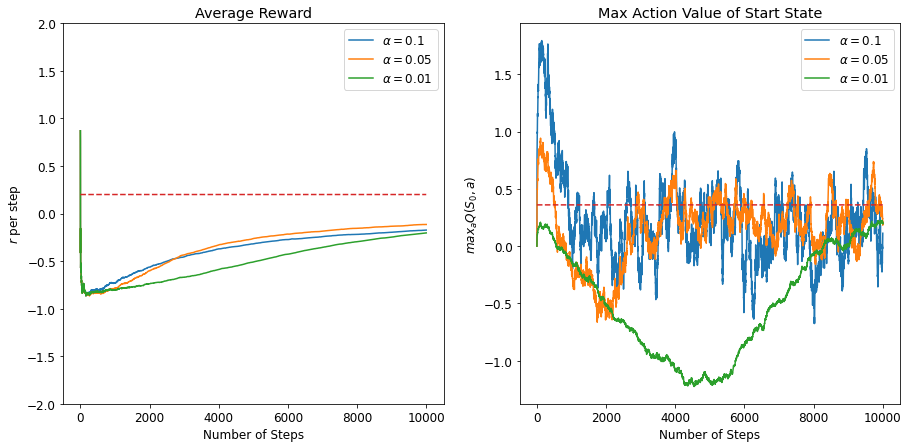

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs, params)

In [ ]:
outputs, params = run_agent_alpha_sweep(QLAgent)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

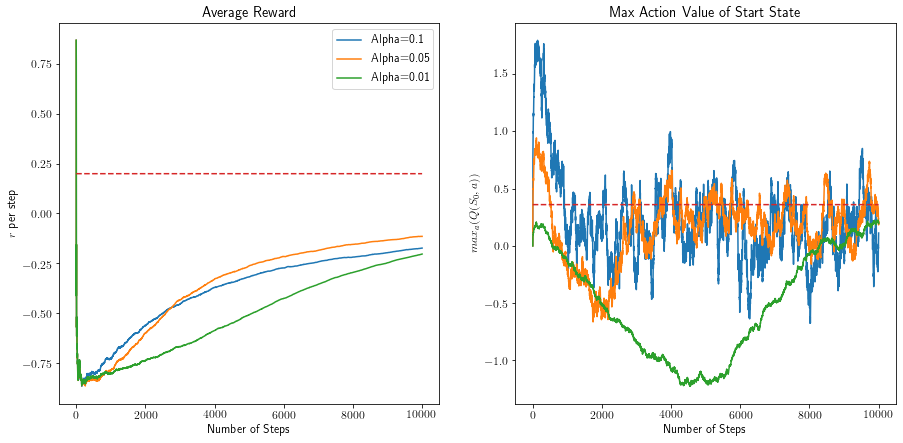

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs, params)

#### Alpha sweep - decaying epsilon

In [ ]:
outputs_q1, params_q1 = run_agent_alpha_sweep(QLAgent)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

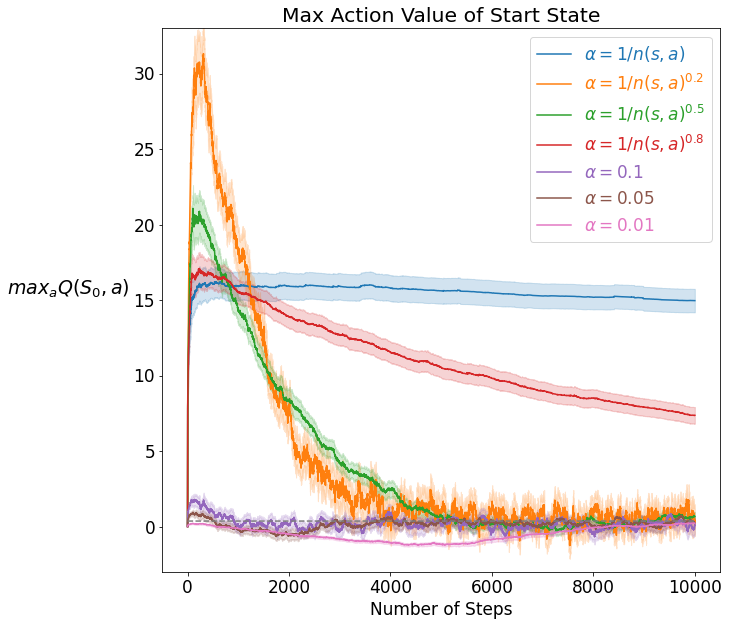

In [ ]:
small_gridworld_sweep_plotting(outputs_q1, params_q1)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

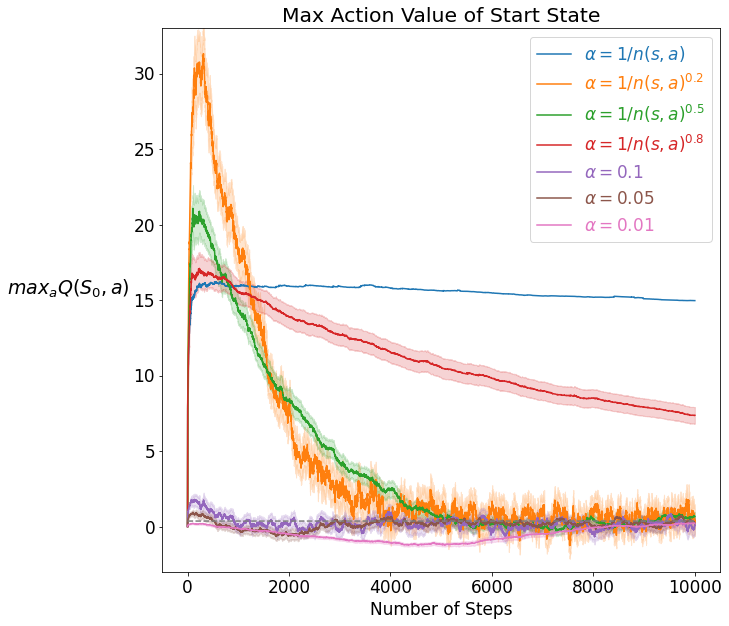

In [ ]:
small_gridworld_sweep_plotting(outputs_q1, params_q1)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

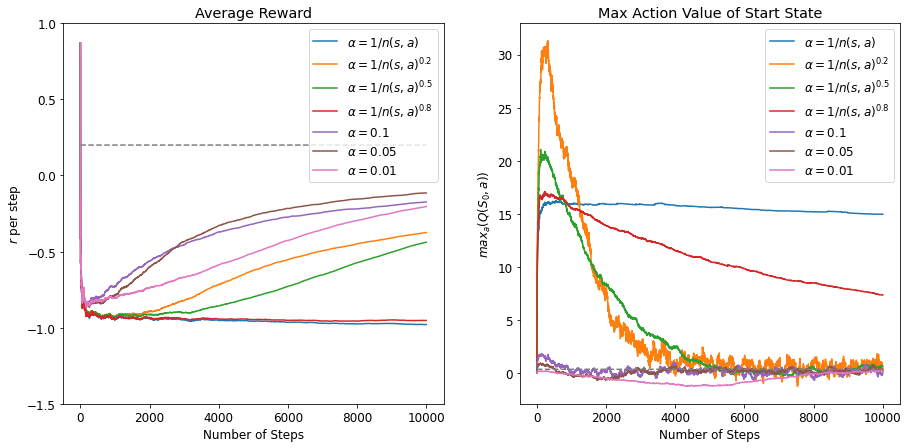

In [ ]:
small_gridworld_sweep_plotting(outputs_q1, params_q1)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

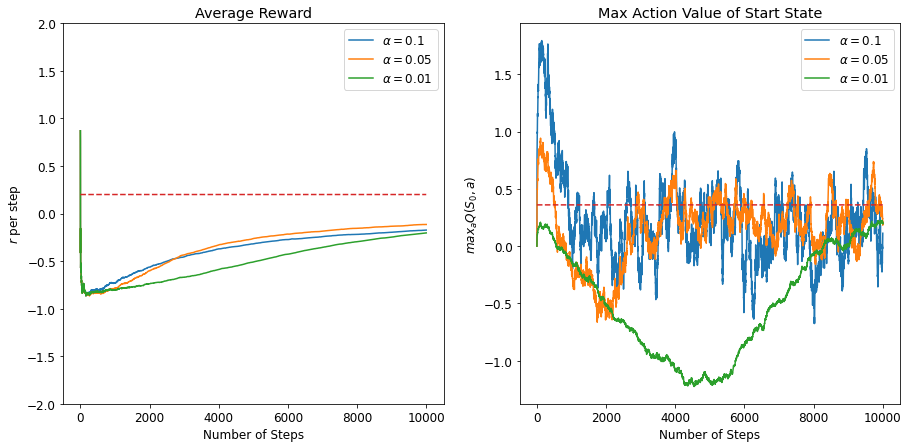

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_q1, params_q1)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

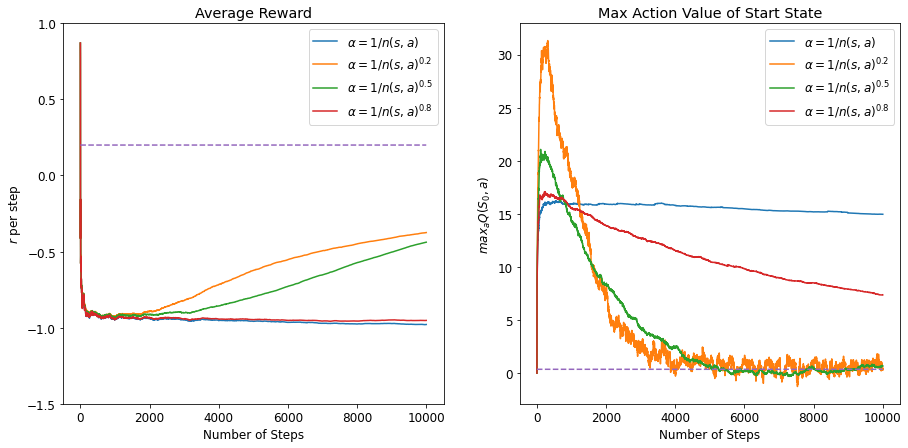

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_q1, params_q1)

#### Alpha sweep - fixed epsilon (0.1)

In [ ]:
outputs_q2, params_q2 = run_agent_alpha_sweep_fixed_epsilon(QLAgent)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

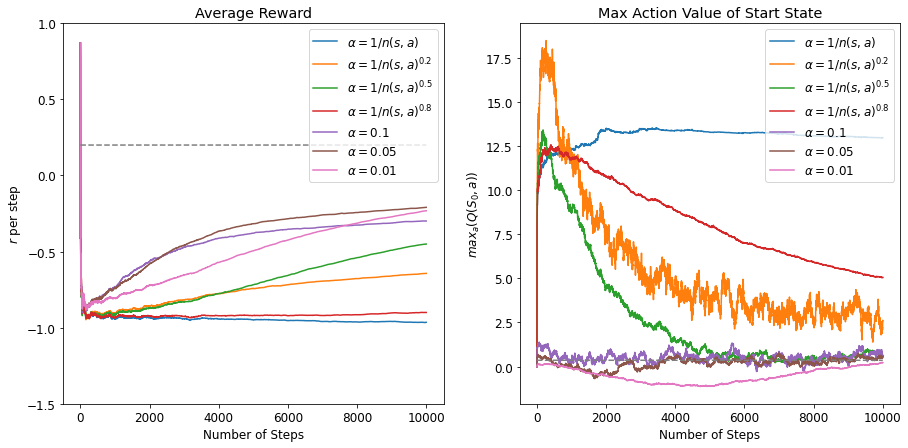

In [ ]:
small_gridworld_sweep_plotting(outputs_q2, params_q2)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

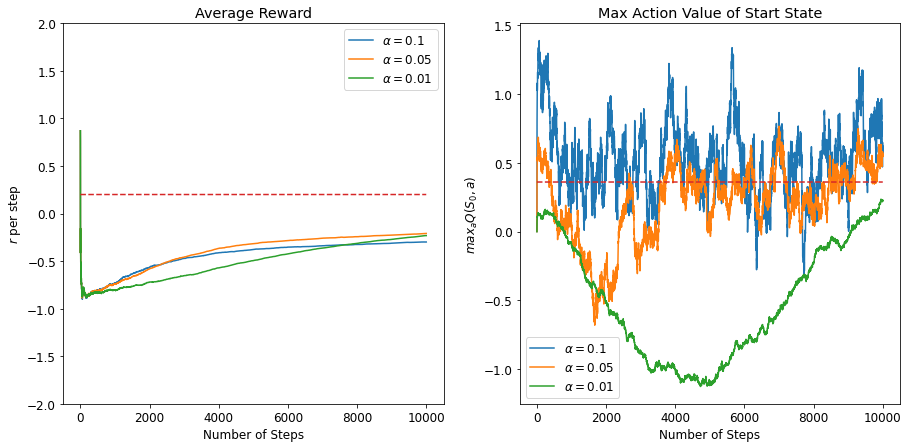

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_q2, params_q2)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

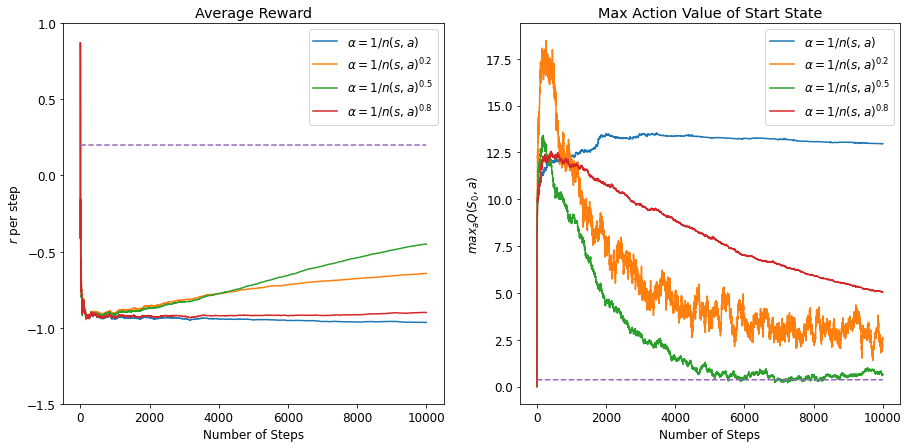

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_q2, params_q2)

#### Epsilon sweep - poly decay alpha

In [27]:
outputs_q3, params_q3 = run_agent_epsilon_sweep(QLAgent)

In [30]:
with open('q_learning_epsilon_sweep_output.pickle', 'wb') as handle:
    pickle.dump(outputs_q3, handle)

with open('q_learning_epsilon_sweep_params.pickle', 'wb') as handle:
    pickle.dump(params_q3, handle)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

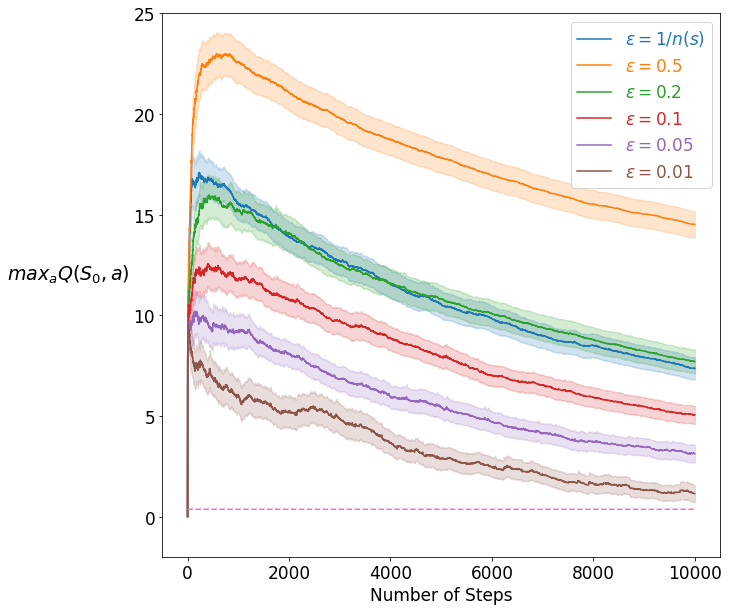

In [38]:
small_gridworld_sweep_plotting_epsilon(outputs_q3, params_q3)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

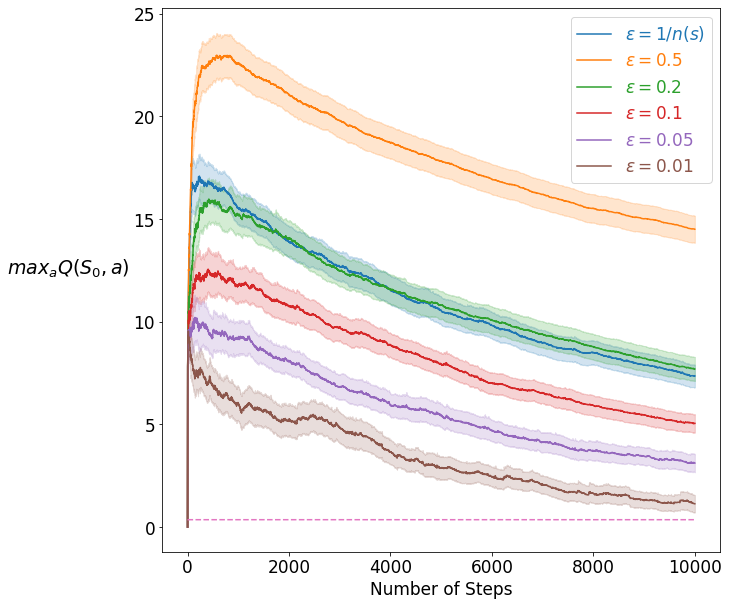

In [33]:
small_gridworld_sweep_plotting_epsilon(outputs_q3, params_q3)

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

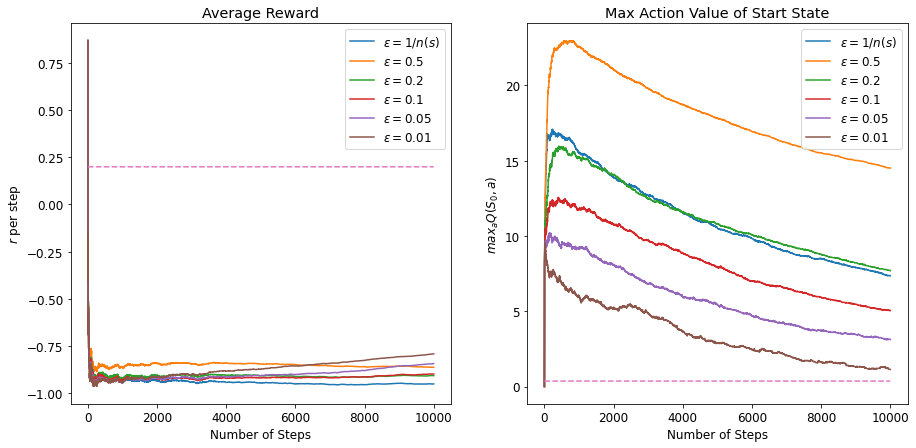

In [ ]:
small_gridworld_sweep_plotting_epsilon(outputs_q3, params_q3)

Conclusions:
Q-learning performed much better with the fixed alpha values compared to the decaying alpha values. We hypothesize that this is due to the fact that the maximization bias occurs at the beginning of learning and this is when the learning rate is greates for the decaying alpha. For example, the linear alpha starts 1, 1/2, 1/3, 1/4, 1/5,... which is much higher than the fixed rates we test. The agent must learn to overcome this bias bust this learning gets slower and slower as alpha decays. The decaying alpha causes fast learning when the agent suffers the most from maximization bias and slow learning as the agent learns to overcome the misestimation. The fixed alphas have a pattern of over estimation initially, but this is much smaller than with the decaying alphas and overcome much more quickly.

In general, a fixed alpha should be preferred unless we are certain the environment is stationary and can run our agent to convergence in the limit.

Larger epsilons seem to cause worse maximization bias. This may be due to exploration causing more visits to less frequented states where the alpha is larger (as alpha decays as a function of the count of the state action pair visitation count).

#### Learning Rate Sensitivity plots

In [ ]:
exponents = [0.01, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
# exponents = [0.01, 0.1, 0.8]
# alphas = [0.01, 0.05, 0.5]
outputs_q, params_q = run_agent_alpha_sweep(QLAgent, alphas = alphas, exponents = exponents)

#**Learning Rate Sensitivity plot for Q-Learning on 3x3 Grid World**

(50,)
(50,)
(50,)
[0.01, 0.05, 0.1, 0.5, 0.8]


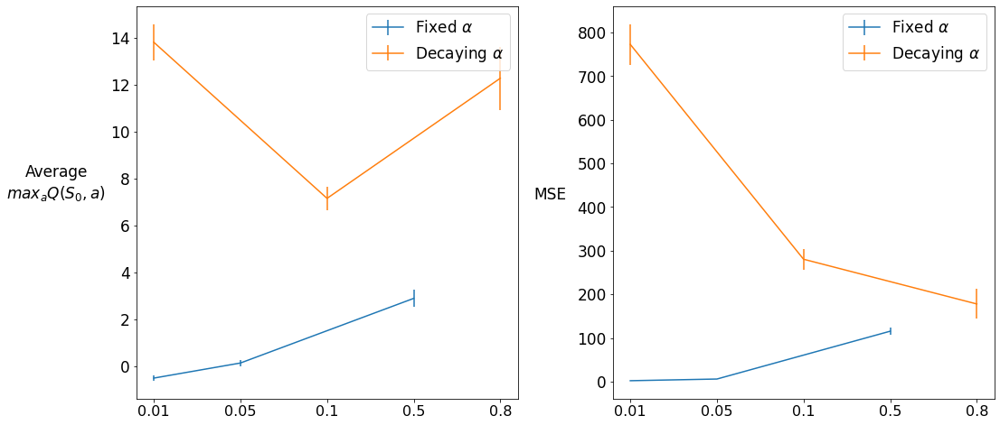

In [ ]:
small_gridworld_lr_sensitivity(outputs_q, params_q, alphas, exponents)

#**Learning Rate Sensitivity plot for Q-Learning on 3x3 Grid World**

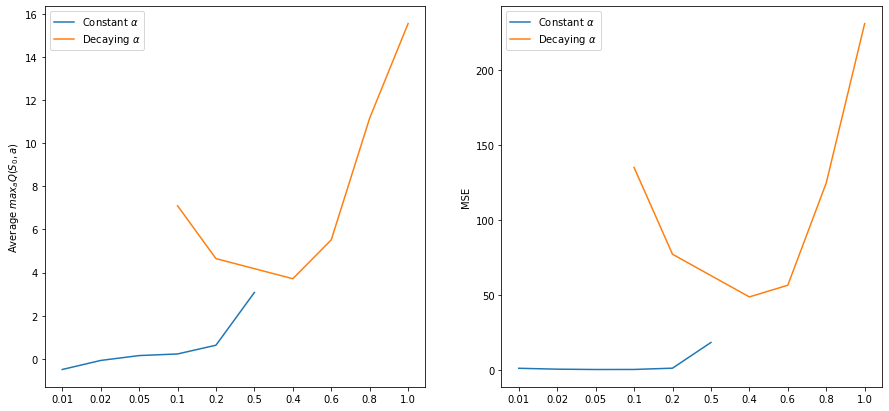

In [ ]:
small_gridworld_lr_sensitivity(outputs_q, params_q, alphas, exponents)

### Sarsa

#### Alpha sweep - decaying epsilon



In [ ]:
outputs_s1, params_s1 = run_agent_alpha_sweep(SarsaAgent)

In [ ]:
with open('sarsa_epsilon_sweep_output.pickle', 'wb') as handle:
    pickle.dump(outputs_q3, handle)

with open('sarsa_epsilon_sweep_params.pickle', 'wb') as handle:
    pickle.dump(params_q3, handle)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

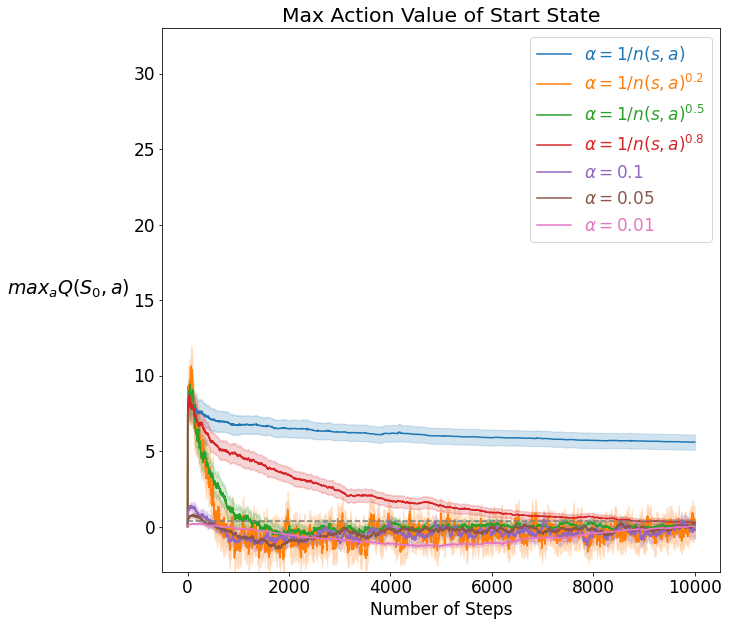

In [ ]:
small_gridworld_sweep_plotting(outputs_s1, params_s1)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

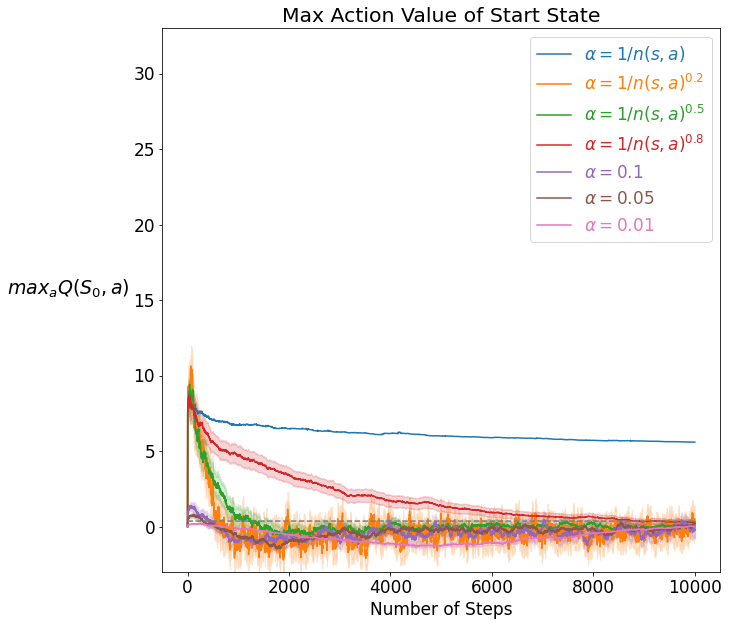

In [ ]:
small_gridworld_sweep_plotting(outputs_s1, params_s1)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

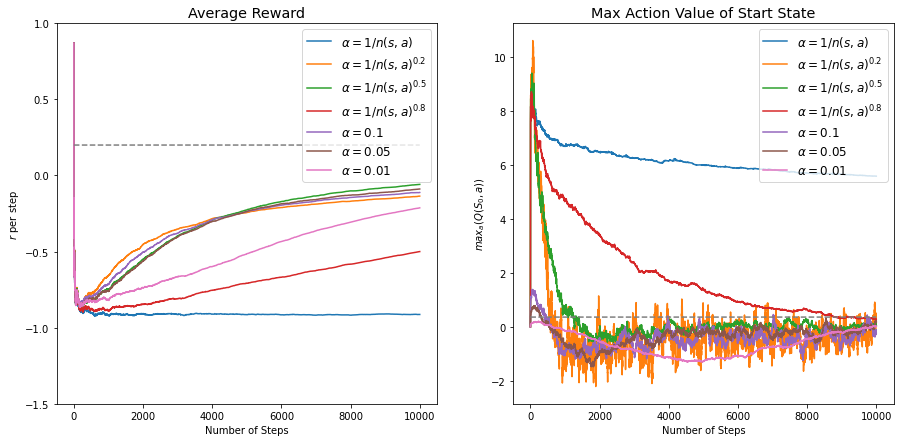

In [ ]:
small_gridworld_sweep_plotting(outputs_s1, params_s1)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

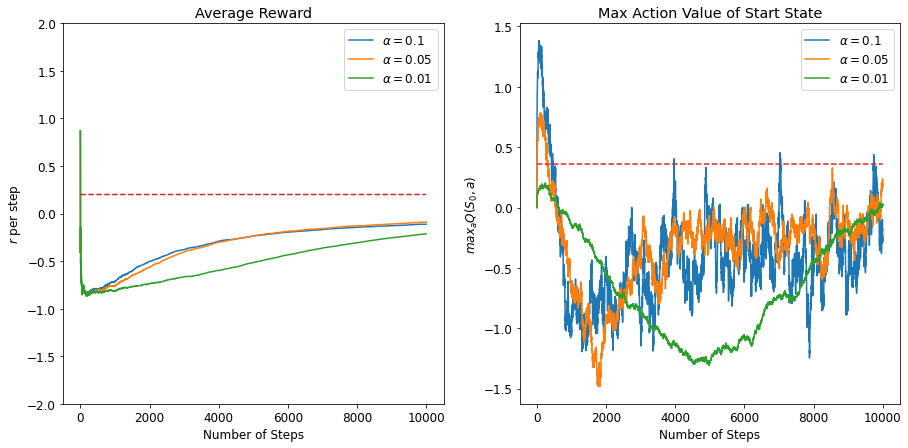

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_s1, params_s1)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

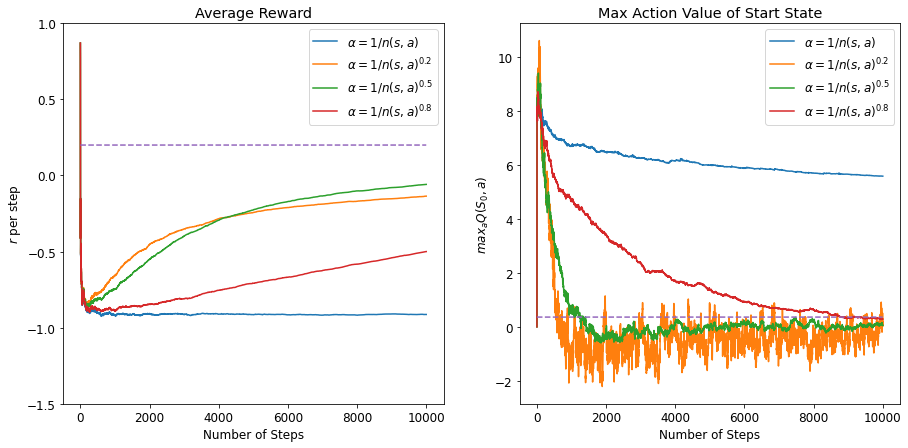

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_s1, params_s1)

#### Alpha sweep - fixed epsilon

In [ ]:
outputs_s2, params_s2 = run_agent_alpha_sweep_fixed_epsilon(SarsaAgent)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

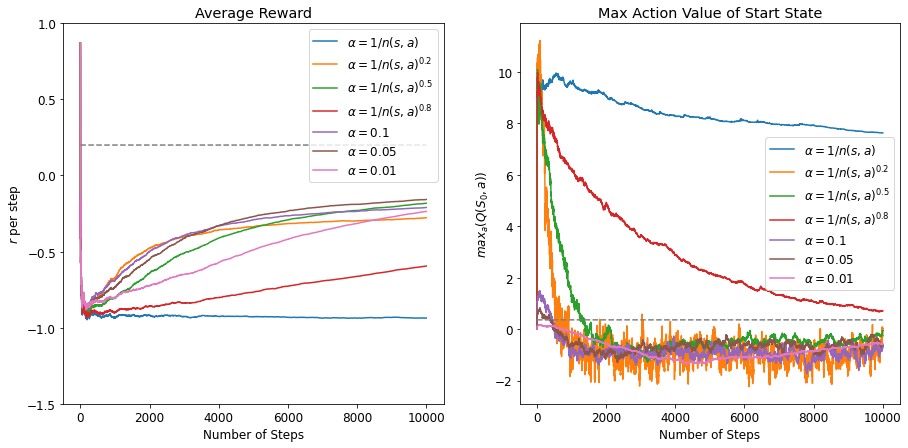

In [ ]:
small_gridworld_sweep_plotting(outputs_s2, params_s2)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

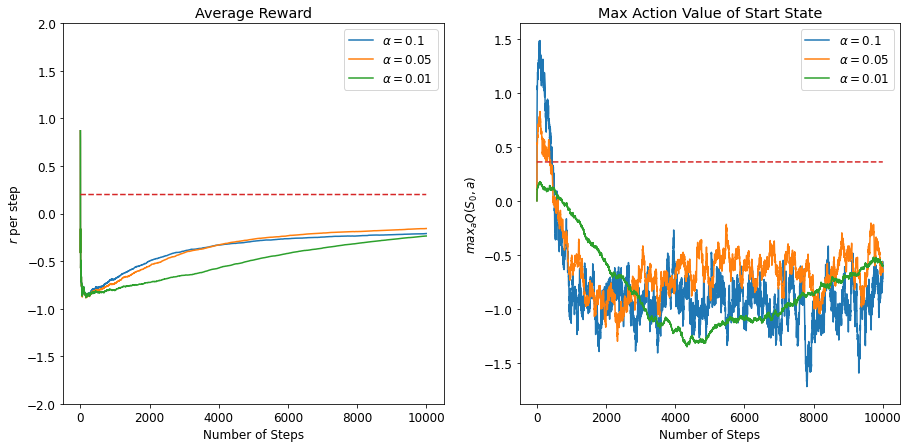

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_s2, params_s2)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

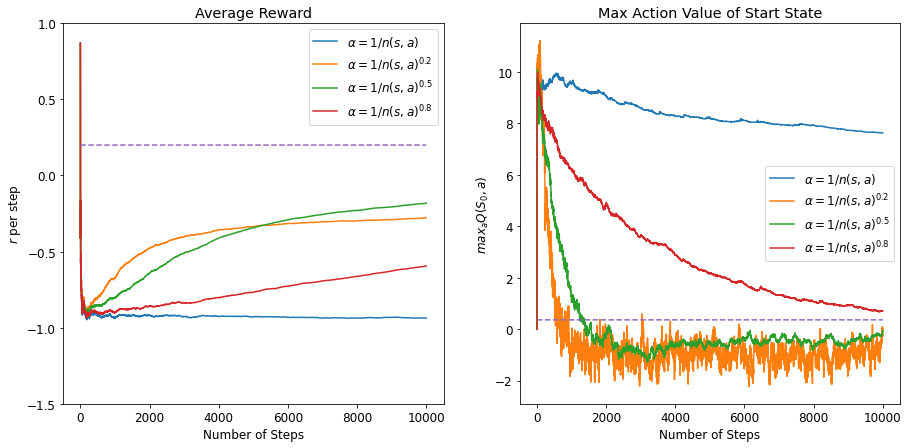

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_s2, params_s2)

#### Epsilon sweep - poly decay alpha

In [34]:
outputs_s3, params_s3 = run_agent_epsilon_sweep(SarsaAgent)

In [35]:
with open('sarsa_epsilon_sweep_output.pickle', 'wb') as handle:
    pickle.dump(outputs_q3, handle)

with open('sarsa_epsilon_sweep_params.pickle', 'wb') as handle:
    pickle.dump(params_q3, handle)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

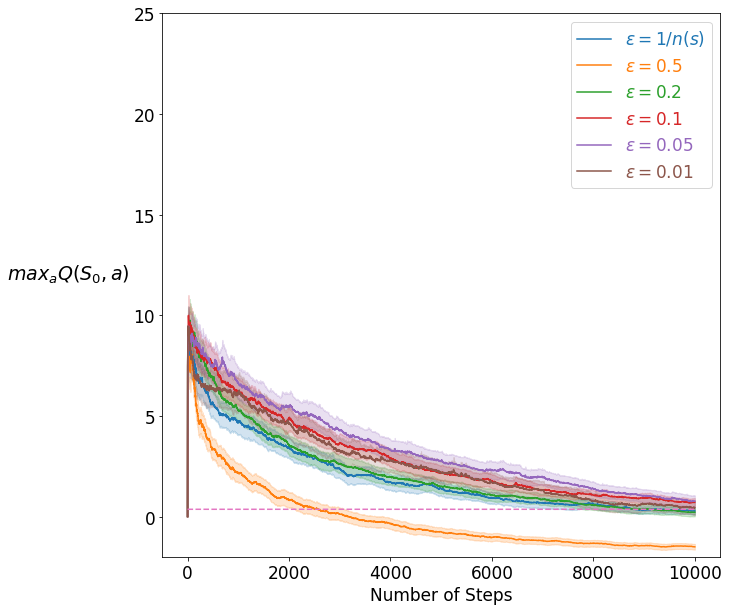

In [39]:
small_gridworld_sweep_plotting_epsilon(outputs_s3, params_s3)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

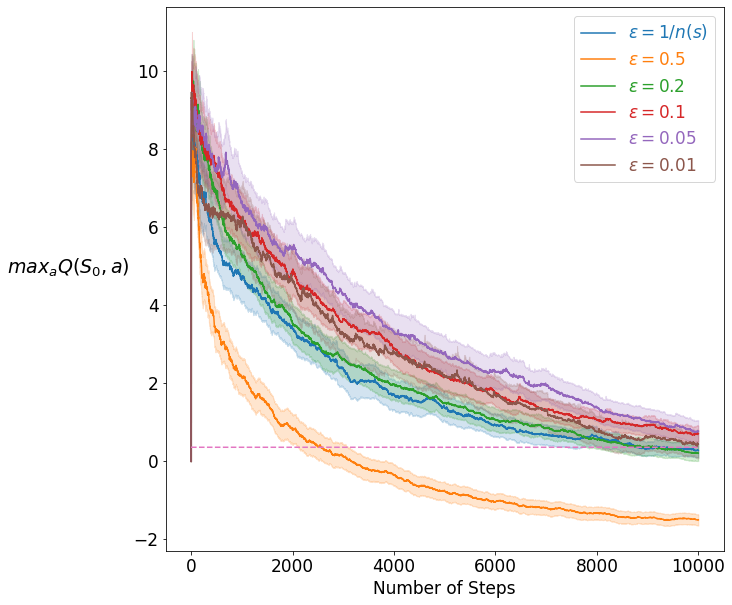

In [36]:
small_gridworld_sweep_plotting_epsilon(outputs_s3, params_s3)

Conclusion: Here we see similar results to Q learning where the fixed alphas perfrom much better in terms of value estimation and reward due to less maximization bias. However we can see that even for the decaying alphas Sarsa overcomes the maximization bias more quickly that Q learning. We hypothesize that this is due to the epsilon moves being incorporated into the value updates and not just being used for behaviour. While these epsilon moves generally represent non-optimal moves (as they are not the action that maximizes value), in this case they seem to combat the maximization bias precisely because they do not have the most overestimated value. The 'optimal' greedy actions represent the largest overestimations and the suboptimal actions have a value closer to the true value so actually improve our value estimate much more.

The agent learns faster with a decaying epsilon instead of a fixed epsilon (of 0.1). This is consistent with out hypothesis since the decaying epsilon will initially be larger (1, 1/2, 1/3,...) so the agent takes more random moves which actually have more realistic values and help move the estimate toward the correct value.

In contrast to Q learning, the better performing epsilons are the larger values. This is consistent with our hypothesis above as more 'suboptimal' epsilon moves actually help move our value estimate to the true value. Of course, we need to keep in mind that each epsilon corresponds to a different epsilon greedy policy and thus will move towards different value estimates and average rewards. However, the larger epsilons move toward their true values more quickly.

#### Learning Rate Sensitivity plots

In [40]:
exponents = [0.01, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
outputs_s1, params_s1 = run_agent_alpha_sweep(SarsaAgent, alphas = alphas, exponents = exponents)


In [166]:
exponents = [0.01, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
small_gridworld_lr_sensitivity(outputs_s1, params_s1, alphas, exponents)

#**Learning Rate Sensitivity plot for Sarsa on 3x3 Grid World**

0.6636477264353468
0.5370258934156523
0.46216938730363183
0.41471442238124345
0.5659537171034315
0.8346097988699952
1.711433061258864
3.4223553265534123
(200,)
0.30188693721927634
(200,)
0.2935417545224
(200,)
0.27002325181371745
(200,)
0.27444301990254566
(200,)
0.316909560824993
(200,)
0.4244953165021495
[0.01, 0.02, 0.05, 0.1, 0.2, 0.4, 0.5, 0.6, 0.8, 1]


TypeError: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7effeb401f80> (for post_execute):


TypeError: ignored

TypeError: ignored

<Figure size 1440x720 with 2 Axes>

### Expected Sarsa

#### Alpha sweep - decaying epsilon

In [ ]:
outputs_es1, params_es1 = run_agent_alpha_sweep(ExpectedSarsaAgent)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

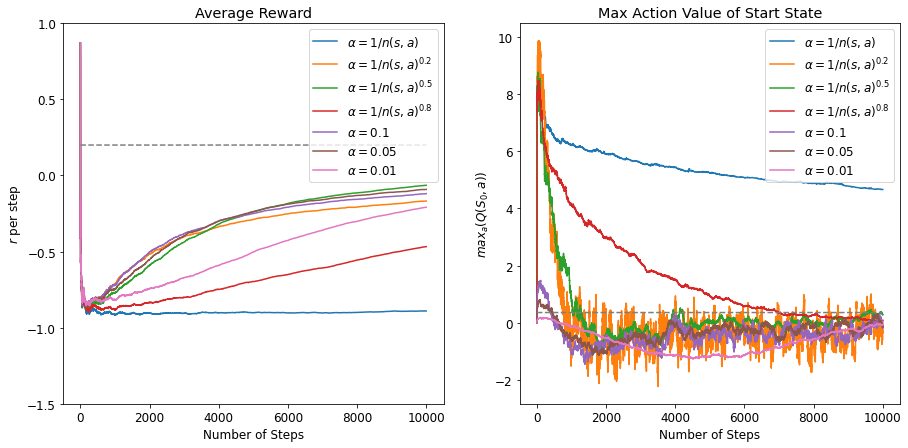

In [ ]:
small_gridworld_sweep_plotting(outputs_es1, params_es1)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

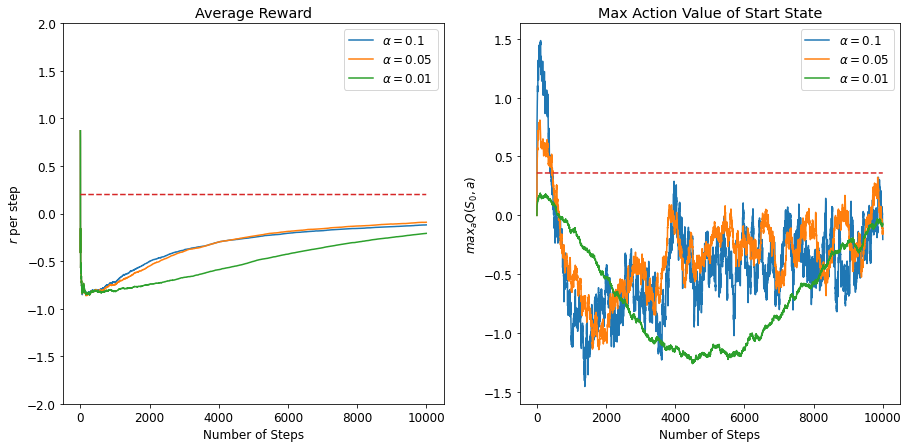

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_es1, params_es1)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

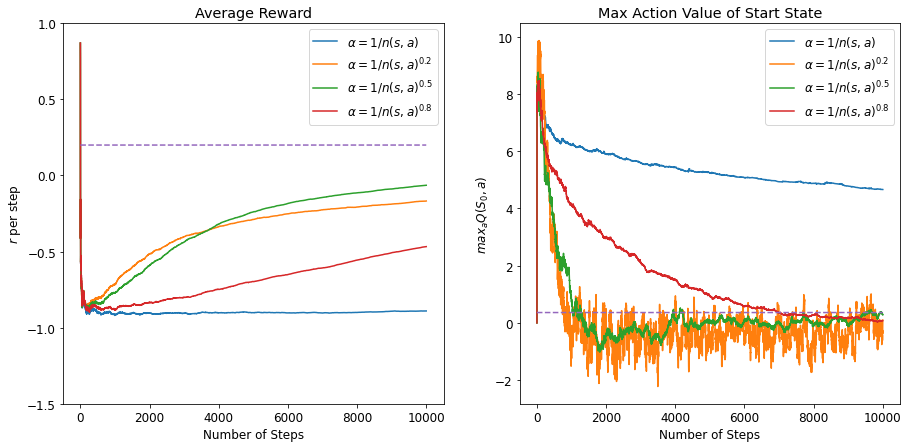

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_es1, params_es1)

#### Alpha sweep - fixed epsilon

In [ ]:
outputs_es2, params_es2 = run_agent_alpha_sweep_fixed_epsilon(ExpectedSarsaAgent)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

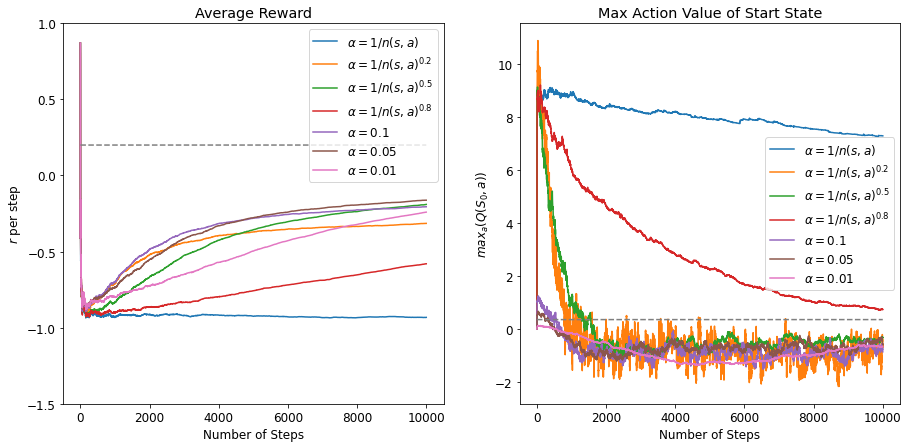

In [ ]:
small_gridworld_sweep_plotting(outputs_es2, params_es2)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

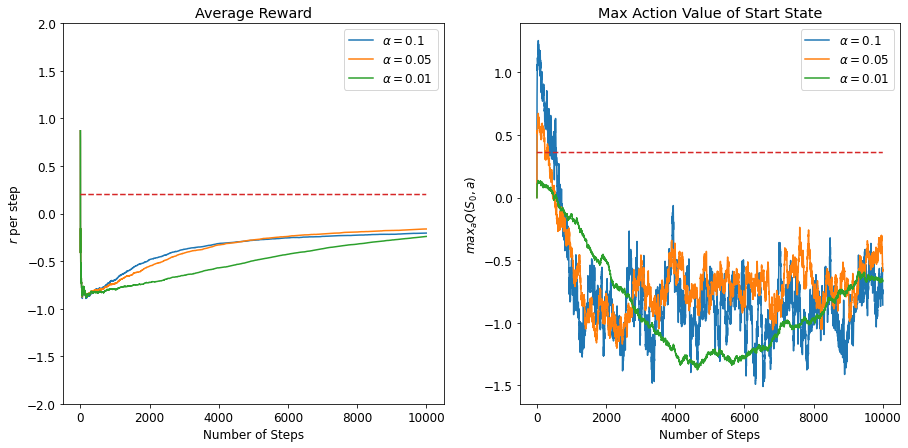

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_es2, params_es2)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

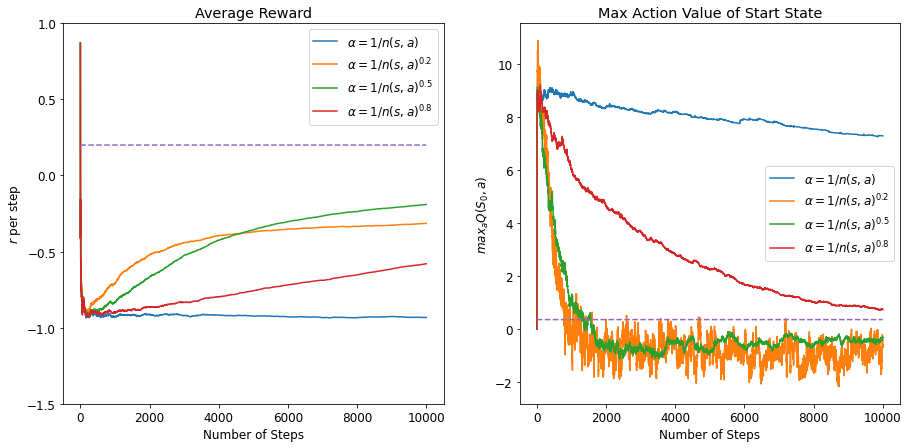

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_es2, params_es2)

#### Epsilon sweep - poly decay alpha

In [ ]:
outputs_es3, params_es3 = run_agent_epsilon_sweep(ExpectedSarsaAgent)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

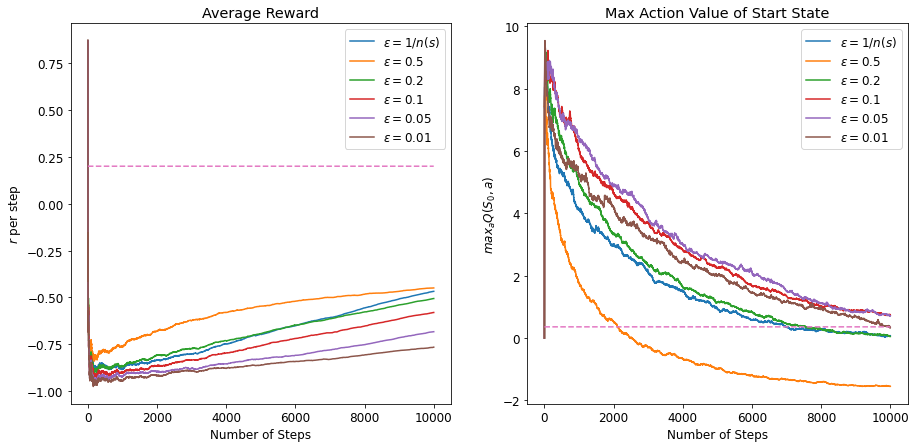

In [ ]:
small_gridworld_sweep_plotting_epsilon(outputs_es3, params_es3)

The pattern of behaviour/learning/performance is very similar for Sarsa and Expected Sarsa. Expected Sarsa does learn faster/perform better and the learning curves are smoother/less jagged/less variable. We expect this since Expected Sarsa computes the expectation and uses it each updated. Sarsa has the same update in expectation but each sample is more variable than the computation.

#### Learning Rate Sensitivity plots

In [ ]:
exponents = [0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
outputs_es, params_es = run_agent_alpha_sweep(ExpectedSarsaAgent, alphas = alphas, exponents = exponents)

#**Learning Rate Sensitivity plot for Expected Sarsa on 3x3 Grid World**

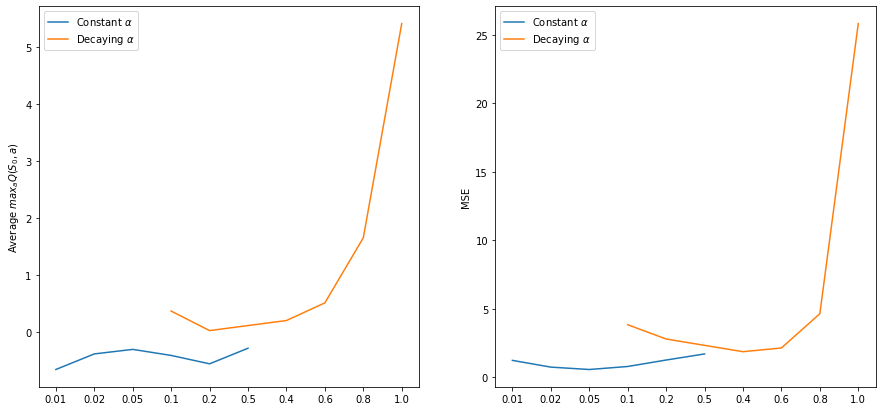

In [ ]:
small_gridworld_lr_sensitivity(outputs_es, params_es, alphas, exponents)

### N-step Sarsa

#### Alpha sweep - decaying epsilon, n = 1

In [ ]:
outputs_ns1, params_ns1 = run_agent_alpha_sweep(NstepSarsaAgent, num_steps=1)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

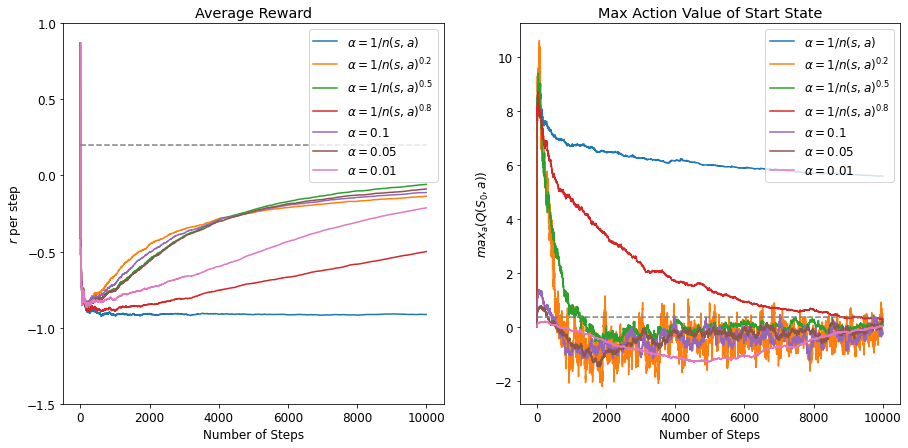

In [ ]:
small_gridworld_sweep_plotting(outputs_ns1, params_ns1)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

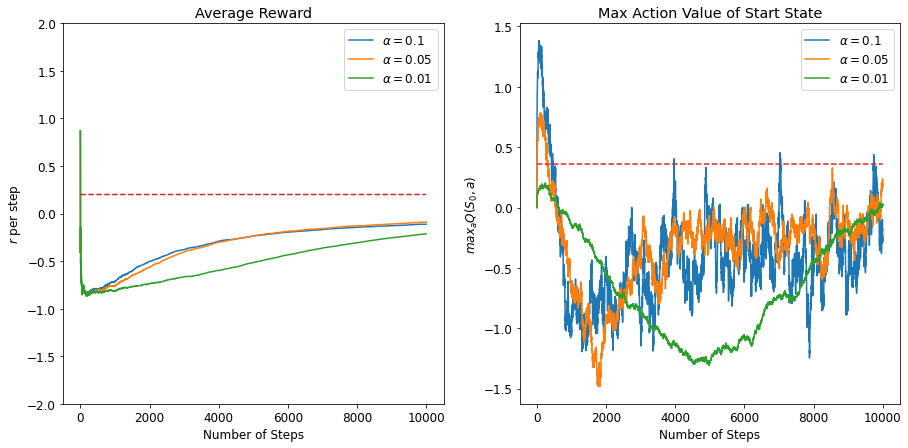

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_ns1, params_ns1)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

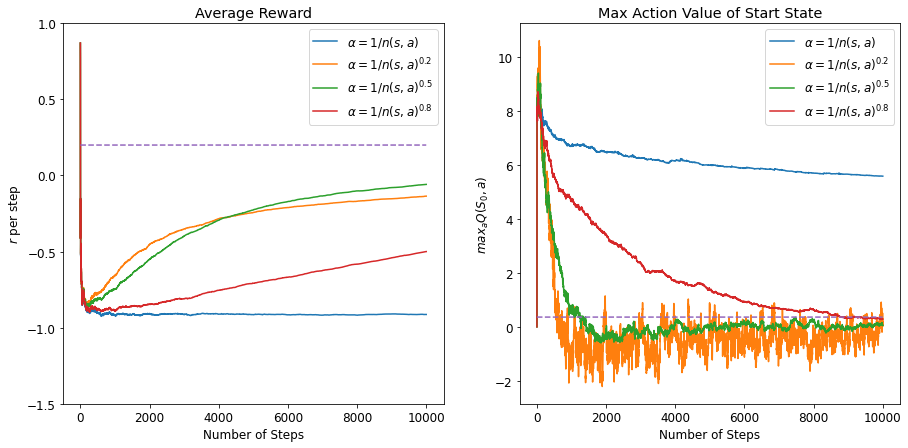

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_ns1, params_ns1)

#### Alpha sweep - decaying epsilon, n = 2

In [ ]:
outputs_ns2, params_ns2 = run_agent_alpha_sweep(NstepSarsaAgent, num_steps=2)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

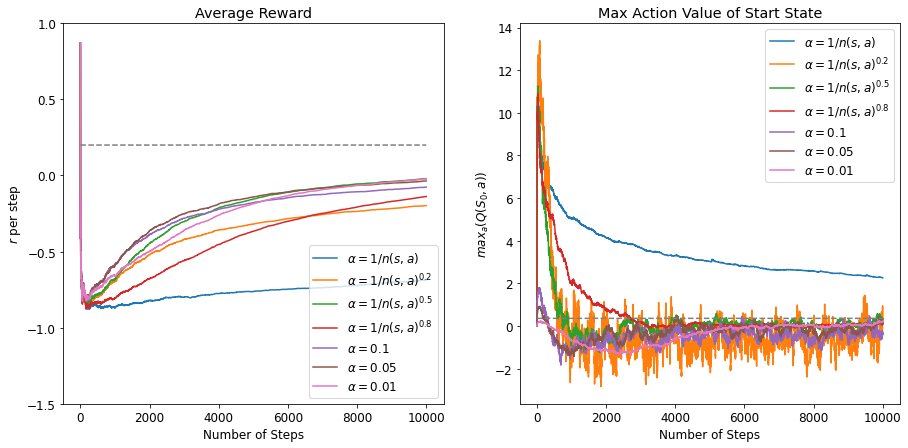

In [ ]:
small_gridworld_sweep_plotting(outputs_ns2, params_ns2)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

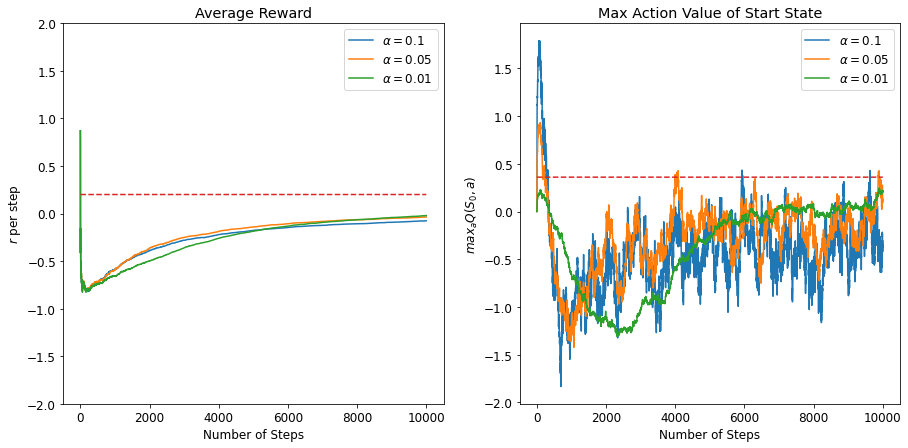

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_ns2, params_ns2)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

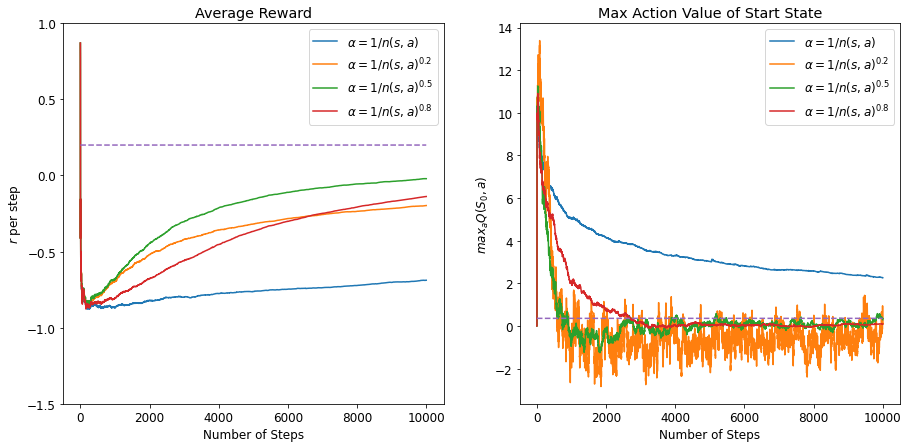

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_ns2, params_ns2)

##### Learning Rate Sensitivity plots

In [ ]:
exponents = [0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
outputs_nsteps2, params_nsteps2 = run_agent_alpha_sweep(NstepSarsaAgent, alphas = alphas, exponents = exponents, num_steps=2)

#**Learning Rate Sensitivity plot for n-step Sarsa on 3x3 Grid World**

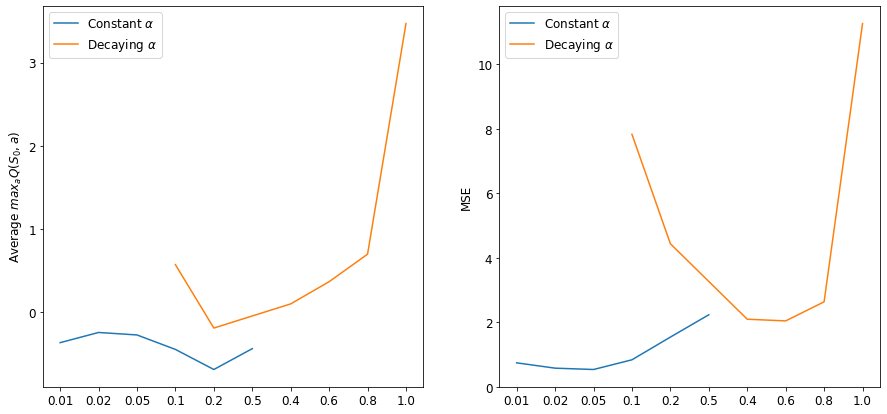

In [ ]:
small_gridworld_lr_sensitivity(outputs_nsteps2, params_nsteps2, alphas, exponents)

#### Alpha sweep - decaying epsilon, n = 3

In [ ]:
outputs_ns3, params_ns3 = run_agent_alpha_sweep(NstepSarsaAgent, num_steps=3)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

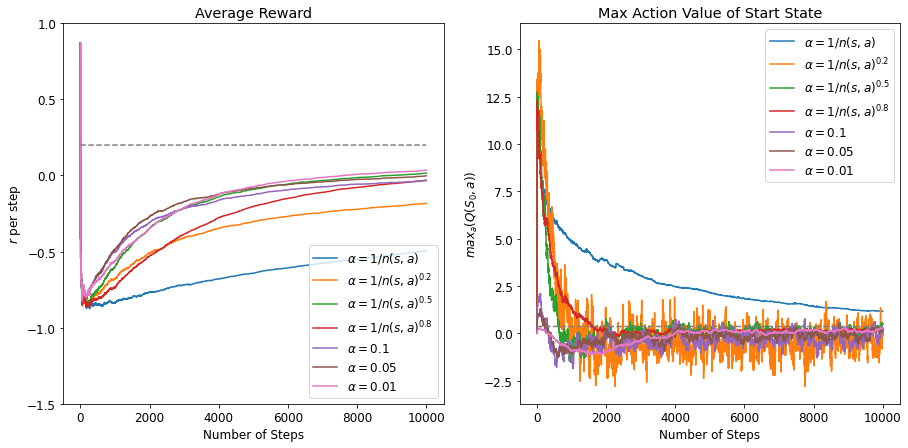

In [ ]:
small_gridworld_sweep_plotting(outputs_ns3, params_ns3)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

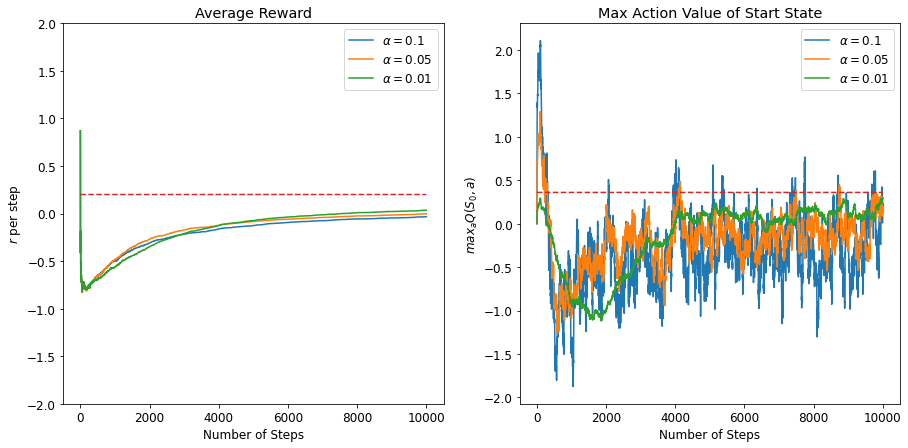

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_ns3, params_ns3)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

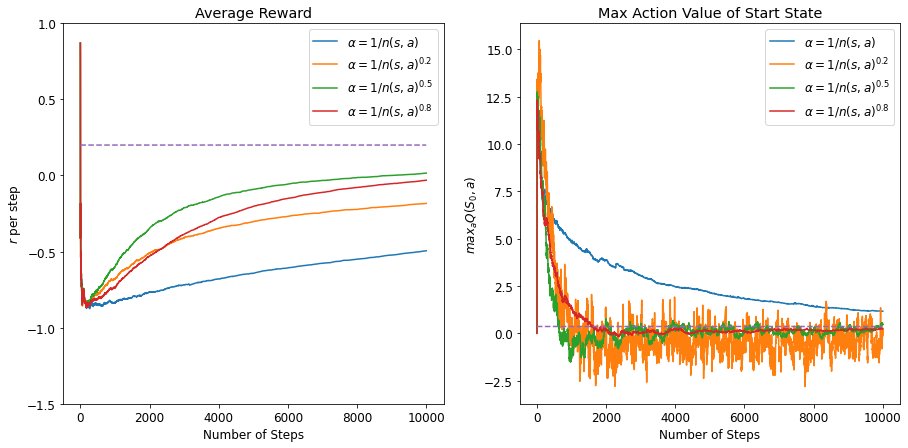

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_ns3, params_ns3)

##### Learning Rate Sensitivity plots

In [ ]:
exponents = [0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
outputs_nsteps3, params_nsteps3 = run_agent_alpha_sweep(NstepSarsaAgent, alphas = alphas, exponents = exponents, num_steps=3)

#**Learning Rate Sensitivity plot for n-step Sarsa on 3x3 Grid World**

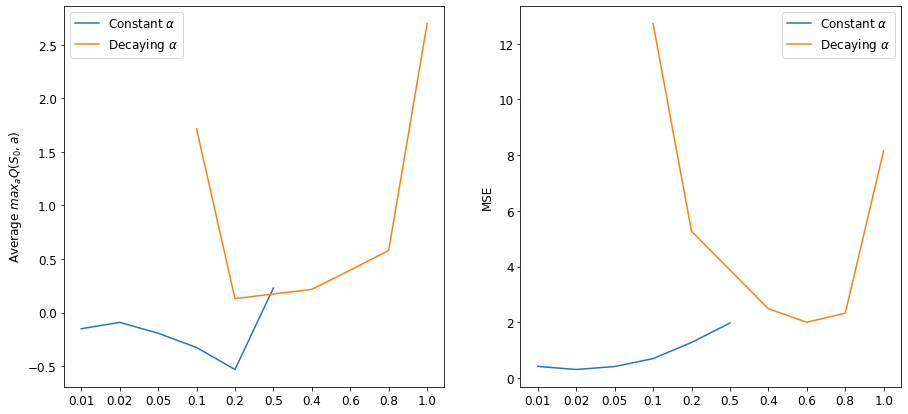

In [ ]:
small_gridworld_lr_sensitivity(outputs_nsteps3, params_nsteps3, alphas, exponents)

#### Alpha sweep - decaying epsilon, n = 4

In [ ]:
outputs_ns4, params_ns4 = run_agent_alpha_sweep(NstepSarsaAgent, num_steps=4)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

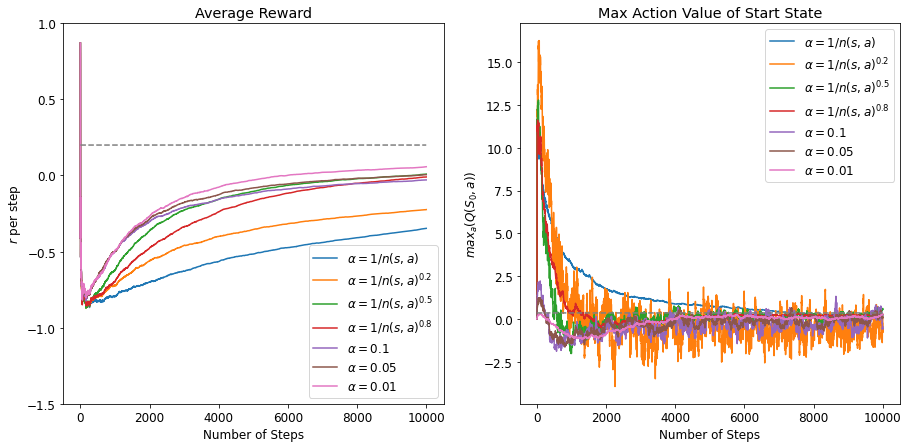

In [ ]:
small_gridworld_sweep_plotting(outputs_ns4, params_ns4)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

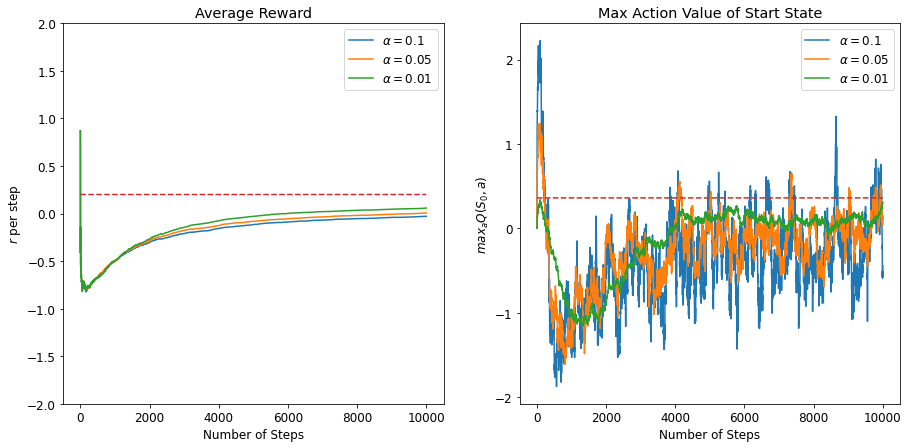

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_ns4, params_ns4)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

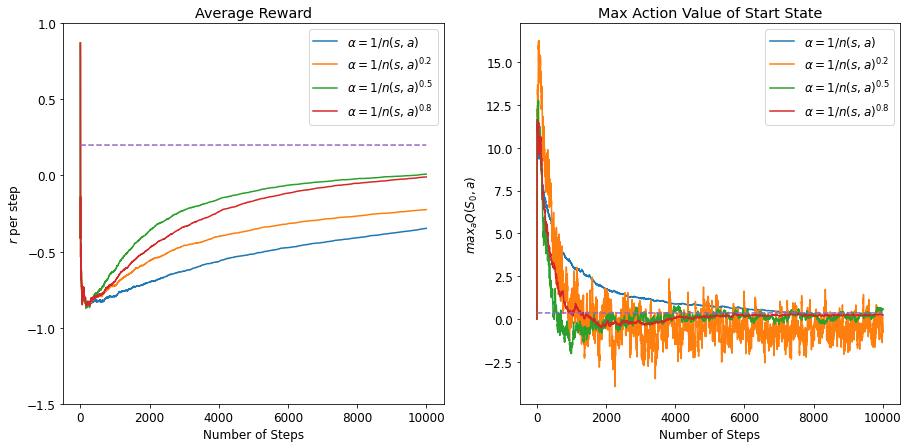

In [ ]:
small_gridworld_sweep_plotting_decay_alpha_only(outputs_ns4, params_ns4)

##### Learning Rate Sensitivity plots

In [ ]:
exponents = [0.1, 0.2, 0.4, 0.6, 0.8, 1]
alphas = [0.01, 0.02, 0.05, 0.1, 0.2, 0.5]
outputs_nsteps4, params_nsteps4 = run_agent_alpha_sweep(NstepSarsaAgent, alphas = alphas, exponents = exponents, num_steps=4)

#**Learning Rate Sensitivity plot for n-step Sarsa on 3x3 Grid World**

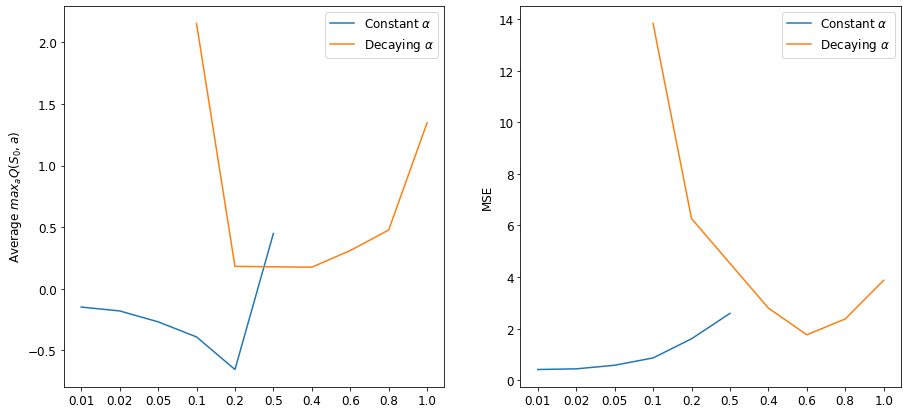

In [ ]:
small_gridworld_lr_sensitivity(outputs_nsteps4, params_nsteps4, alphas, exponents)

#### Epsilon sweep - poly decay alpha

In [ ]:
outputs_ns5, params_ns5 = run_agent_epsilon_sweep(NstepSarsaAgent, num_steps=3)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

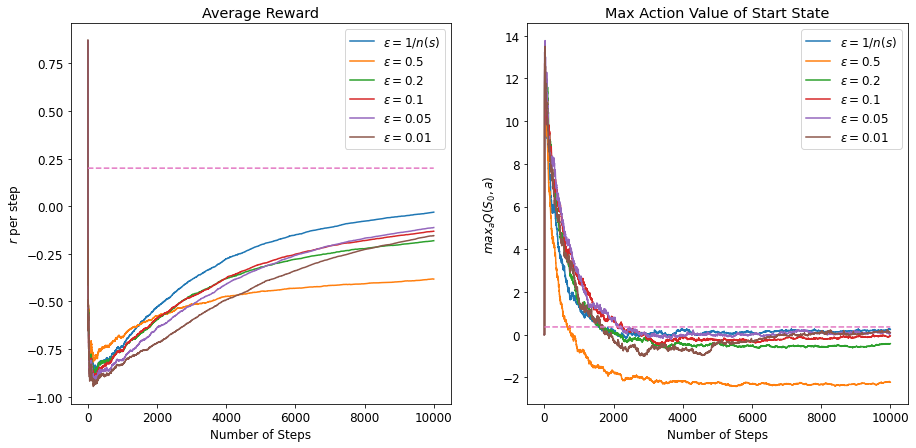

In [ ]:
small_gridworld_sweep_plotting_epsilon(outputs_ns5, params_ns5)

N step Sarsa with n=1 performs exactly as Sarsa (as it should unless the code is wrong).

As we increase n, the maximization bias seems to peak a bit higher initially but is more quickly overcome. Larger n's correspond to quicker learning until we approach monte carlo full episode length updates.

## Decaying LR - Best vs Best plot
For the initial draft, I am eyeballing the best decaying Learning rate from the above sweeps and plotting the best vs best plots for all algorithms (Average reward and max action value)

In [ ]:
agent_3x3gw_params = dict()
agent_3x3gw_params["agent_cls"] = QLAgent
agent_3x3gw_params["env_info"] = {}
agent_3x3gw_params["agent_info"] = {
    "num_states": 9,
    "num_actions": 4,
    "epsilon": 0.1,
    "gamma": 0.95,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 2,
    "exploration_type": 1
}
agent_3x3gw_params["run_info"] = {"num_runs": 200, "num_episodes": 10, "max_steps": 10000}

In [ ]:
outputs = list()
agents = [[QLAgent, 0.2], [SarsaAgent, 0.5], [ExpectedSarsaAgent, 0.5], [NstepSarsaAgent, 0.5]]
outputs = list()
n_steps = 1
for agent in agents:
    print(f"Running {agent[0].algorithm}")
    agent_3x3gw_params["agent_cls"] = agent[0]
    agent_3x3gw_params["agent_info"]["exponent"] = agent[1]
    if agent[0] == NstepSarsaAgent:
        n_steps = 3
    agent_3x3gw_params["agent_info"]["n_steps"] = n_steps
    print(agent_3x3gw_params.keys())
    output = run_agent(**copy(agent_3x3gw_params))
    outputs.append({'metrics': output, "params": copy(agent_3x3gw_params)}) 
    # n_steps = 1
    # if agents[0] == NstepSarsaAgent:
    #     n_steps = 3
    # output, params = run_agent_alpha_sweep(agent[0], num_steps = n_steps, alphas=[], exponents = [agents[1]], lin_poly=False)
    # outputs.append([output, params])

Running Q-Learning
dict_keys(['agent_cls', 'env_info', 'agent_info', 'run_info'])



Running Sarsa
dict_keys(['agent_cls', 'env_info', 'agent_info', 'run_info'])



Running Expected Sarsa
dict_keys(['agent_cls', 'env_info', 'agent_info', 'run_info'])



Running n-step Sarsa
dict_keys(['agent_cls', 'env_info', 'agent_info', 'run_info'])


Plot individual runs to check if distribution is Unimodel or Bimodal

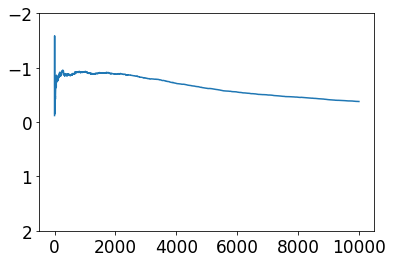

In [ ]:
# Rewrite code for distribution check - It did not get saved earlier

dict_keys(['state_values', 'state_values_all_runs', 'max_act_start_state', 'average_reward', 'episode_per_step'])


##**Average Reward and Max Action Value of Start State**

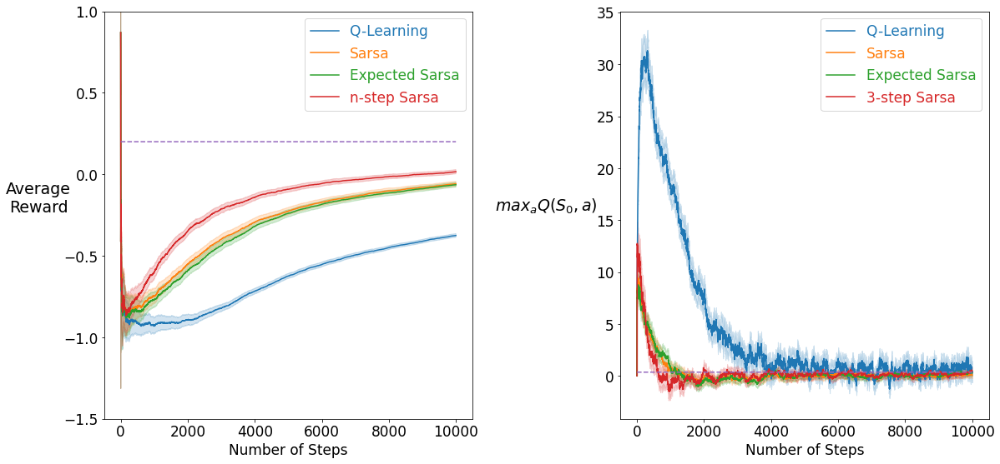

In [ ]:
small_gridworld_best_decaylr_with_eb(outputs)

dict_keys(['state_values', 'state_values_all_runs', 'max_act_start_state', 'average_reward', 'episode_per_step'])


##**Average Reward and Max Action Value of Start State**

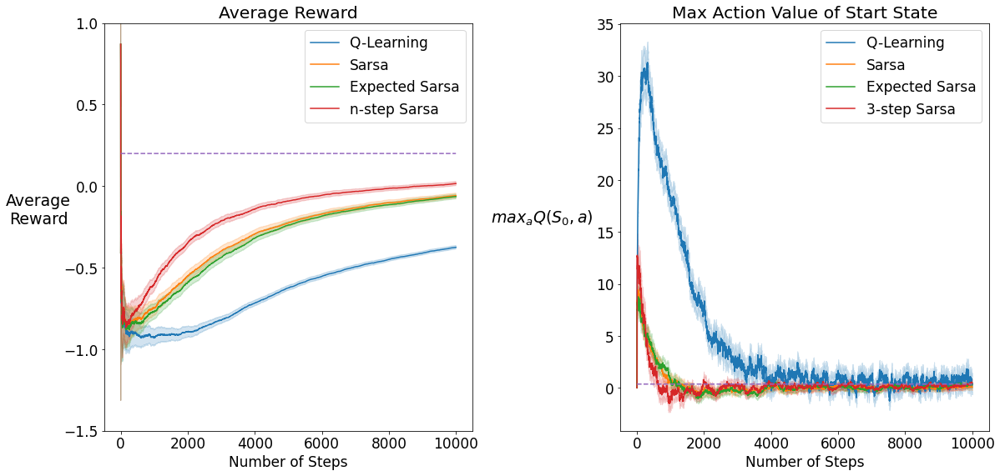

In [ ]:
small_gridworld_best_decaylr_with_eb(outputs)

Large Font size with Horizontal Labels

dict_keys(['state_values', 'state_values_all_runs', 'max_act_start_state', 'average_reward', 'episode_per_step'])


##**Average Reward and Max Action Value of Start State**

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


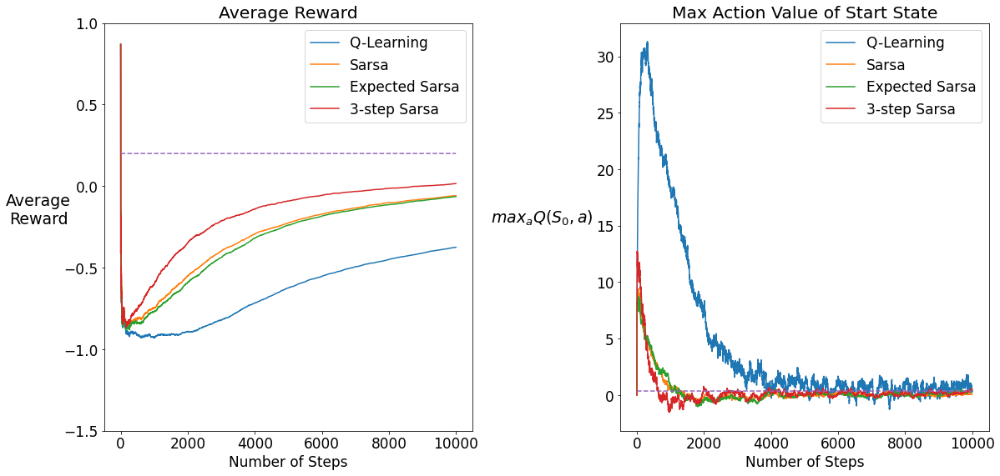

In [ ]:
small_gridworld_best_decaylr(outputs)

Large Font Size

dict_keys(['state_values', 'state_values_all_runs', 'max_act_start_state', 'average_reward', 'episode_per_step'])


##**Average Reward and Max Action Value of Start State**

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


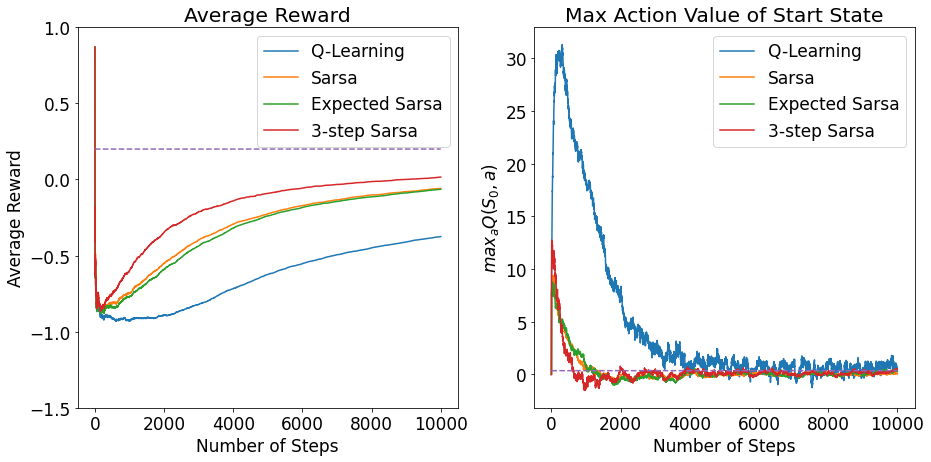

In [ ]:
small_gridworld_best_decaylr(outputs)

dict_keys(['state_values', 'state_values_all_runs', 'max_act_start_state', 'average_reward', 'episode_per_step'])


##**Average Reward and Max Action Value of Start State**

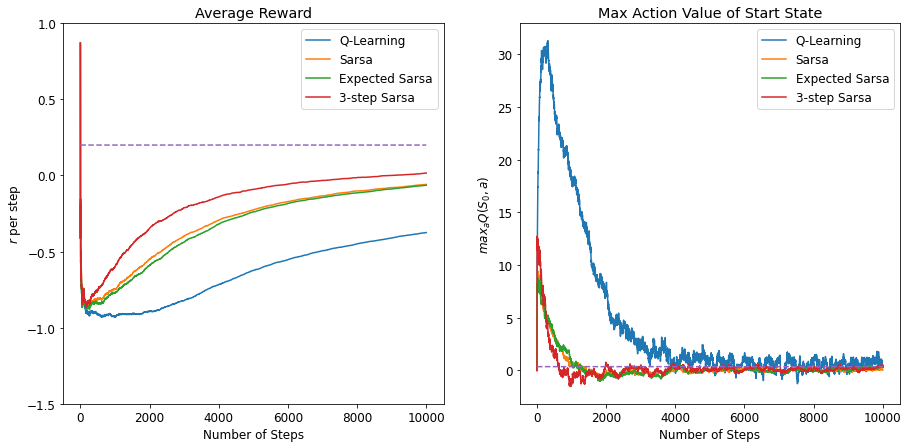

In [ ]:
small_gridworld_best_decaylr(outputs)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

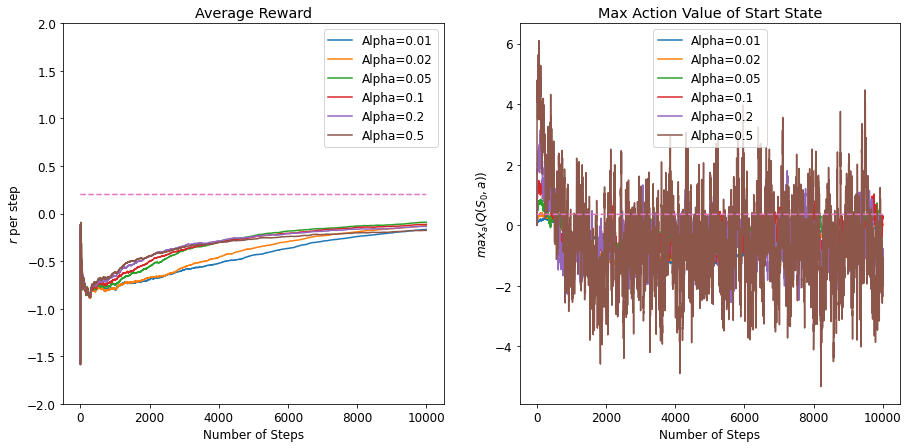

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(outputs_s1, params_s1, alphas=alphas)

# Reward Distribution Experiments - 3x3 Grid World

So far, we have reported the performance of different algorithms on a single environment. The Hyper Parameter sweeps section shows how a constant learning rate outperforms the decaying polynomial learning rate. But what is the relationship between the performance of a particular constant learning rate and the reward variance in an environment? 

To be specific, how much does overestimation hinder the performance of different algorithms in environments with different reward variance? Is there higher overestimation with increasing variance and hence, slower convergence?


First, let us try and plot the performance of different LRs on an environment with higher reward variance. Every report must consist of the reward variance used, and the plot should indicate all the alphas as labels. We are using decaying Epsilon here. 
Alphas used - [0.005, 0.01, 0.05, 0.1]. 

Two types of Reward Variance - 

1. Offset : Reward at each step is (-12 - offset, 10 + offset) 
2. Sampled from Normal Distribution: Reward at each step is $N(-1, \sigma^2)$

### Q-Learning

Experiments for constant alphas with **Offset-based reward variance**

In [ ]:
# Parameter Setup
alphas = [0.005, 0.01, 0.05, 0.1]
offsets = [0, 30, 60]
exponents = [0.2, 0.5, 0.8]

In [ ]:
# Q-Learning performance on environments with different offsets
revw_qlearning_outputs = dict()
for offset in offsets:
    print(f"Running for offset - {offset}")
    env_info={"reward_info": {"type": 0, "offset": offset}}
    revw_qlearning_outputs[offset], params = run_agent_alpha_sweep(QLAgent, env_info=env_info, alphas=alphas, lin_poly=False)

Running for offset - 0



Running for offset - 30



Running for offset - 60


##**Reward Variance : (-12, 10)**

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

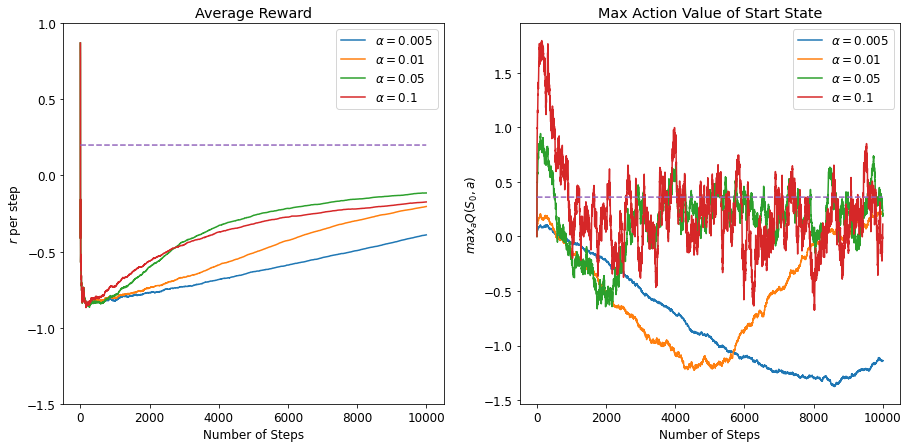

##**Reward Variance : (-42, 40)**

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

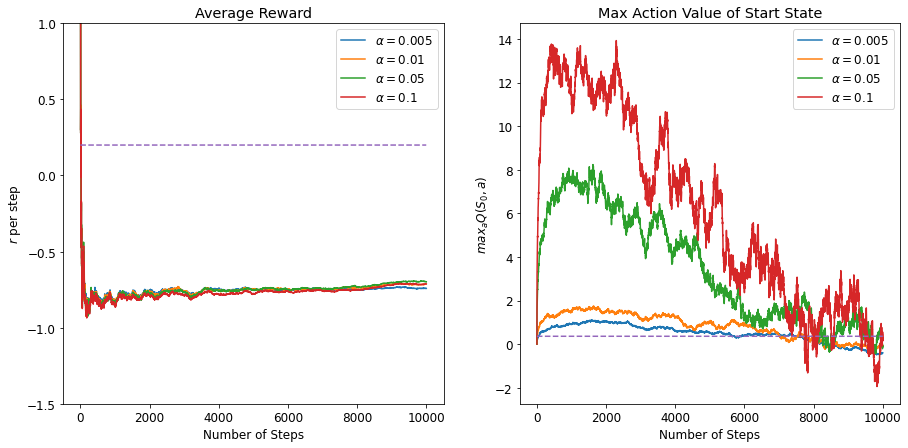

##**Reward Variance : (-72, 70)**

#**Output for Q-Learning on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

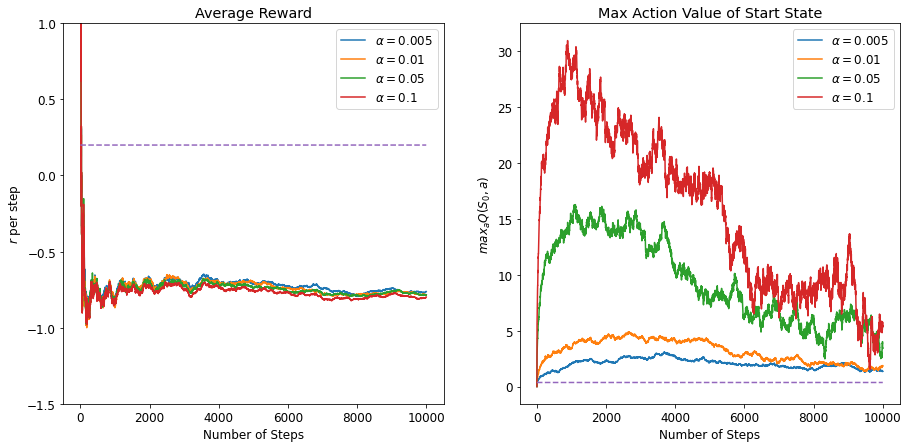

In [ ]:
revw_qlearning_outputs# Plotting results
for offset in offsets:
    printmd(f"##**Reward Variance : ({-12 - offset}, {10 + offset})**")
    small_gridworld_sweep_plotting_fixed_alpha_only(revw_qlearning_outputs[offset], params, alphas=alphas)

### Sarsa

#### Fixed Alpha

In [ ]:
# Sarsa performance on environments with different offsets
revw_sarsa_outputs = dict()
for offset in offsets:
    print(f"Running for offset - {offset}")
    env_info={"reward_info": {"type": 0, "offset": offset}}
    revw_sarsa_outputs[offset], params = run_agent_alpha_sweep(SarsaAgent, env_info=env_info, alphas=alphas, lin_poly=False)

Running for offset - 0



Running for offset - 30



Running for offset - 60


##**Reward Variance : (-12, 10)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

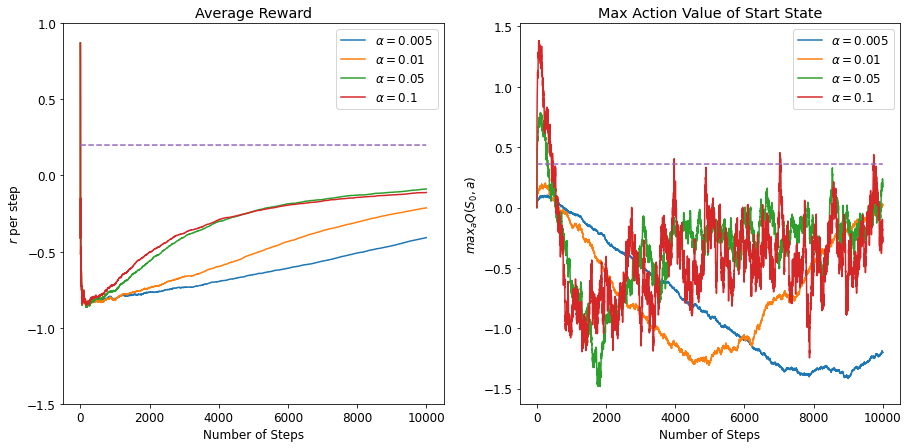

##**Reward Variance : (-42, 40)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

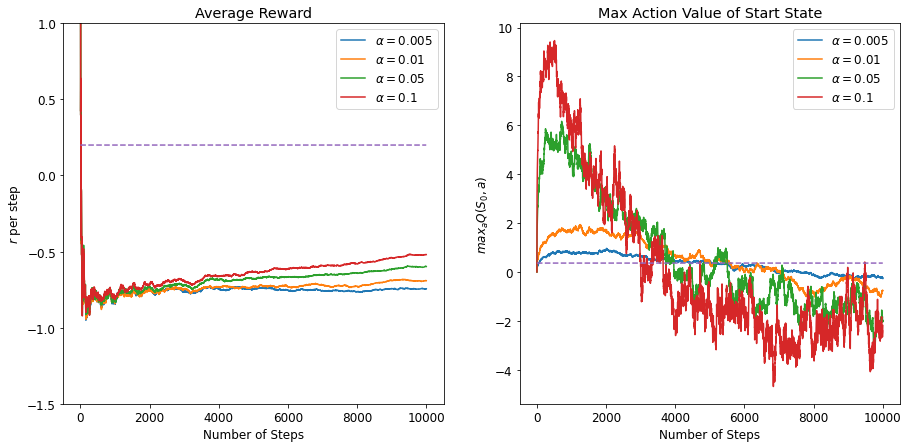

##**Reward Variance : (-72, 70)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

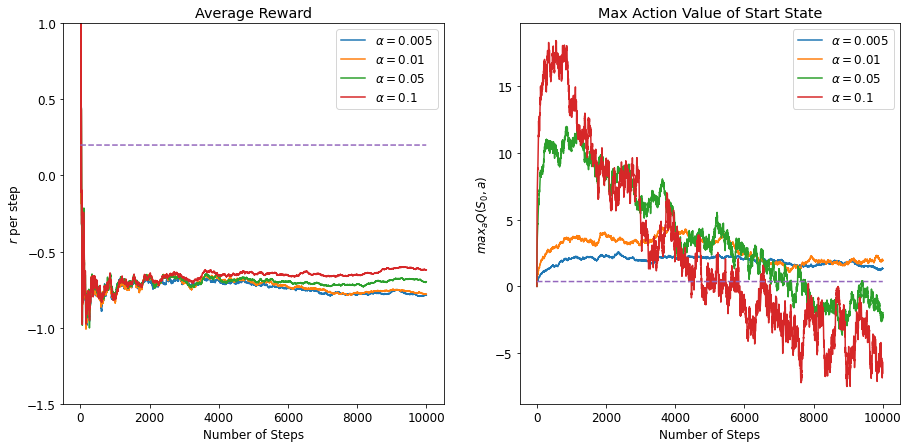

In [ ]:
# Plotting results
for offset in offsets:
    printmd(f"##**Reward Variance : ({-12 - offset}, {10 + offset})**")
    small_gridworld_sweep_plotting_fixed_alpha_only(revw_sarsa_outputs[offset], params, alphas=alphas)

#### Decaying Alpha

In [ ]:
# Sarsa performance on environments with different offsets
revw_sarsa_outputs = dict()
for offset in offsets:
    print(f"Running for offset - {offset}")
    env_info={"reward_info": {"type": 0, "offset": offset}}
    revw_sarsa_outputs[offset], params = run_agent_alpha_sweep(SarsaAgent, env_info=env_info, alphas=[], exponents = exponents)

Running for offset - 0



Running for offset - 30



Running for offset - 60


##**Reward Variance : (-12, 10)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

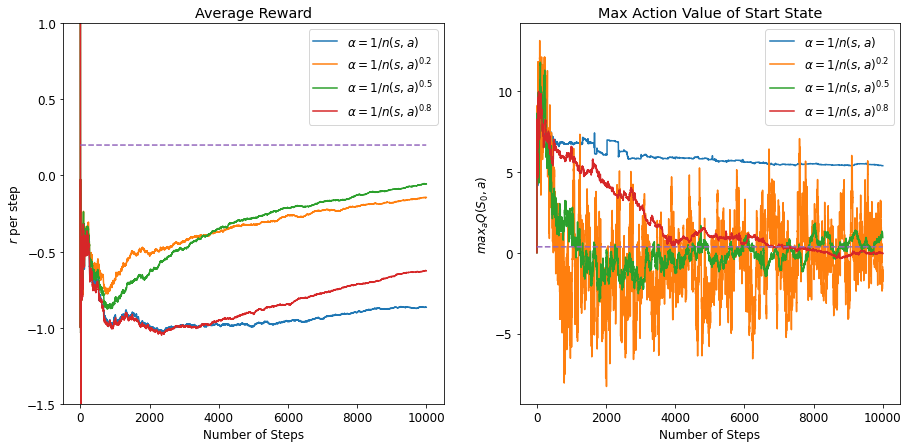

##**Reward Variance : (-42, 40)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

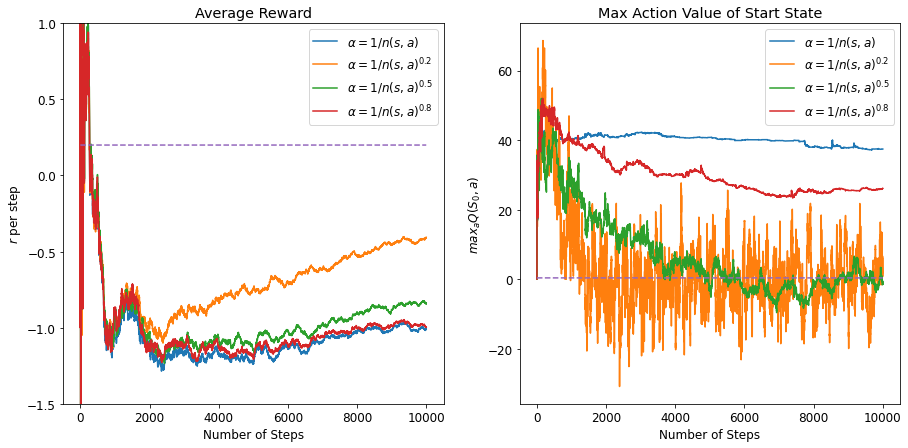

##**Reward Variance : (-72, 70)**

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

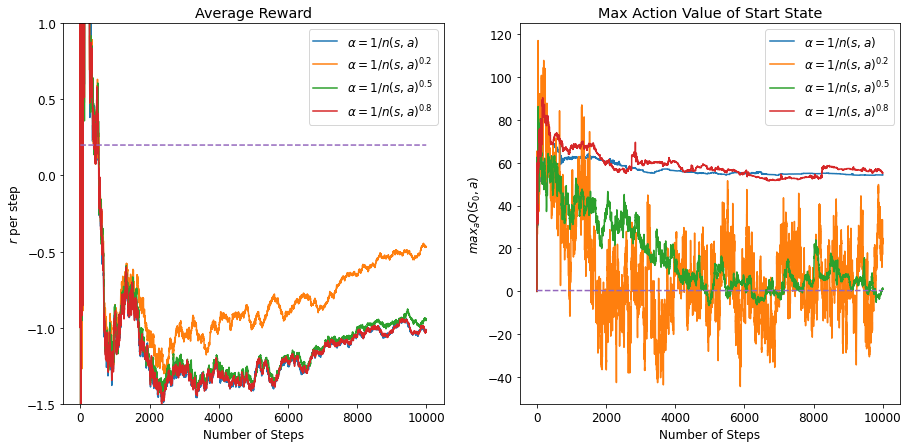

In [ ]:
# Plotting results
for offset in offsets:
    printmd(f"##**Reward Variance : ({-12 - offset}, {10 + offset})**")
    small_gridworld_sweep_plotting_decay_alpha_only(revw_sarsa_outputs[offset], params)

Conclusion - This experiment shows that the performance of Sarsa for different constant LRs is dependent on the reward variance. The performance deteriorates with large reward variance. 

### Expected Sarsa

In [ ]:
# Expected Sarsa performance on environments with different offsets
revw_esarsa_outputs = dict()
for offset in offsets:
    print(f"Running for offset - {offset}")
    env_info={"reward_info": {"type": 0, "offset": offset}}
    revw_esarsa_outputs[offset], params = run_agent_alpha_sweep(ExpectedSarsaAgent, env_info=env_info, alphas=alphas, lin_poly=False)

Running for offset - 0



Running for offset - 30



Running for offset - 60


##**Reward Variance : (-12, 10)**

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

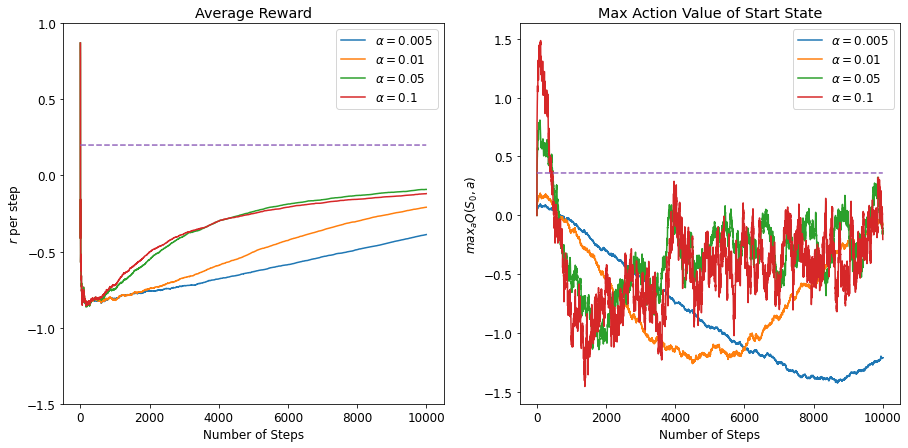

##**Reward Variance : (-42, 40)**

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

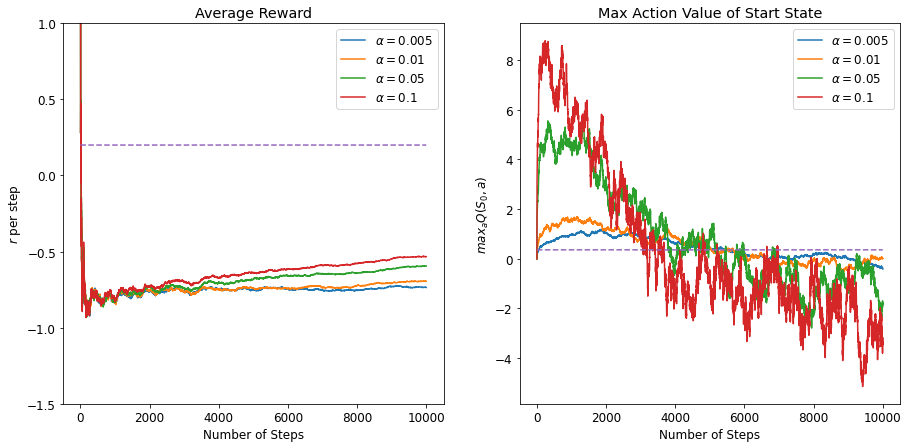

##**Reward Variance : (-72, 70)**

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

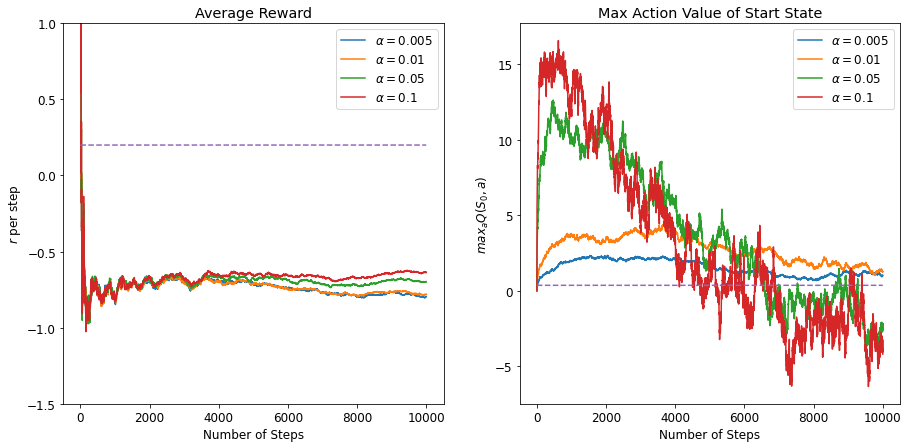

In [ ]:
# Plotting results
for offset in offsets:
    printmd(f"##**Reward Variance : ({-12 - offset}, {10 + offset})**")
    small_gridworld_sweep_plotting_fixed_alpha_only(revw_esarsa_outputs[offset], params, alphas=alphas)

## n-step Sarsa

In [ ]:
# n-step Sarsa performance on environments with different offsets
n_values = [2, 3, 4]
revw_nsarsa_outputs = dict()
for n in n_values:
    print(f"Running for n = {n}")
    revw_nsarsa_outputs[n] = dict()
    for offset in offsets:
        print(f"Running for offset - {offset}")
        env_info={"reward_info": {"type": 0, "offset": offset}}
        revw_nsarsa_outputs[n][offset], params = run_agent_alpha_sweep(NstepSarsaAgent, env_info=env_info, alphas=alphas, lin_poly=False, num_steps=n)

Running for n = 2
Running for offset - 0



Running for offset - 30



Running for offset - 60



Running for n = 3
Running for offset - 0



Running for offset - 30



Running for offset - 60



Running for n = 4
Running for offset - 0



Running for offset - 30



Running for offset - 60


##**n=2**

##**Reward Variance : (-12, 10)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

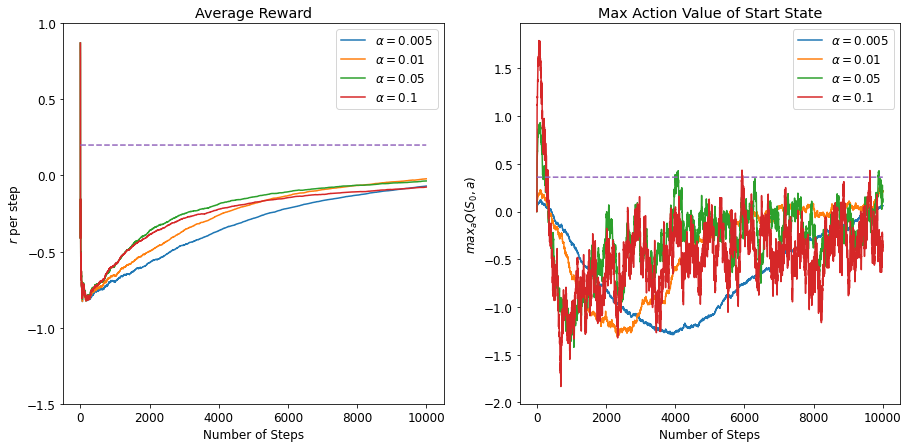

##**Reward Variance : (-42, 40)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

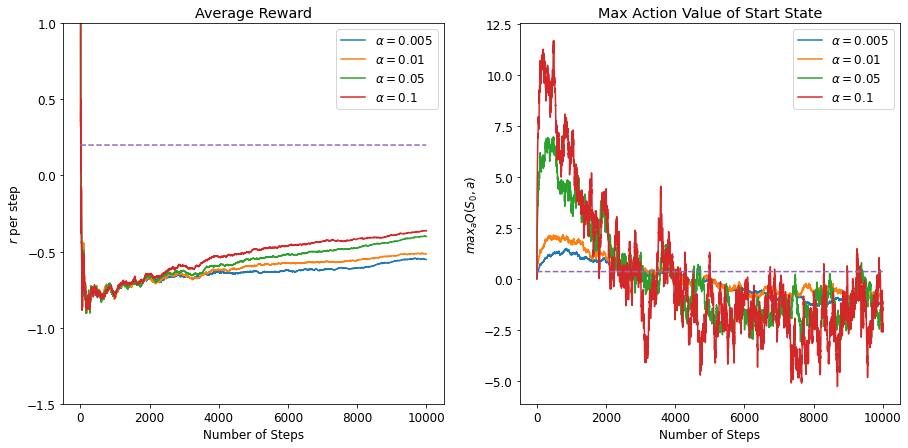

##**Reward Variance : (-72, 70)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

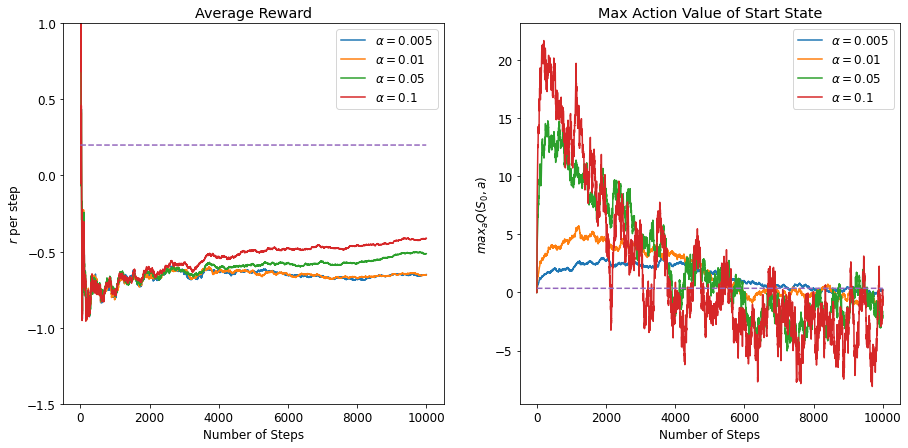

##**n=3**

##**Reward Variance : (-12, 10)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

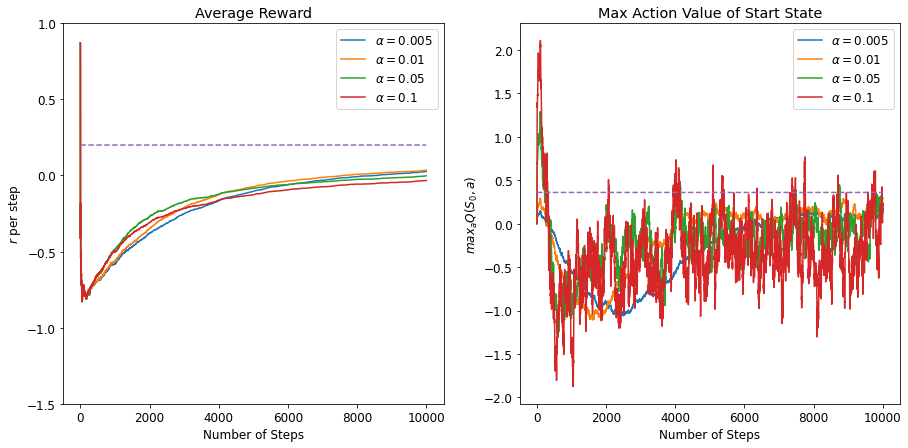

##**Reward Variance : (-42, 40)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

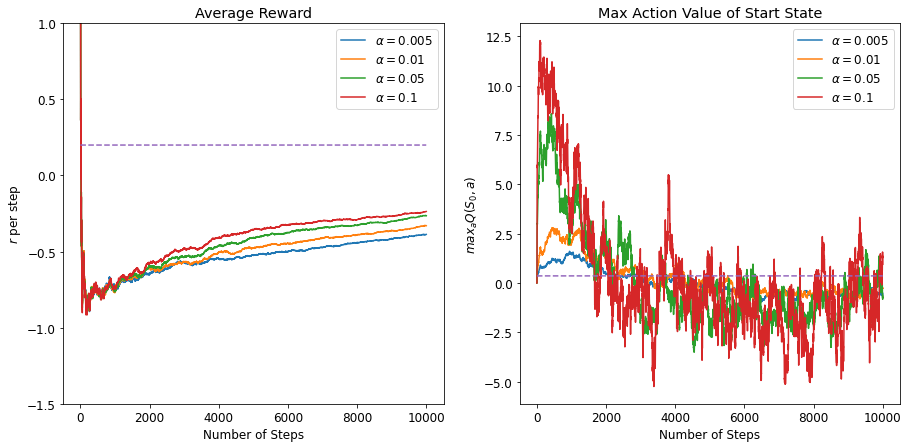

##**Reward Variance : (-72, 70)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

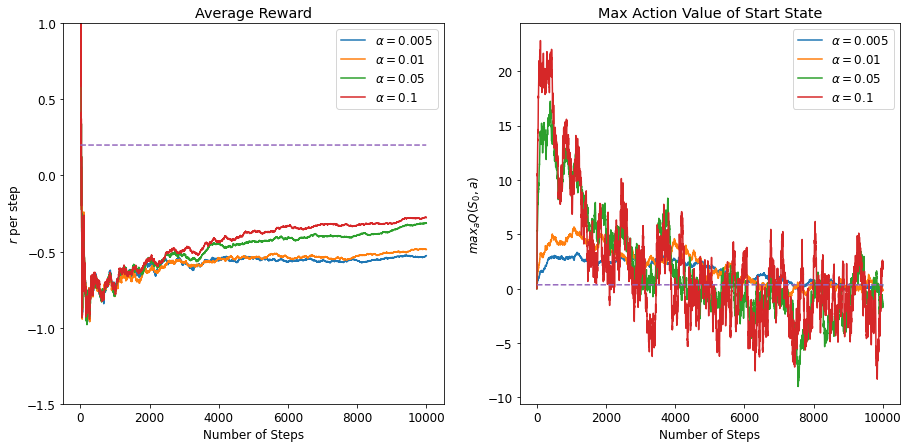

##**n=4**

##**Reward Variance : (-12, 10)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

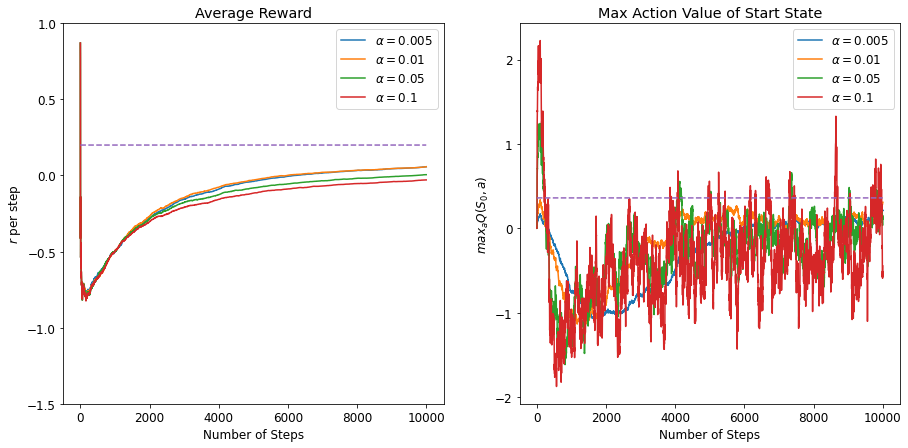

##**Reward Variance : (-42, 40)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

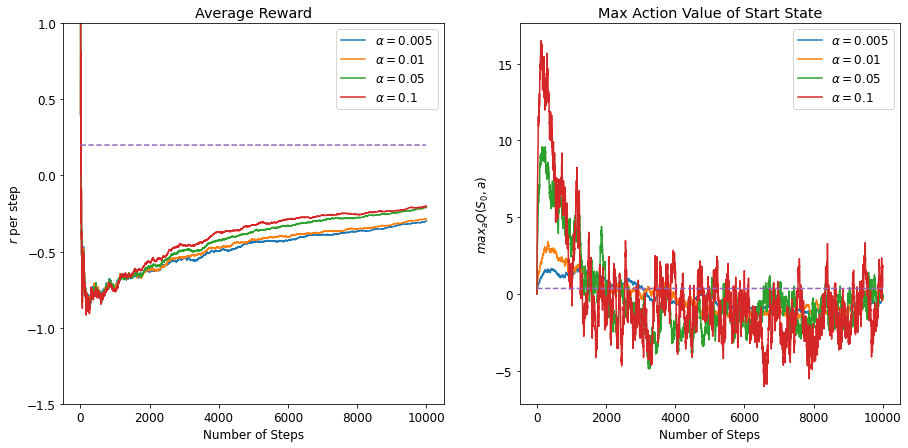

##**Reward Variance : (-72, 70)**

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

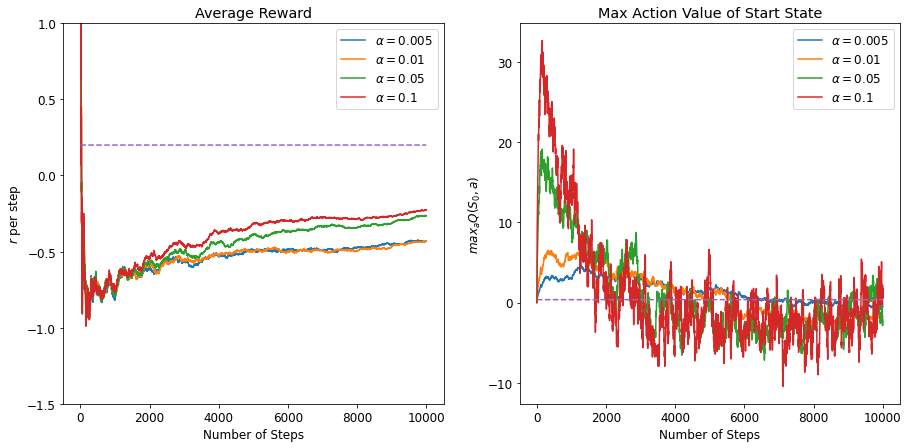

In [ ]:
for n in n_values:
    printmd(f"##**n={n}**")
    for offset in offsets:
        printmd(f"##**Reward Variance : ({-12 - offset}, {10 + offset})**")
        small_gridworld_sweep_plotting_fixed_alpha_only(revw_nsarsa_outputs[n][offset], params, alphas=alphas)

## Effect of reward variance on constant step size

In [64]:
# Sarsa performance on environments with different offsets
alphas = [0.005, 0.01, 0.05, 0.1]
offsets = [0, 30, 60]
agent_outputs = dict()
agents = [SarsaAgent, QLAgent]
for agent in agents:
    print(f"Algorithm: {agent.algorithm}")
    agent_outputs[agent.algorithm] = dict()
    for offset in offsets:
        print(f"Offset - {offset}")
        env_info={"reward_info": {"type": 0, "offset": offset}}
        output, params = run_agent_alpha_sweep(agent, env_info=env_info, alphas=alphas, exponents = [], lin_poly=False)
        agent_outputs[agent.algorithm][offset] = output

Algorithm: Sarsa
Offset - 0



Offset - 30



Offset - 60



Algorithm: Q-Learning
Offset - 0



Offset - 30



Offset - 60


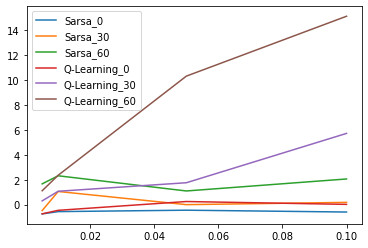

In [ ]:
op = copy(agent_outputs)
# op.pop(QLAgent.algorithm)
small_gridworld_reward_variance_plotting(op, alphas)

In [179]:
alphas = [0.005, 0.01, 0.05, 0.1]


No handles with labels found to put in legend.


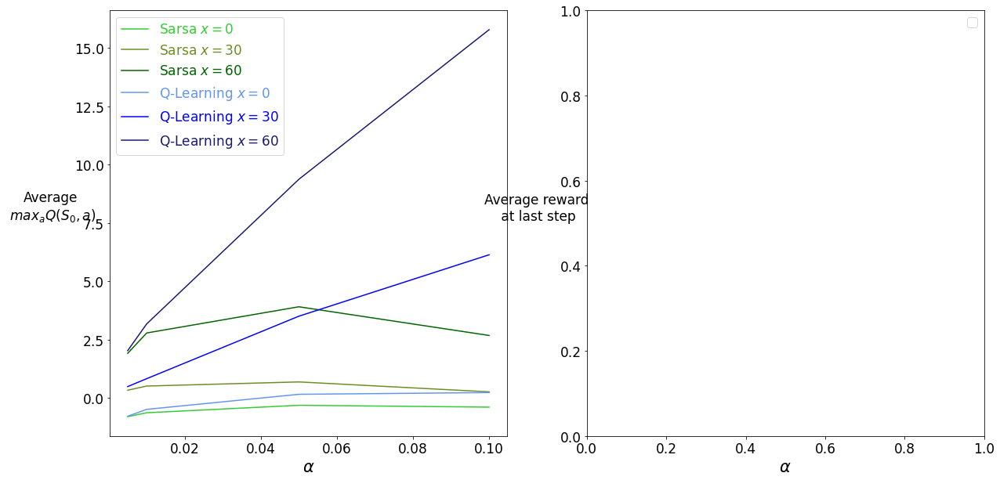

In [204]:
small_gridworld_reward_variance_plotting(agent_outputs, alphas)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


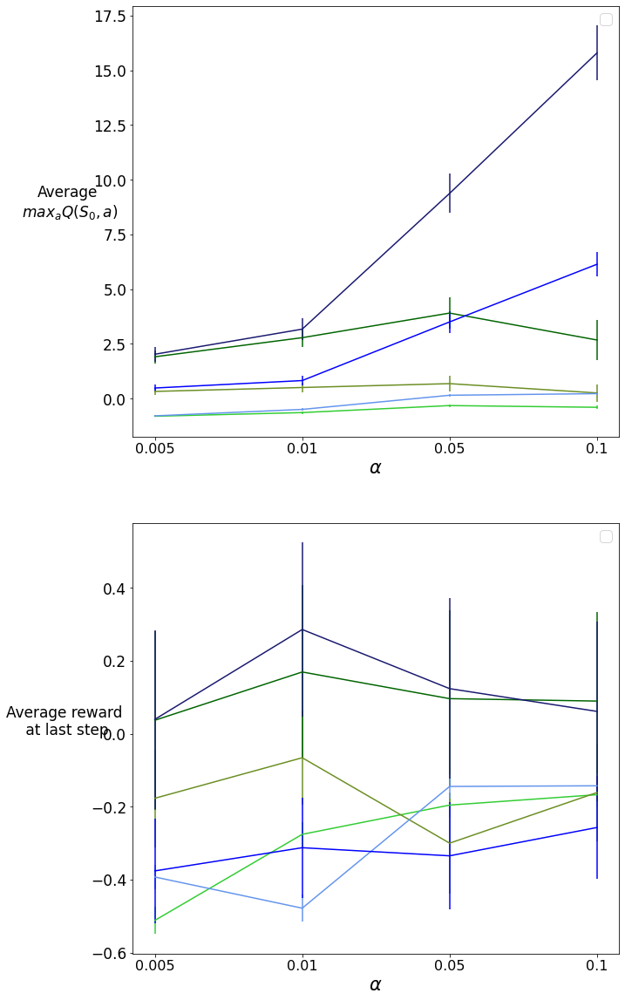

In [206]:
small_gridworld_reward_variance_plotting(agent_outputs, alphas)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


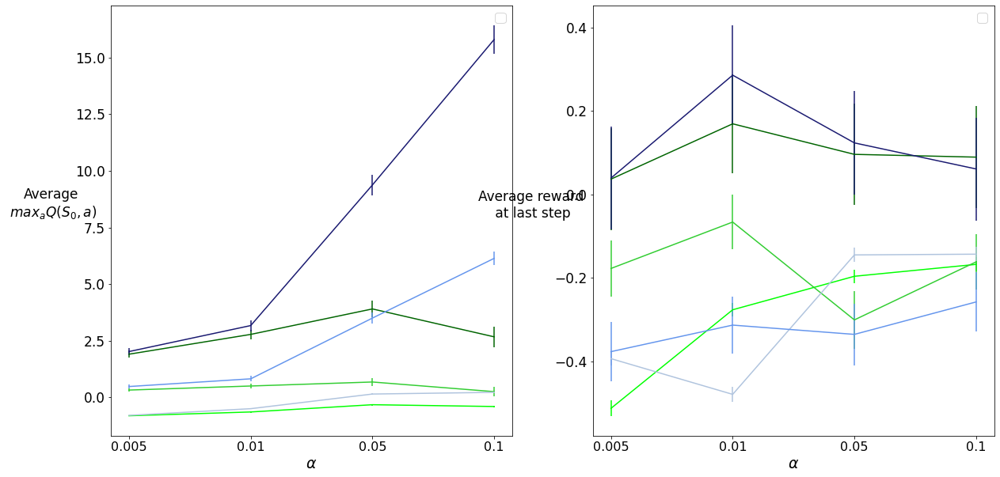

In [185]:
small_gridworld_reward_variance_plotting(agent_outputs, alphas)

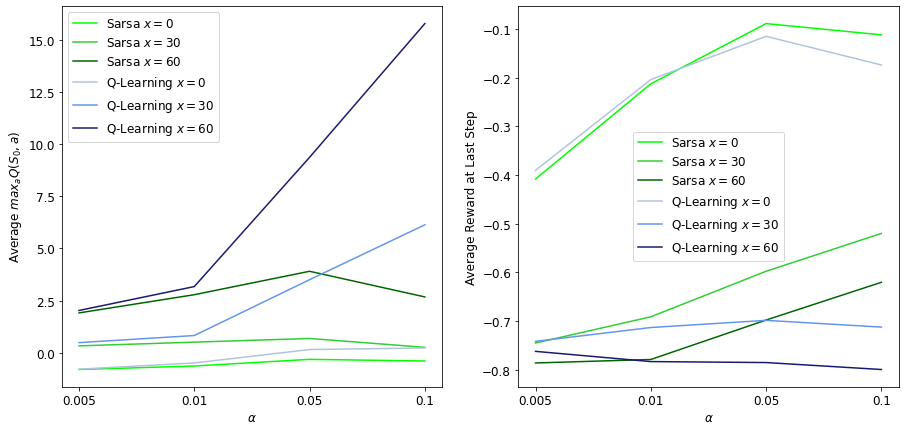

In [ ]:
small_gridworld_reward_variance_plotting(agent_outputs, alphas)

# Experiments - 1x2 Grid World

## Double Q-Learning for solving 1x4 Grid World

In [ ]:
def double_q_learning_small_mdp(agent_info, env_info, run_info):
    num_runs = run_info.get("num_runs", 1000)
    num_episodes = run_info.get("num_episodes", 10)
    max_steps = run_info.get("max_steps", 10000)

    env = TwoStateMDPEnvironment()
    agent = DoubleQLAgent()

    max_action_start_state = np.zeros((num_runs, max_steps))
    selected_action_A = np.zeros((num_runs, num_episodes))
    average_reward = np.zeros((num_runs, max_steps))

    for run in tqdm(range(num_runs), desc="Runs"):
        #initialize environment and agent
        env_info["seed"] = run
        env.env_init(env_info)
        agent_info["seed"] = run
        agent.agent_init(agent_info)
        num_steps = 0
        steps_limit_reached = False
        for episode in range(num_episodes):
        # while not steps_limit_reached:
            #start the episode with first state, action
            start_state = env.env_start()
            action = agent.agent_start(start_state)
            # Store action selected from State A
            selected_action_A[run][episode] = action
            is_terminal = False

            #while episode has not terminated agent takes steps
            while True:
                reward, state, is_terminal = env.env_step(action)
                # Calculate average reward using incremental update (sample average)
                if num_steps == 0:
                    average_reward[run][num_steps] = reward
                else:
                    average_reward[run][num_steps] = average_reward[run][num_steps-1] + (1/num_steps)*(reward - average_reward[run][num_steps-1])
                # Find the maximal action value of the start state. Use the argmax function of the agent. 
                # max_action_start_state[run][num_steps] = agent.q[start_state, agent.argmax(agent.q[start_state, :])]
                num_steps += 1
                # if num_steps == max_steps:
                #     steps_limit_reached = True
                #     break
                #if in terminal state end episode
                if is_terminal:
                    agent.agent_end(reward)
                    env.env_cleanup()
                    break
                #if epsiode hasn't ended then agent takes action
                action = agent.agent_step(reward, state)
    return selected_action_A

In [ ]:
env_info = {}
agent_info = {
    "num_states": 4,
    "num_actions": 10,
    "epsilon": 0.1,
    "gamma": 1,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 0,
    "exploration_type": 0,
    "state_action_mapping": {2: [0, 1], 1: list(range(10))}
}
run_info = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
double_q_learning_action_A = double_q_learning_small_mdp(agent_info, env_info, run_info)

## Single Function for rest of the agents

In [50]:
def run_agent_1x2(agent_cls, agent_info, env_info, run_info):
    num_runs = run_info.get("num_runs", 1000)
    num_episodes = run_info.get("num_episodes", 10)
    max_steps = run_info.get("max_steps", 10000)

    env = TwoStateMDPEnvironment()
    agent = agent_cls()

    max_action_start_state = np.zeros((num_runs, max_steps))
    selected_action_A = np.zeros((num_runs, num_episodes))
    average_reward = np.zeros((num_runs, max_steps))


    for run in tqdm(range(num_runs), desc="Runs"):
        #initialize environment and agent
        env_info["seed"] = run
        env.env_init(env_info)
        agent_info["seed"] = run
        agent.agent_init(agent_info)
        num_steps = 0
        steps_limit_reached = False
        for episode in range(num_episodes):
        # while not steps_limit_reached:
            #start the episode with first state, action
            start_state = env.env_start()
            action = agent.agent_start(start_state)
            # Store action selected from State A
            selected_action_A[run][episode] = action
            is_terminal = False

            #while episode has not terminated agent takes steps
            while True:
                reward, state, is_terminal = env.env_step(action)
                # Calculate average reward using incremental update (sample average)
                if num_steps == 0:
                    average_reward[run][num_steps] = reward
                else:
                    average_reward[run][num_steps] = average_reward[run][num_steps-1] + (1/num_steps)*(reward - average_reward[run][num_steps-1])
                # Find the maximal action value of the start state. Use the argmax function of the agent. 
                max_action_start_state[run][num_steps] = agent.q[start_state, agent.argmax(agent.q[start_state, :])]
                num_steps += 1
                # if num_steps == max_steps:
                #     steps_limit_reached = True
                #     break
                #if in terminal state end episode
                if is_terminal:
                    agent.agent_end(reward)
                    env.env_cleanup()
                    break
                #if epsiode hasn't ended then agent takes action
                action = agent.agent_step(reward, state)
    
    return selected_action_A

## Q-Learning for solving 1x4 Grid World

In [ ]:
qlearning_1x2gw_params = dict()
qlearning_1x2gw_params["agent_cls"] = QLAgent
qlearning_1x2gw_params["env_info"] = {}
qlearning_1x2gw_params["agent_info"] = {
    "num_states": 4,
    "num_actions": 10,
    "epsilon": 0.1,
    "gamma": 1,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 0,
    "exploration_type": 0,
    "state_action_mapping": {2: [0, 1], 1: list(range(10))}
}
qlearning_1x2gw_params["run_info"] = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
q_learning_action_A = run_agent_1x2(**qlearning_1x2gw_params)

## SARSA for solving 1x4 Grid World

In [ ]:
sarsa_1x2gw_params = dict()
sarsa_1x2gw_params["agent_cls"] = SarsaAgent
sarsa_1x2gw_params["env_info"] = {}
sarsa_1x2gw_params["agent_info"] = {
    "num_states": 4,
    "num_actions": 10,
    "epsilon": 0.1,
    "gamma": 1,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 0,
    "exploration_type": 0,
    "state_action_mapping": {2: [0, 1], 1: list(range(10))}
}
sarsa_1x2gw_params["run_info"] = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
sarsa_action_A = run_agent_1x2(**sarsa_1x2gw_params)

## Expected SARSA for solving 1x4 Grid World

In [ ]:
esarsa_1x2gw_params = dict()
esarsa_1x2gw_params["agent_cls"] = ExpectedSarsaAgent
esarsa_1x2gw_params["env_info"] = {}
esarsa_1x2gw_params["agent_info"] = {
    "num_states": 4,
    "num_actions": 10,
    "epsilon": 0.1,
    "gamma": 1,
    "alpha": 0.1,
    "seed": 0,
    "learning_type": 0,
    "exploration_type": 0,
    "state_action_mapping": {2: [0, 1], 1: list(range(10))}
}
esarsa_1x2gw_params["run_info"] = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
esarsa_action_A = run_agent_1x2(**esarsa_1x2gw_params)

## % Left Action from A plot for all agents

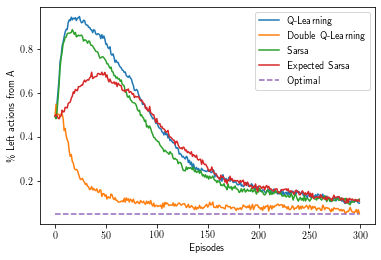

In [ ]:
plt.plot(np.mean(q_learning_action_A, axis=0), label="Q-Learning")
plt.plot(np.mean(double_q_learning_action_A, axis=0), label="Double Q-Learning")
plt.plot(np.mean(sarsa_action_A, axis=0), label="Sarsa")
plt.plot(np.mean(esarsa_action_A, axis=0), label="Expected Sarsa")
# plt.plot(np.mean(nsarsa_action_A, axis=0), label="n=3 Sarsa")
plt.plot(np.ones(run_info["num_episodes"]) * 0.05, "--", label='Optimal')
plt.xlabel("Episodes")
plt.ylabel("\% Left actions from A")
plt.legend()
plt.show()

## Hyper Parameter Sweeps for 1x2 Grid World

### Define sweep functions

In [51]:
def run_agent_alpha_sweep_1x2(agent_class, num_steps=1, env_info={}, exploration=1):
    # need to track results from each run
    outputs = dict()

    # array of fixed alphas
    agent_1x2gw_sw_params = dict()
    agent_1x2gw_sw_params["alphas"] = [0.1, 0.05, 0.01]
    agent_1x2gw_sw_params['exponents'] = [0.8, 0.5, 0.2]

    agent_1x2gw_params = dict()
    agent_1x2gw_params["agent_cls"] = agent_class
    agent_1x2gw_params["env_info"] = {}
    agent_1x2gw_params["agent_info"] = {
        "num_states": 4,
        "num_actions": 10,
        "epsilon": 0.1,
        "gamma": 1,
        "alpha": 0.1,
        "seed": 0,
        "learning_type": 1,
        "exploration_type": exploration,
        "state_action_mapping": {2: [0, 1], 1: list(range(10))},
        "n_steps": num_steps
    }
    agent_1x2gw_params["run_info"] = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
    
    # get results for linear decay alpha
    outputs['linear_alpha'] = run_agent_1x2(**agent_1x2gw_params)

    # change alpha to poly decay
    agent_1x2gw_params['agent_info']['learning_type'] = 2

    # get results for poly decay alpha
    outputs['poly_alpha'] = []
    for exp in agent_1x2gw_sw_params['exponents']:
        agent_1x2gw_params['agent_info']['exponent'] = exp
        outputs['poly_alpha'].append(run_agent_1x2(**agent_1x2gw_params))

    # iterate through fixed alphas
    outputs['fixed'] = []
    agent_1x2gw_params['agent_info']['learning_type'] = 0
    for alpha in agent_1x2gw_sw_params["alphas"]:
        agent_1x2gw_params["agent_info"]["alpha"] = alpha
        outputs['fixed'].append(run_agent_1x2(**agent_1x2gw_params))

    return outputs, agent_1x2gw_params

def run_agent_epsilon_sweep_1x2(agent_class, num_steps=1, env_info={}, learn_type=2, alpha=0.1):
    # need to track results from each run
    outputs = dict()

    # array of fixed alphas
    agent_1x2gw_sw_params = dict()
    agent_1x2gw_sw_params["epsilons"] = [0.5, 0.2, 0.1, 0.05, 0.01]

    agent_1x2gw_params = dict()
    agent_1x2gw_params["agent_cls"] = agent_class
    agent_1x2gw_params["env_info"] = {}
    agent_1x2gw_params["agent_info"] = {
        "num_states": 4,
        "num_actions": 10,
        "epsilon": 0.1,
        "gamma": 1,
        "alpha": 0.1,
        "seed": 0,
        "learning_type": 2,
        "exploration_type": 1,
        "state_action_mapping": {2: [0, 1], 1: list(range(10))},
        "n_steps": num_steps
    }
    agent_1x2gw_params["run_info"] = {"num_runs": 1000, "num_episodes": 300, "max_steps": 10000}
    
    # get results for decay epsilon
    outputs['decay'] = run_agent_1x2(**agent_1x2gw_params)

    # iterate through fixed epsilons
    outputs['fixed'] = []
    agent_1x2gw_params['agent_info']['exploration_type'] = 0
    for epsilon in agent_1x2gw_sw_params["epsilons"]:
        agent_1x2gw_params["agent_info"]["epsilon"] = epsilon
        outputs['fixed'].append(run_agent_1x2(**agent_1x2gw_params))

    return outputs, agent_1x2gw_params

### Define plot functions

In [77]:
def plot_ci_curve(axis, metric, num_runs, label):
      all_sterrs = np.std(metric, axis=0) / np.sqrt(num_runs)
      all_means = np.mean(metric, axis=0)
      color = next(axis._get_lines.prop_cycler)['color']
      axis.fill_between(range(300), all_means - 2* all_sterrs, all_means + 2*all_sterrs, alpha=0.2, color=color)
      axis.plot(all_means, color=color, label=label)

def alpha_sweep_plotting_1x2_decay(plt_data, exp_info):
    num_runs = 1000
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    plt.figure(figsize=(10,10))
    # plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="$ \\alpha=1/n(s,a)$")
    ax = plt.gca()
    plot_ci_curve(ax, plt_data['linear_alpha'], num_runs, "$ \\alpha=1/n(s,a)$")
    exponents = [0.8, 0.5, 0.2]
    
    for i, result in enumerate(plt_data['poly_alpha']):
        # plt.plot(np.mean(result, axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
        plot_ci_curve(ax, result, num_runs, '$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    alphas = [0.1, 0.05, 0.01]
    for i, result in enumerate(plt_data['fixed']):
        # plt.plot(np.mean(result, axis=0), label=f'$ \\alpha={alphas[i]}$')
        plot_ci_curve(ax, result, num_runs, f'$ \\alpha={alphas[i]}$')
    plt.xlabel("Episodes", rotation=0)
    plt.ylabel("% left actions\n from A", rotation=0, labelpad=30)
    plt.ylim(0, 1)
    plt.legend(labelcolor='linecolor')
    plt.savefig('sarsa_1x2_alpha_sweep_decay_epsilon.svg', format='svg')
    plt.show()

def alpha_sweep_plotting_1x2_decay_fixed_only(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    #plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="$ \\alpha=1/n(s,a)$")
    #exponents = [0.2, 0.5, 0.8]
    #for i, result in enumerate(plt_data['poly_alpha']):
        #plt.plot(np.mean(result, axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    alphas = [0.1, 0.05, 0.01]
    
    for i, result in enumerate(plt_data['fixed']):
        plt.plot(np.mean(result, axis=0), label=f'Alpha={alphas[i]}')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

def alpha_sweep_plotting_1x2_decay_decay_only(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="$ \\alpha=1/n(s,a)$")
    exponents = [0.8, 0.5, 0.2]
    for i, result in enumerate(plt_data['poly_alpha']):
        plt.plot(np.mean(result, axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    #alphas = [0.1, 0.05, 0.01]
    #for i, result in enumerate(plt_data['fixed']):
        #plt.plot(np.mean(result, axis=0), label=f'Alpha={alphas[i]}')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

def alpha_sweep_plotting_1x2_fixed(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="Alpha=1/$n(s,a)$")
    exponents = [0.8, 0.5, 0.2]
    for i, result in enumerate(plt_data['poly_alpha']):
        plt.plot(np.mean(result, axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    alphas = [0.1, 0.05, 0.01]
    for i, result in enumerate(plt_data['fixed']):
        plt.plot(np.mean(result, axis=0), label=f'Alpha={alphas[i]}')
    plt.plot(np.ones(exp_info['run_info']['num_episodes']) * exp_info['agent_info']['epsilon'] / 2, "--", label='Optimal')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

def alpha_sweep_plotting_1x2_fixed_fixed_only(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    #plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="Alpha=1/$n(s,a)$")
    #plt.plot(np.mean(plt_data['poly_alpha'], axis=0), label="Alpha=1/$n(s,a)^{0.8}$")
    alphas = [0.1, 0.05, 0.01]
    for i, result in enumerate(plt_data['fixed']):
        plt.plot(np.mean(result, axis=0), label=f'Alpha={alphas[i]}')
    plt.plot(np.ones(exp_info['run_info']['num_episodes']) * exp_info['agent_info']['epsilon'] / 2, "--", label='Optimal')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

def alpha_sweep_plotting_1x2_fixed_decay_only(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    plt.plot(np.mean(plt_data['linear_alpha'], axis=0), label="Alpha=1/$n(s,a)$")
    exponents = [0.8, 0.5, 0.2]
    for i, result in enumerate(plt_data['poly_alpha']):
        plt.plot(np.mean(result, axis=0), label='$ \\alpha=1/n(s,a)^{' + str(exponents[i]) + '}$')
    #alphas = [0.1, 0.05, 0.01]
    #for i, result in enumerate(plt_data['fixed']):
        #plt.plot(np.mean(result, axis=0), label=f'Alpha={alphas[i]}')
    plt.plot(np.ones(exp_info['run_info']['num_episodes']) * exp_info['agent_info']['epsilon'] / 2, "--", label='Optimal')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

def epsilon_sweep_plotting_1x2(plt_data, exp_info):
    printmd(f"#**Output for {exp_info['agent_cls'].algorithm} on 1x2 Grid World**")
    plt.plot(np.mean(plt_data['decay'], axis=0), label="Epsilon=1/$n(s)$")
    epsilons = [0.5, 0.2, 0.1, 0.05, 0.01]
    for i, result in enumerate(plt_data['fixed']):
        plt.plot(np.mean(result, axis=0), label=f'Epsilon={epsilons[i]}')
    plt.xlabel("Episodes")
    plt.ylabel("% Left actions from A")
    plt.legend()
    plt.show()

### Q Learning

#### Alpha sweep - decaying epsilon

In [ ]:
output_1x2_q1, params_1x2_q1 = run_agent_alpha_sweep_1x2(QLAgent)

#**Output for Q-Learning on 1x2 Grid World**

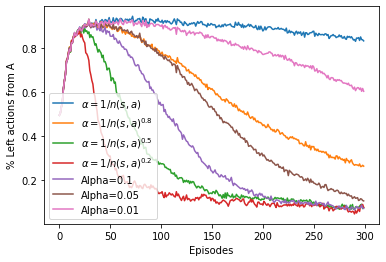

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_q1, params_1x2_q1)

#**Output for Q-Learning on 1x2 Grid World**

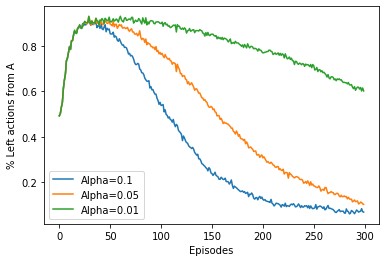

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_q1, params_1x2_q1)

#**Output for Q-Learning on 1x2 Grid World**

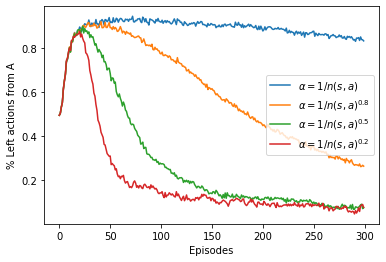

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_q1, params_1x2_q1)

#### Alpha sweep - fixed epsilon

In [ ]:
output_1x2_q2, params_1x2_q2 = run_agent_alpha_sweep_1x2(QLAgent, exploration=0)

#**Output for Q-Learning on 1x2 Grid World**

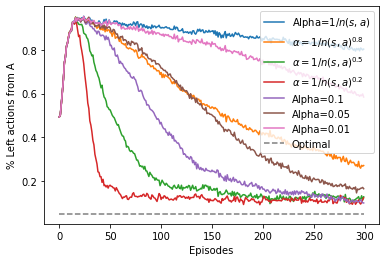

In [ ]:
alpha_sweep_plotting_1x2_fixed(output_1x2_q2, params_1x2_q2)

#**Output for Q-Learning on 1x2 Grid World**

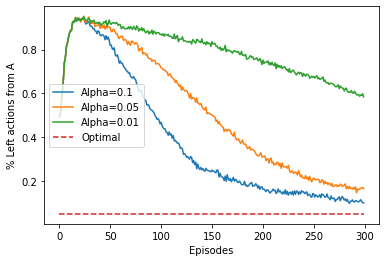

In [ ]:
alpha_sweep_plotting_1x2_fixed_fixed_only(output_1x2_q2, params_1x2_q2)

#**Output for Q-Learning on 1x2 Grid World**

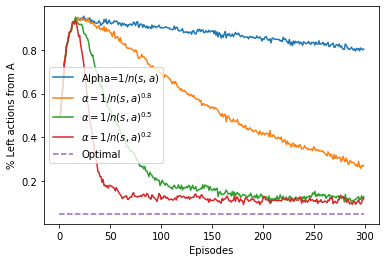

In [ ]:
alpha_sweep_plotting_1x2_fixed_decay_only(output_1x2_q2, params_1x2_q2)

#### Epsilon sweep - poly decay alpha

In [ ]:
output_1x2_q3, params_1x2_q3 = run_agent_epsilon_sweep_1x2(QLAgent)

#**Output for Q-Learning on 1x2 Grid World**

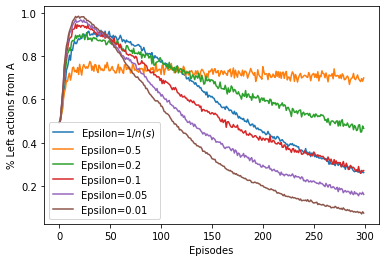

In [ ]:
epsilon_sweep_plotting_1x2(output_1x2_q3, params_1x2_q3)

The results in this environment seemingly differ from the 3x3 gridworld in that the initial peak in left actions, which have negative expected value but due to maximization bias look attractive, is similar for the decaying and fixed alphas. The fixed alphas do overcome the bias more quickly. This may be due to the fact that our % left actions is bounded by 100% (minus the epsilon random chance). Therefore whether the agent thinks the left action has a value of 0.1 or 10 it will still consider left the optimal action over going right and getting 0. Should inspect Q values to confirm this.

#### Epsilon Sweep - Best Alpha

In [ ]:
output_1x2_q4, params_1x2_q4 = run_agent_epsilon_sweep_1x2(QLAgent, learn_type=0, alpha=0.1)

KeyboardInterrupt: ignored

In [ ]:
epsilon_sweep_plotting_1x2(output_1x2_q4, params_1x2_q4)

### Sarsa

#### Alpha sweep - decaying epsilon

In [52]:
output_1x2_s1, params_1x2_s1 = run_agent_alpha_sweep_1x2(SarsaAgent)

#**Output for Sarsa on 1x2 Grid World**

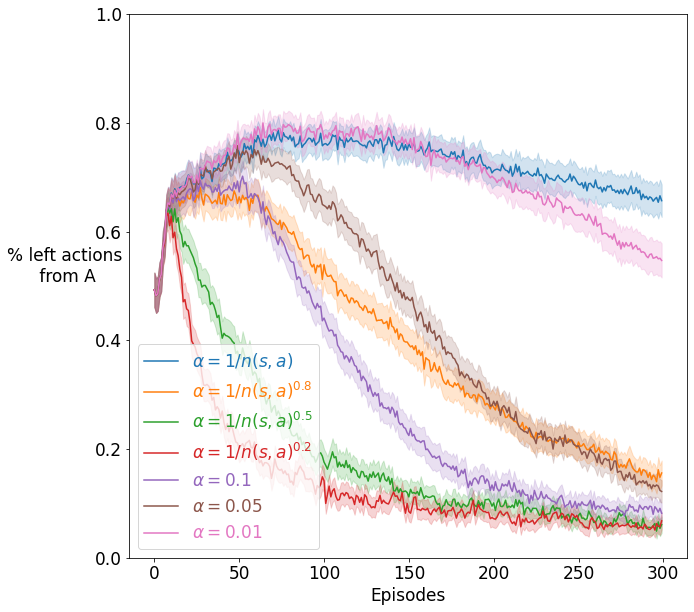

In [78]:
alpha_sweep_plotting_1x2_decay(output_1x2_s1, params_1x2_s1)

#**Output for Sarsa on 1x2 Grid World**

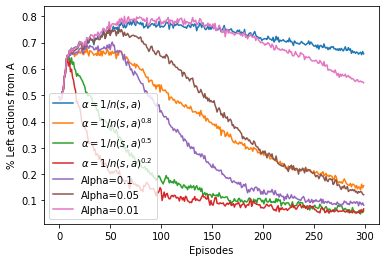

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_s1, params_1x2_s1)

#**Output for Sarsa on 1x2 Grid World**

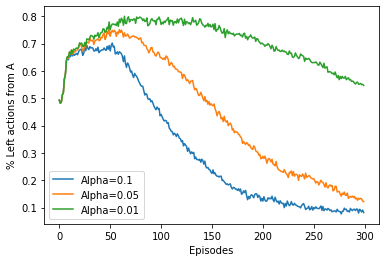

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_s1, params_1x2_s1)

#**Output for Sarsa on 1x2 Grid World**

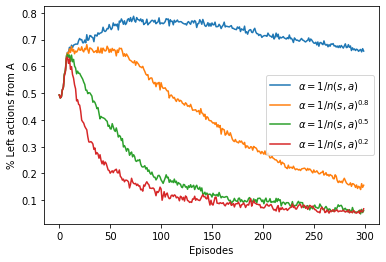

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_s1, params_1x2_s1)

#### Alpha sweep - fixed epsilon

In [ ]:
output_1x2_s2, params_1x2_s2 = run_agent_alpha_sweep_1x2(SarsaAgent, exploration=0)

#**Output for Sarsa on 1x2 Grid World**

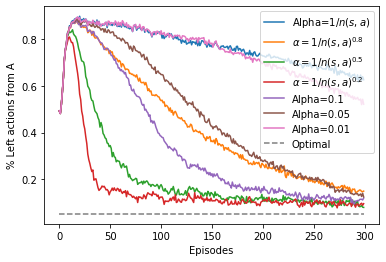

In [ ]:
alpha_sweep_plotting_1x2_fixed(output_1x2_s2, params_1x2_s2)

#**Output for Sarsa on 1x2 Grid World**

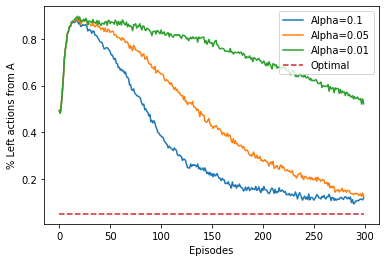

In [ ]:
alpha_sweep_plotting_1x2_fixed_fixed_only(output_1x2_s2, params_1x2_s2)

#**Output for Sarsa on 1x2 Grid World**

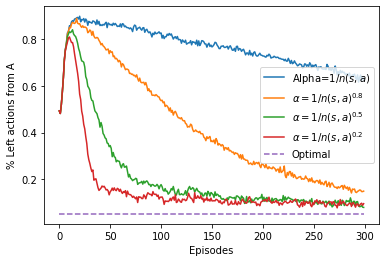

In [ ]:
alpha_sweep_plotting_1x2_fixed_decay_only(output_1x2_s2, params_1x2_s2)

#### Epsilon sweep - poly decay alpha

In [ ]:
output_1x2_s3, params_1x2_s3 = run_agent_epsilon_sweep_1x2(SarsaAgent)

#**Output for Sarsa on 1x2 Grid World**

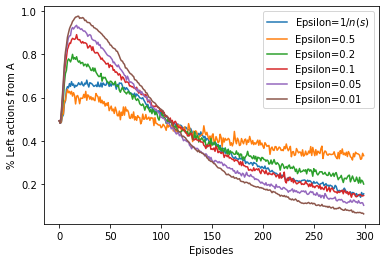

In [ ]:
epsilon_sweep_plotting_1x2(output_1x2_s3, params_1x2_s3)

### Expected Sarsa

#### Alpha sweep - decaying epsilon

In [ ]:
output_1x2_es1, params_1x2_es1 = run_agent_alpha_sweep_1x2(ExpectedSarsaAgent)

#**Output for Expected Sarsa on 1x2 Grid World**

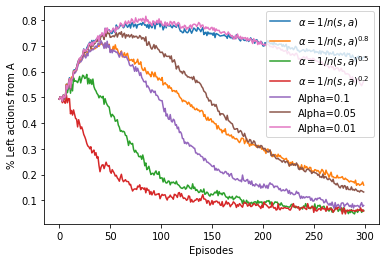

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_es1, params_1x2_es1)

#**Output for Expected Sarsa on 1x2 Grid World**

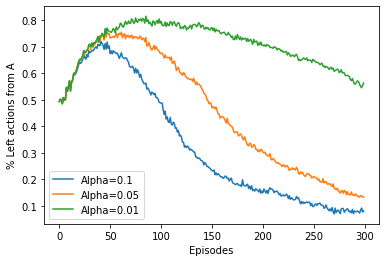

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_es1, params_1x2_es1)

#**Output for Expected Sarsa on 1x2 Grid World**

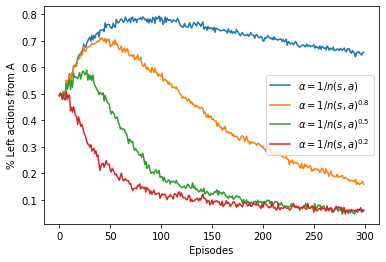

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_es1, params_1x2_es1)

#### Alpha sweep - fixed epsilon

In [ ]:
output_1x2_es2, params_1x2_es2 = run_agent_alpha_sweep_1x2(ExpectedSarsaAgent, exploration=0)

#**Output for Expected Sarsa on 1x2 Grid World**

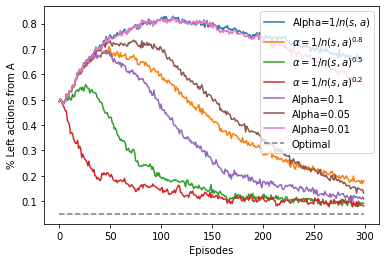

In [ ]:
alpha_sweep_plotting_1x2_fixed(output_1x2_es2, params_1x2_es2)

#**Output for Expected Sarsa on 1x2 Grid World**

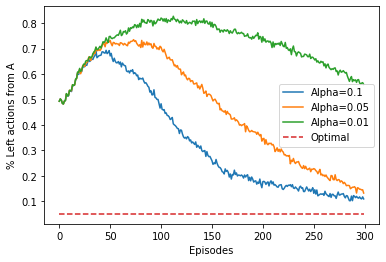

In [ ]:
alpha_sweep_plotting_1x2_fixed_fixed_only(output_1x2_es2, params_1x2_es2)

#**Output for Expected Sarsa on 1x2 Grid World**

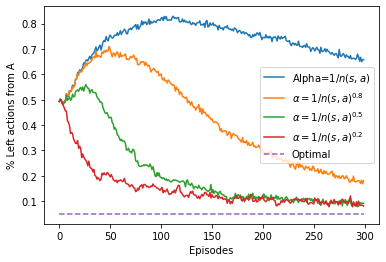

In [ ]:
alpha_sweep_plotting_1x2_fixed_decay_only(output_1x2_es2, params_1x2_es2)

#### Epsilon sweep - poly decay alpha

In [ ]:
output_1x2_es3, params_1x2_es3 = run_agent_epsilon_sweep_1x2(ExpectedSarsaAgent)

#**Output for Expected Sarsa on 1x2 Grid World**

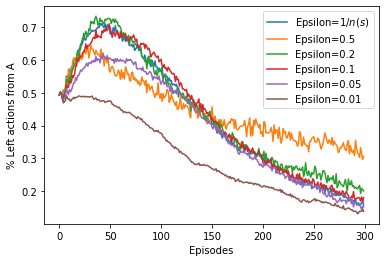

In [ ]:
epsilon_sweep_plotting_1x2(output_1x2_es3, params_1x2_es3)

### N-step Sarsa

#### Alpha sweep - decaying epsilon, n=1

In [ ]:
output_1x2_ns1, params_1x2_ns1 = run_agent_alpha_sweep_1x2(NstepSarsaAgent, num_steps=1)

#**Output for n-step Sarsa on 1x2 Grid World**

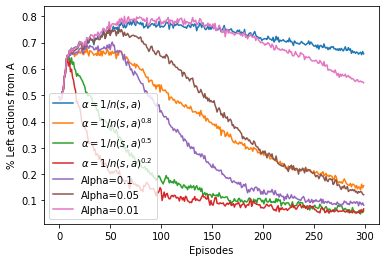

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_ns1, params_1x2_ns1)

#**Output for n-step Sarsa on 1x2 Grid World**

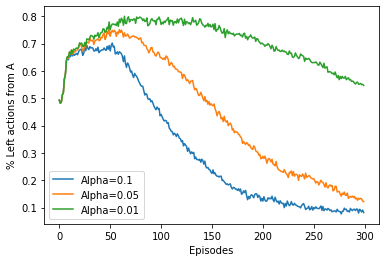

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_ns1, params_1x2_ns1)

#**Output for n-step Sarsa on 1x2 Grid World**

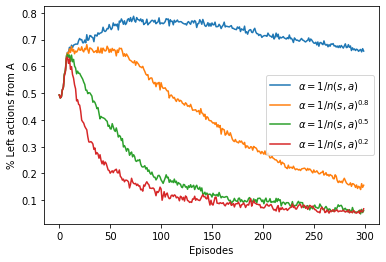

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_ns1, params_1x2_ns1)

#### Alpha sweep - decaying epsilon, n=2

In [ ]:
output_1x2_ns2, params_1x2_ns2 = run_agent_alpha_sweep_1x2(NstepSarsaAgent, num_steps=2)

#**Output for n-step Sarsa on 1x2 Grid World**

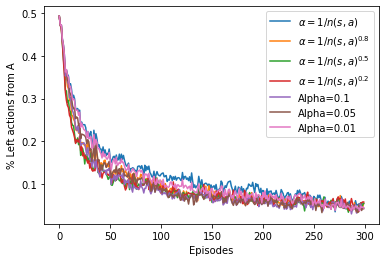

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_ns2, params_1x2_ns2)

#**Output for n-step Sarsa on 1x2 Grid World**

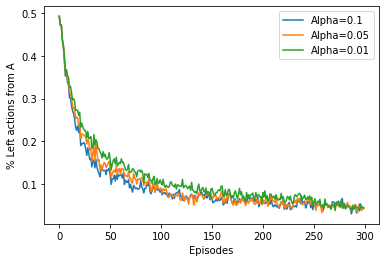

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_ns2, params_1x2_ns2)

#**Output for n-step Sarsa on 1x2 Grid World**

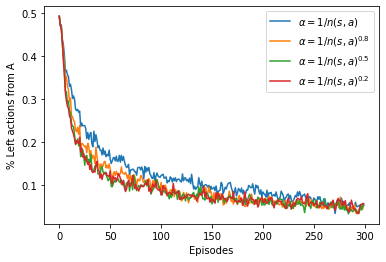

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_ns2, params_1x2_ns2)

#### Alpha sweep - decaying epsilon, n=3

In [ ]:
output_1x2_ns3, params_1x2_ns3 = run_agent_alpha_sweep_1x2(NstepSarsaAgent, num_steps=3)

#**Output for n-step Sarsa on 1x2 Grid World**

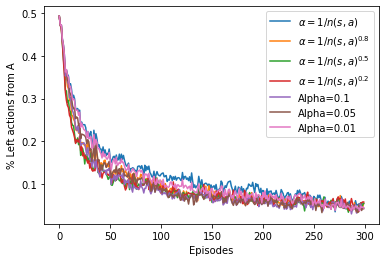

In [ ]:
alpha_sweep_plotting_1x2_decay(output_1x2_ns3, params_1x2_ns3)

In [ ]:
alpha_sweep_plotting_1x2_decay_fixed_only(output_1x2_ns3, params_1x2_ns3)

In [ ]:
alpha_sweep_plotting_1x2_decay_decay_only(output_1x2_ns3, params_1x2_ns3)

#### Epsilon sweep - poly decay alpha

In [ ]:
output_1x2_ns4, params_1x2_ns4 = run_agent_epsilon_sweep_1x2(NstepSarsaAgent, num_steps=2)

#**Output for n-step Sarsa on 1x2 Grid World**

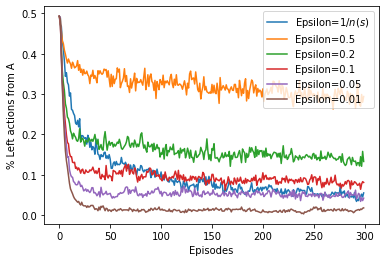

In [ ]:
epsilon_sweep_plotting_1x2(output_1x2_ns4, params_1x2_ns4)

# 3X3 Grid World Actual Action values 

[[2.56 3.75 5.  ]
 [1.43 2.56 3.75]
 [0.36 1.43 2.56]]


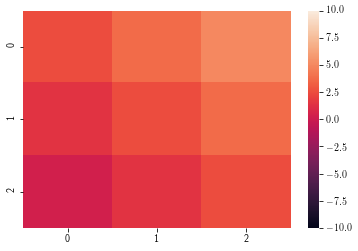

In [ ]:
true_values = np.array([[2.56, 3.75, 5], [1.43, 2.56, 3.75], [0.36, 1.43, 2.56]])
print(true_values)
sns.heatmap(true_values, vmin=-10, vmax=10)
plt.show()

# Ganesh - Presentation graphs

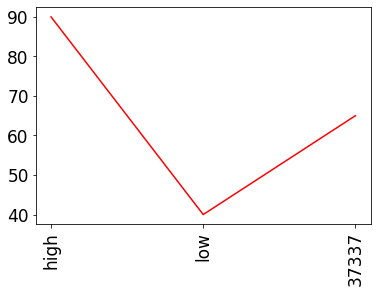

In [ ]:

x = [0,1,2]
y = [90,40,65]
labels = ['high', 'low', 37337]
plt.plot(x,y, 'r')
plt.xticks(x, labels, rotation='vertical')
plt.show()

## Sarsa Alpha sweep Decaying Epsilon

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

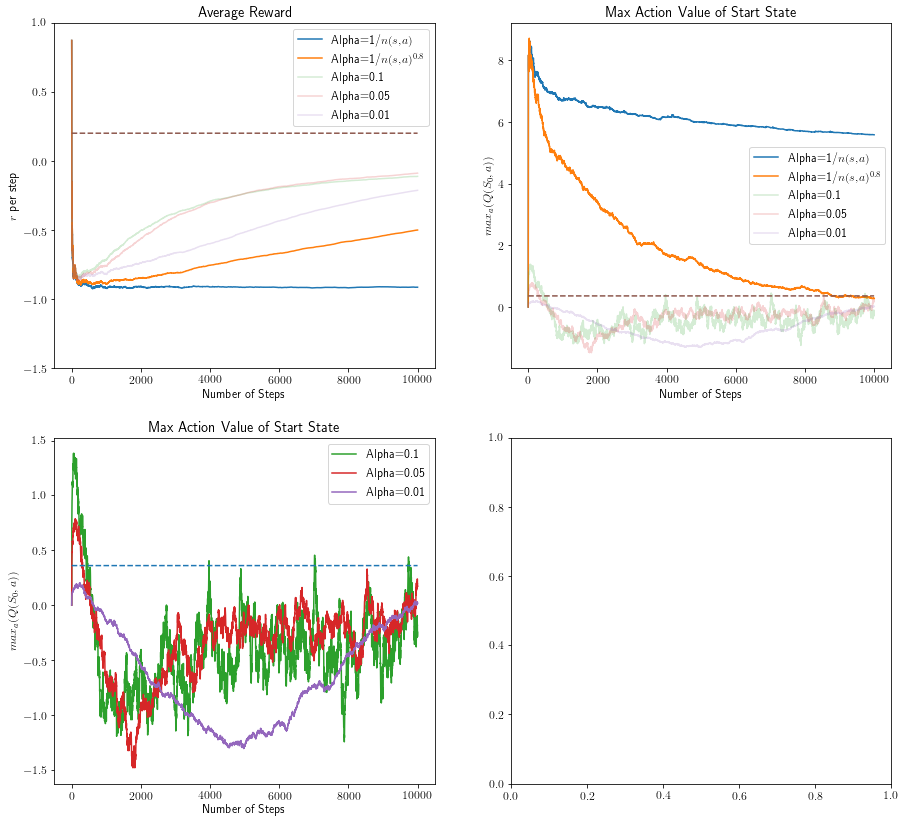

In [ ]:
small_gridworld_sweep_plotting(outputs_s1, params_s1, alpha_const=0.2)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

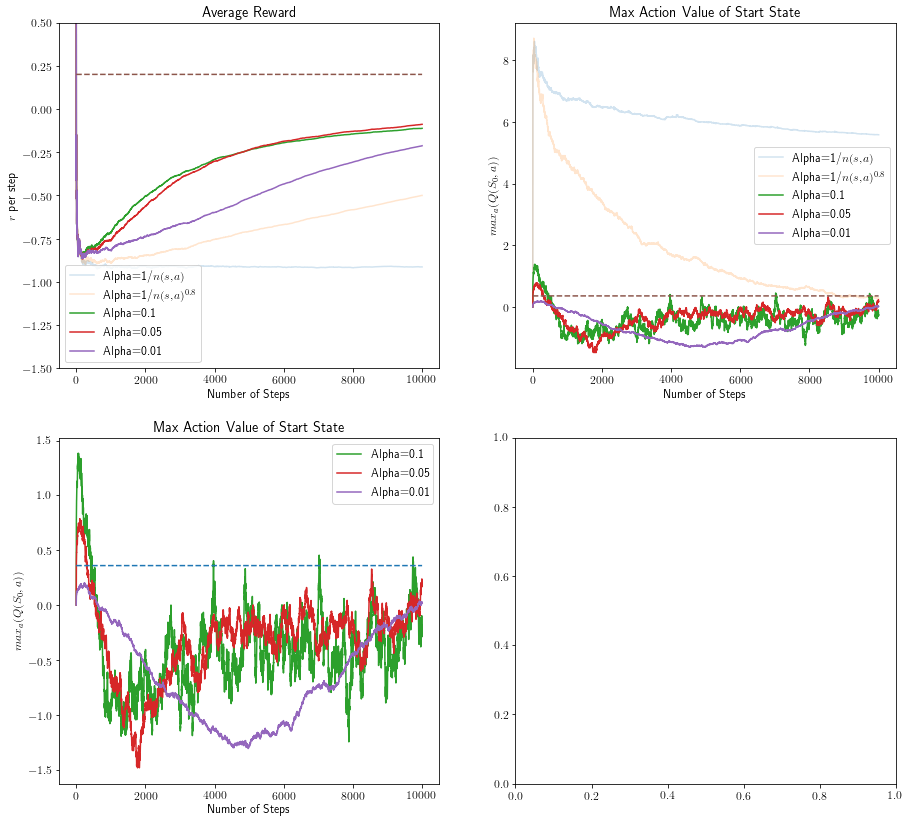

In [ ]:
small_gridworld_sweep_plotting(outputs_s1, params_s1, alpha_lin=0.2)

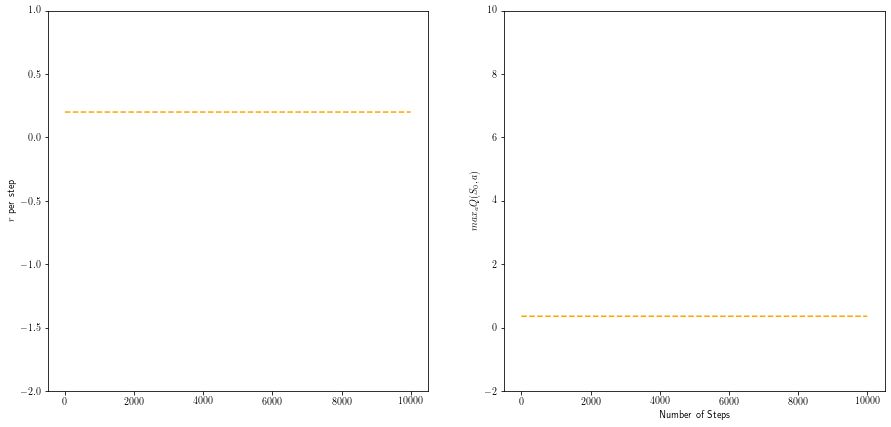

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
ax[0].plot(range(10000), [0.2]*10000, "--", color="orange")
ax[0].set_ylim(-2, 1)
ax[0].set_ylabel("$r$ per step")
ax[1].plot(range(10000), [0.36]*10000, "--", color="orange")
ax[1].set_ylim(-2, 10)
# plt.title("Average Reward")
ax[1].set_ylabel("$max_a Q(S_0, a)$")
ax[1].set_xlabel("Number of Steps")
plt.show()

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

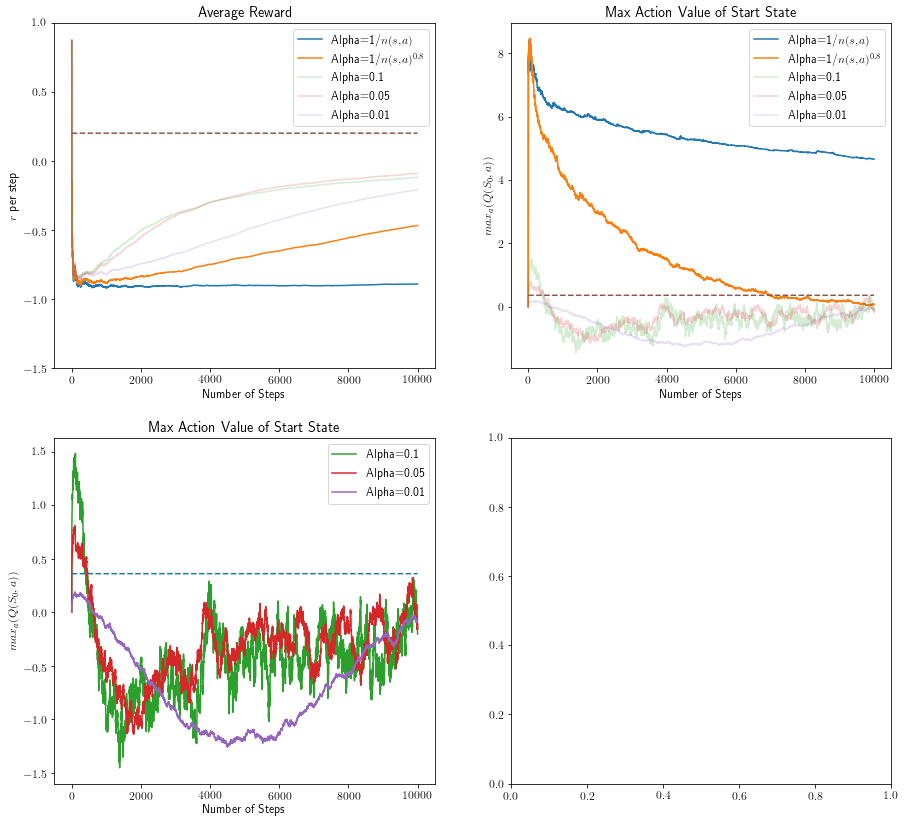

In [ ]:
small_gridworld_sweep_plotting(outputs_es1, params_es1,  alpha_const=0.2)

#**Output for Expected Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

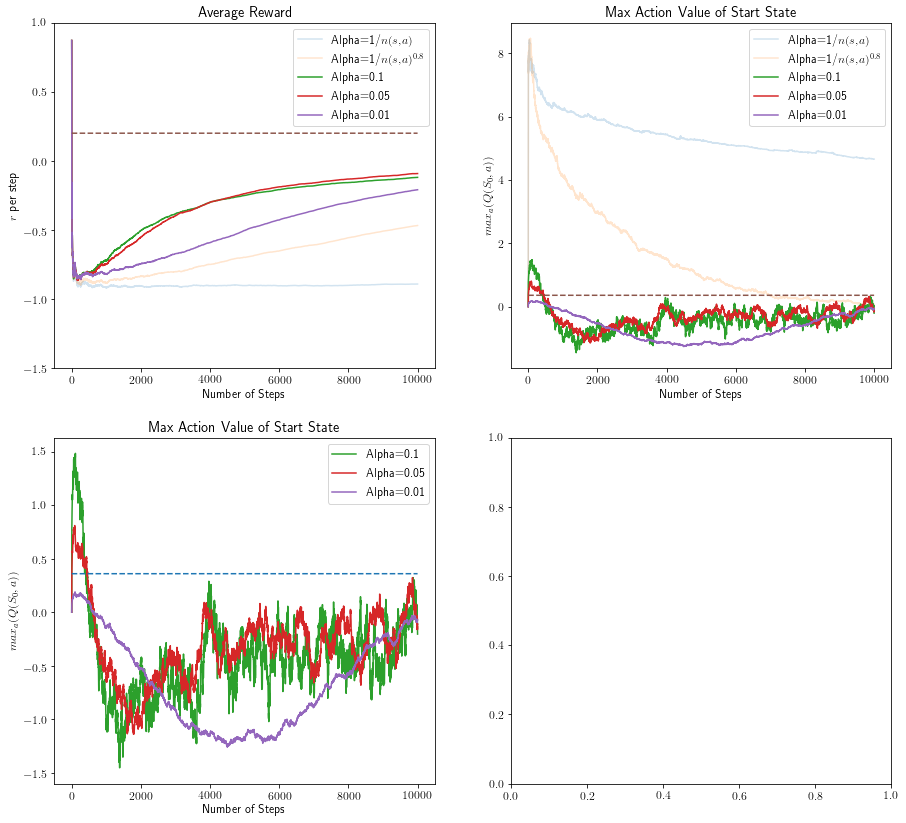

In [ ]:
small_gridworld_sweep_plotting(outputs_es1, params_es1,  alpha_lin=0.2)

In [ ]:
env_info={"reward_info": {"type": 0, "offset": 60}}
# sarsa_output, params = run_agent_alpha_sweep(SarsaAgent, env_info=env_info, alphas=alphas, lin_poly=False)

#**Output for Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

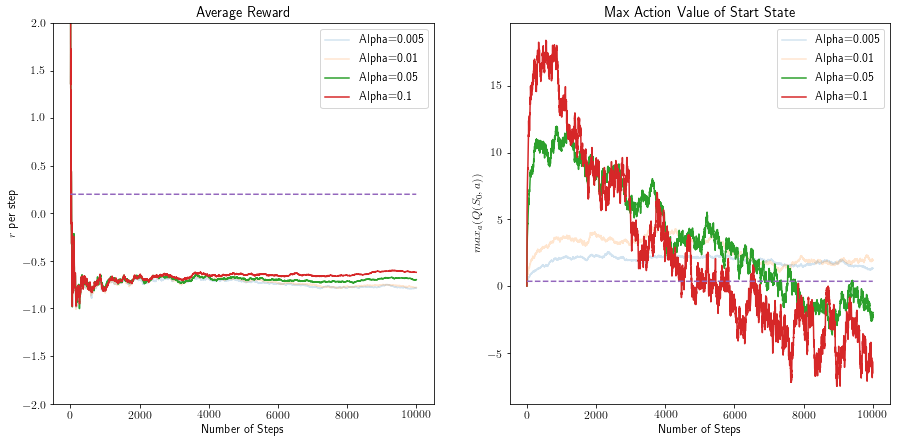

In [ ]:
alphas = [0.005, 0.01, 0.05, 0.1]
alpha_trp = {0.01: 0.2, 0.005: 0.2 }
small_gridworld_sweep_plotting_fixed_alpha_only(sarsa_output, params, alphas=alphas, alpha_transp=alpha_trp)

In [ ]:
alphas = [0.1, 0.05]
n_sarsa_output, params = run_agent_alpha_sweep(NstepSarsaAgent, env_info=env_info, alphas=alphas, lin_poly=False, num_steps=3)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

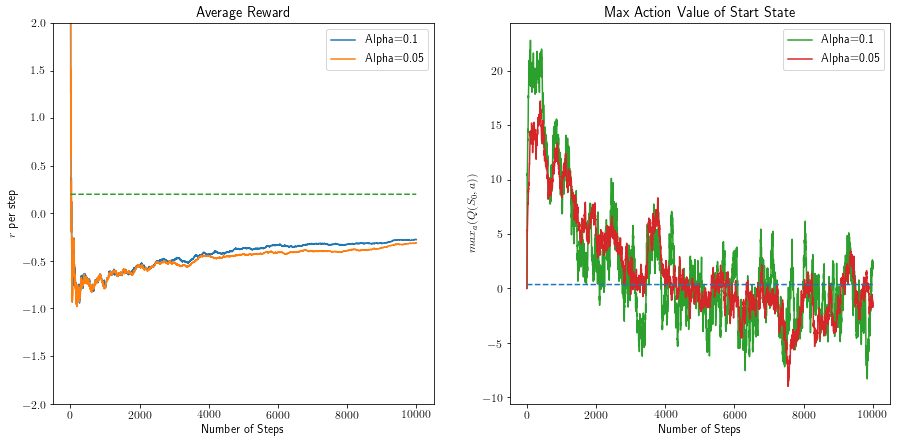

In [ ]:
small_gridworld_sweep_plotting_fixed_alpha_only(n_sarsa_output, params, alphas=alphas)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

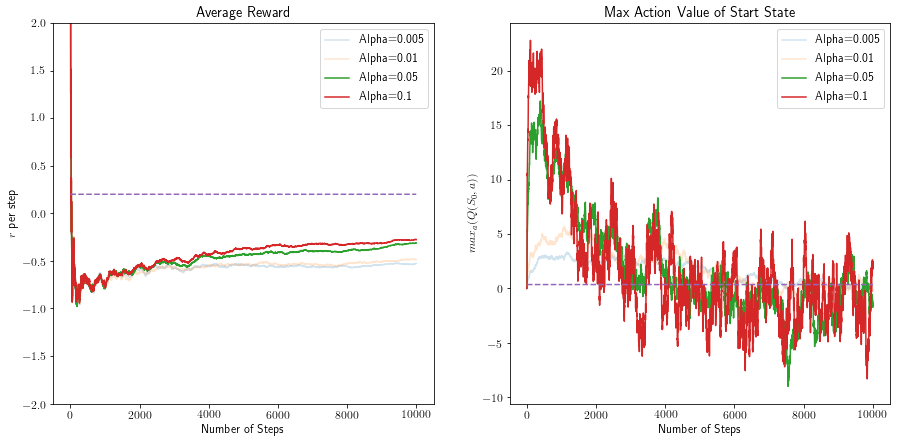

In [ ]:
alphas = [0.005, 0.01, 0.05, 0.1]
alpha_trp = {0.01: 0.2, 0.005: 0.2 }
small_gridworld_sweep_plotting_fixed_alpha_only(n_sarsa_output, params, alphas=alphas, alpha_transp=alpha_trp)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

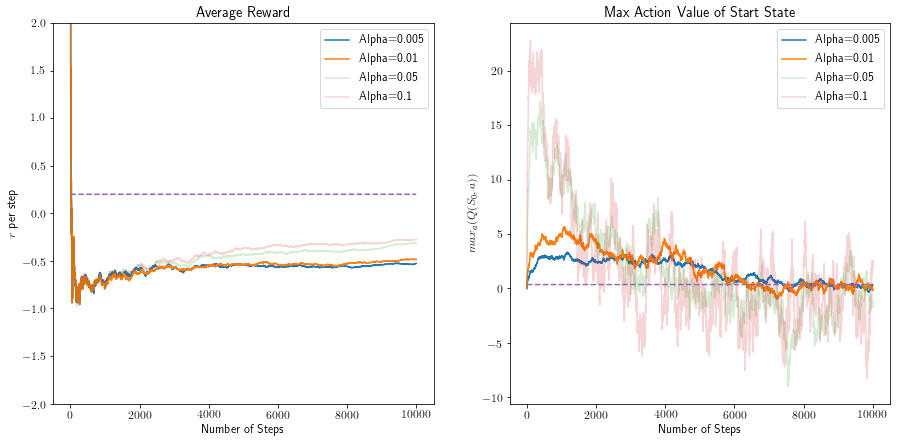

In [ ]:
alpha_trp = {0.1: 0.2, 0.05: 0.2}
small_gridworld_sweep_plotting_fixed_alpha_only(n_sarsa_output, params, alphas=alphas, alpha_transp=alpha_trp)

#**Output for n-step Sarsa on 3x3 Grid World**

##**Average Reward and Max Action Value of Start State**

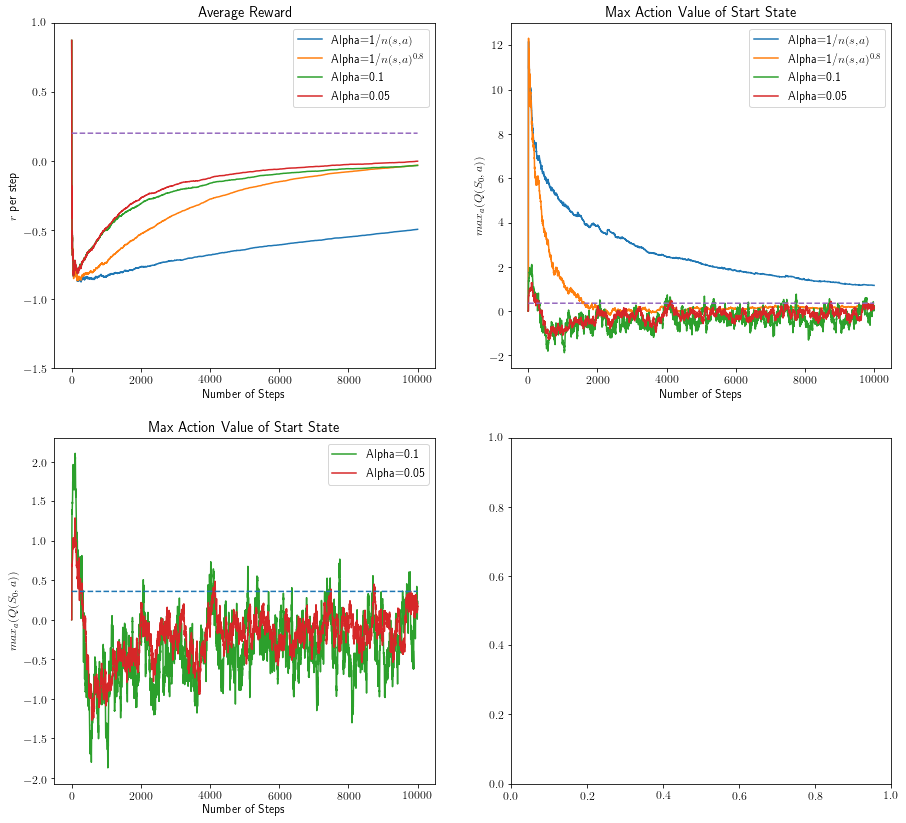

In [ ]:
small_gridworld_sweep_plotting(outputs_ns3, params_ns3)

In [ ]:
print(plt.rcParams['axes.prop_cycle'].by_key()['color'])

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
